<a href="https://colab.research.google.com/github/suryasekhardutta/Code-Clause-Chatbot-using-Json/blob/main/DL_Models.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# prompt: import the libraries

!pip install transformers
from transformers import ViTFeatureExtractor, ViTModel


# Data handling and preprocessing
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler


# Evaluation
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Image processing
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Flatten

# For handling file paths
import os

# For visualizing data and results
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure TensorFlow is installed and up to date
try:
    import tensorflow as tf
    print(f"TensorFlow version: {tf.__version__}")
except ImportError:
    print("TensorFlow is not installed. Installing now...")
    !pip install tensorflow

TensorFlow version: 2.17.0


In [ ]:
import os
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')
path = '/content/drive/MyDrive/Images for Azure/Train/'   # Replace with your folder path
os.chdir(path)

Mounted at /content/drive


              Category Directory    Image Name
0       No Disease (0)         0  0_I_2342.jpg
1       No Disease (0)         0  0_I_2336.jpg
2       No Disease (0)         0  0_I_2346.jpg
3       No Disease (0)         0  0_I_2349.jpg
4       No Disease (0)         0  0_I_2325.jpg
...                ...       ...           ...
14996  Susceptible (S)         S  5_S_1432.jpg
14997  Susceptible (S)         S  5_S_1433.jpg
14998  Susceptible (S)         S  5_S_1438.jpg
14999  Susceptible (S)         S  5_S_1447.jpg
15000  Susceptible (S)         S  5_S_1435.jpg

[15001 rows x 3 columns]


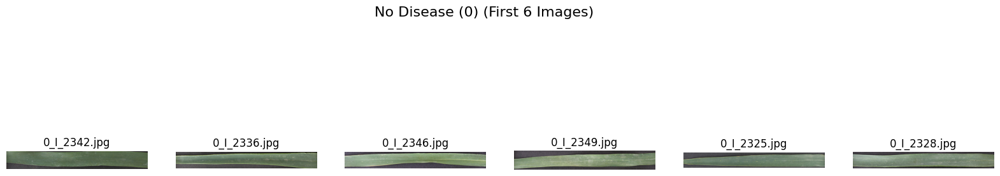

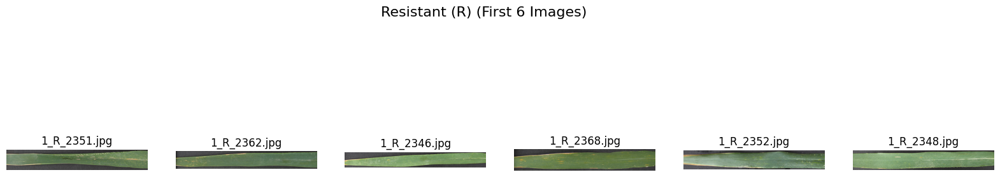

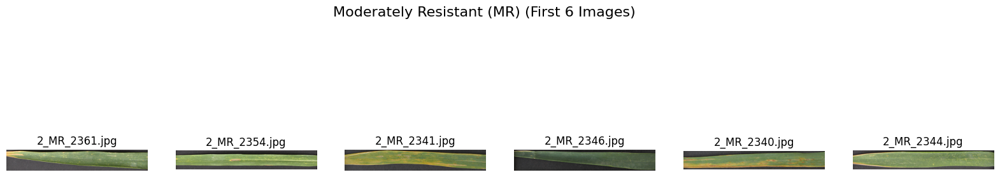

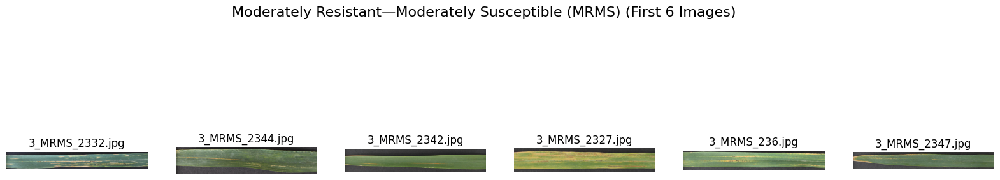

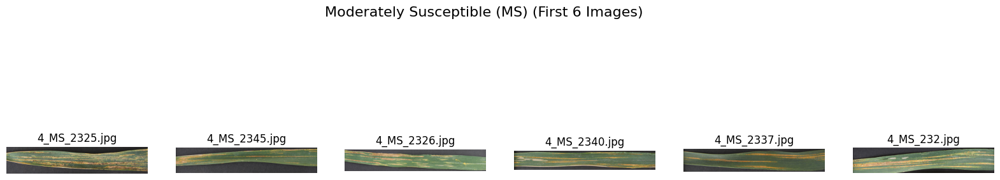

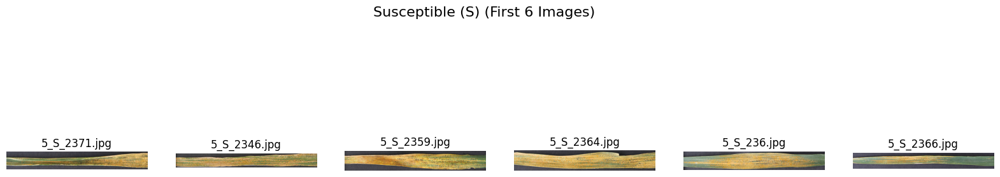

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# Define the base directory where all the categories are stored
base_path = '/content/drive/MyDrive/Images for Azure/Train/'

# Define the categories and their corresponding directories
categories = {
    'No Disease (0)': '0',
    'Resistant (R)': 'R',
    'Moderately Resistant (MR)': 'MR',
    'Moderately Resistant—Moderately Susceptible (MRMS)': 'MRMS',
    'Moderately Susceptible (MS)': 'MS',
    'Susceptible (S)': 'S'
}

# Initialize an empty list to hold the data
data = []

# Iterate through each category and collect image names
for category_name, directory_name in categories.items():
    category_path = os.path.join(base_path, directory_name)
    if os.path.exists(category_path):
        image_names = os.listdir(category_path)
        for image_name in image_names:
            data.append([category_name, directory_name, image_name])
    else:
        print(f"Directory {category_path} does not exist.")

# Create a DataFrame from the collected data
df = pd.DataFrame(data, columns=['Category', 'Directory', 'Image Name'])

# Display the DataFrame
print(df)

# If you want to save this DataFrame to a CSV file, you can use:
# df.to_csv('/content/drive/MyDrive/Images for Azure/image_categories.csv', index=False)

# Function to display the first few images from each category in a grid
def display_images_in_grid(base_path, categories, images_per_category=6):
    for category_name, directory_name in categories.items():
        category_path = os.path.join(base_path, directory_name)
        image_names = os.listdir(category_path)[:images_per_category]  # Select the first few images

        fig, axes = plt.subplots(1, len(image_names), figsize=(20, 5))
        fig.suptitle(f"{category_name} (First {len(image_names)} Images)", fontsize=16)

        for ax, img_name in zip(axes, image_names):
            img_path = os.path.join(category_path, img_name)
            img = plt.imread(img_path)
            ax.imshow(img)
            ax.set_title(img_name)
            ax.axis('off')

        plt.show()

# Display the first 6 images from each category in a grid format
display_images_in_grid(base_path, categories, images_per_category=6)


              Category Directory          Image Name
0       No Disease (0)         0  0_I_2011_aug_0.jpg
1       No Disease (0)         0  0_I_2011_aug_2.jpg
2       No Disease (0)         0  0_I_2032_aug_0.jpg
3       No Disease (0)         0   0_I_201_aug_0.jpg
4       No Disease (0)         0  0_I_2032_aug_2.jpg
...                ...       ...                 ...
28796  Susceptible (S)         S   5_S_740_aug_0.jpg
28797  Susceptible (S)         S   5_S_755_aug_1.jpg
28798  Susceptible (S)         S   5_S_755_aug_2.jpg
28799  Susceptible (S)         S   5_S_740_aug_1.jpg
28800  Susceptible (S)         S    5_S_77_aug_2.jpg

[28801 rows x 3 columns]


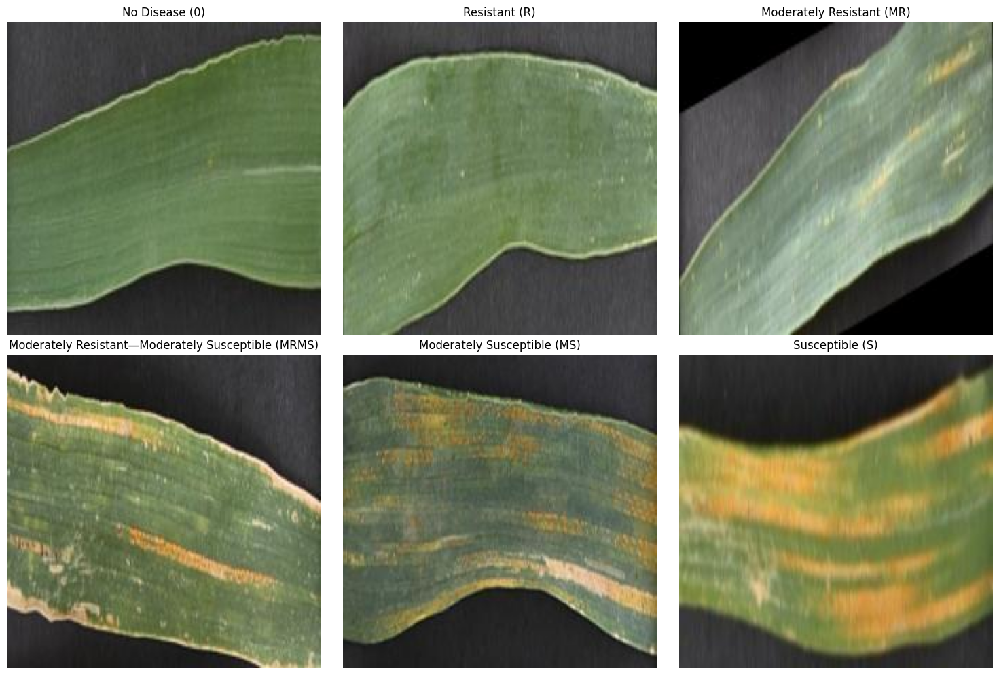

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# Define the base directory where all the categories are stored
path_aug = '/content/drive/MyDrive/Images for Azure/Augmented'

# Define the categories and their corresponding directories
categories = {
    'No Disease (0)': '0',
    'Resistant (R)': 'R',
    'Moderately Resistant (MR)': 'MR',
    'Moderately Resistant—Moderately Susceptible (MRMS)': 'MRMS',
    'Moderately Susceptible (MS)': 'MS',
    'Susceptible (S)': 'S'
}

# Initialize an empty list to hold the data
data = []

# Iterate through each category and collect image names
for category_name, directory_name in categories.items():
    category_path = os.path.join(path_aug, directory_name)
    if os.path.exists(category_path):
        image_names = os.listdir(category_path)
        for image_name in image_names:
            data.append([category_name, directory_name, image_name])
    else:
        print(f"Directory {category_path} does not exist.")

# Create a DataFrame from the collected data
df = pd.DataFrame(data, columns=['Category', 'Directory', 'Image Name'])

# Display the DataFrame
print(df)

# Set up the grid dimensions
num_categories = len(categories)
cols = 3  # Number of columns in the grid
rows = (num_categories + cols - 1) // cols  # Number of rows in the grid

# Create a figure with subplots
fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))
axes = axes.flatten()  # Flatten the 2D array of axes to easily index

# Loop through categories and display the first image in the grid
for idx, (category_name, directory_name) in enumerate(categories.items()):
    category_path = os.path.join(path_aug, directory_name)
    image_names = os.listdir(category_path)
    if image_names:
        img = plt.imread(os.path.join(category_path, image_names[0]))
        axes[idx].imshow(img)
        axes[idx].set_title(category_name)
        axes[idx].axis('off')
    else:
        axes[idx].set_title(f"No images in {category_path}")
        axes[idx].axis('off')

# Hide any unused subplots
for j in range(num_categories, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


                                            Category  Normal Count  \
0                                     No Disease (0)          2500   
1                                      Resistant (R)          2501   
2                          Moderately Resistant (MR)          2500   
3  Moderately Resistant—Moderately Susceptible (M...          2500   
4                        Moderately Susceptible (MS)          2500   
5                                    Susceptible (S)          2500   

   Augmented Count  
0             4801  
1             4800  
2             4800  
3             4800  
4             4800  
5             4800  


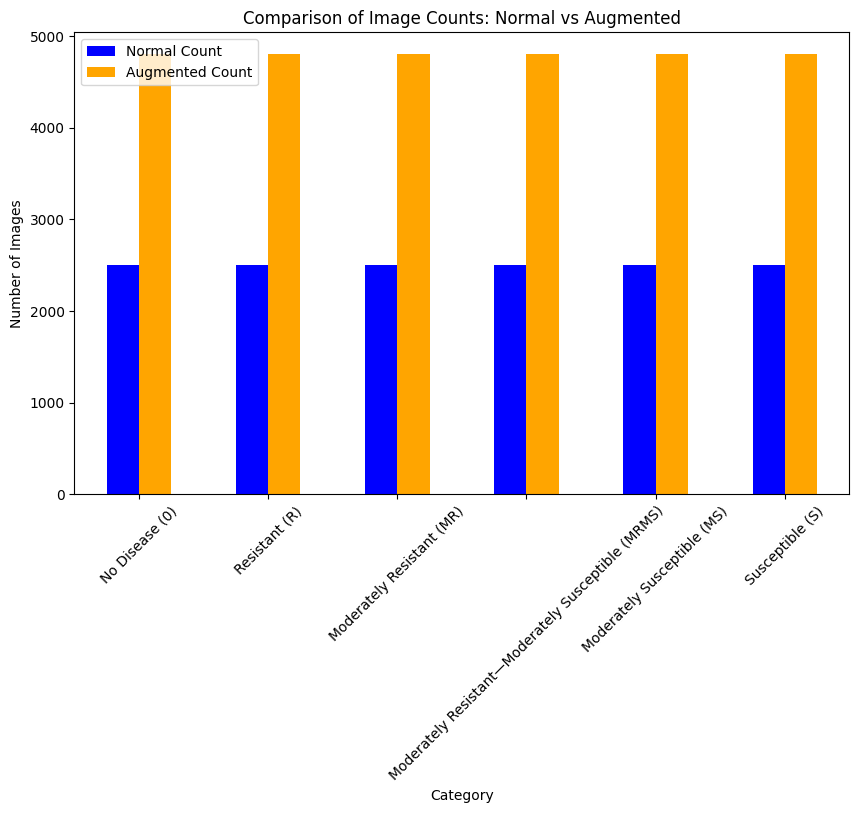

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# Define the base directories for normal and augmented images
base_path = '/content/drive/MyDrive/Images for Azure/Train/'
path_aug = '/content/drive/MyDrive/Images for Azure/Augmented'

# Define the categories and their corresponding directories
categories = {
    'No Disease (0)': '0',
    'Resistant (R)': 'R',
    'Moderately Resistant (MR)': 'MR',
    'Moderately Resistant—Moderately Susceptible (MRMS)': 'MRMS',
    'Moderately Susceptible (MS)': 'MS',
    'Susceptible (S)': 'S'
}

# Initialize dictionaries to hold the count of images for each category
normal_counts = {}
augmented_counts = {}

# Count the number of images in each category for the normal dataset
for category_name, directory_name in categories.items():
    category_path = os.path.join(base_path, directory_name)
    if os.path.exists(category_path):
        normal_counts[category_name] = len(os.listdir(category_path))
    else:
        normal_counts[category_name] = 0

# Count the number of images in each category for the augmented dataset
for category_name, directory_name in categories.items():
    category_path = os.path.join(path_aug, directory_name)
    if os.path.exists(category_path):
        augmented_counts[category_name] = len(os.listdir(category_path))
    else:
        augmented_counts[category_name] = 0

# Create a DataFrame to compare the counts
comparison_df = pd.DataFrame({
    'Category': categories.keys(),
    'Normal Count': normal_counts.values(),
    'Augmented Count': augmented_counts.values()
})

# Display the DataFrame
print(comparison_df)

# Plot the comparison
comparison_df.plot(kind='bar', x='Category', figsize=(10, 6), color=['blue', 'orange'])
plt.title('Comparison of Image Counts: Normal vs Augmented')
plt.ylabel('Number of Images')
plt.xlabel('Category')
plt.xticks(rotation=45)
plt.show()


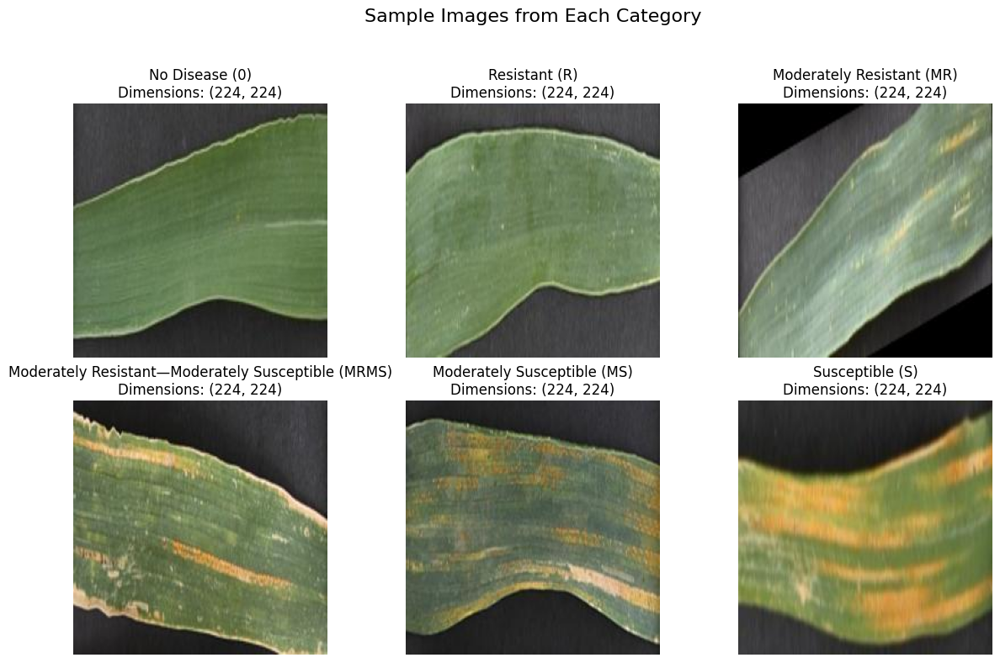

In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Define the base directory for augmented images
path_aug = '/content/drive/MyDrive/Images for Azure/Augmented'

# Define the categories and their corresponding directories
categories = {
    'No Disease (0)': '0',
    'Resistant (R)': 'R',
    'Moderately Resistant (MR)': 'MR',
    'Moderately Resistant—Moderately Susceptible (MRMS)': 'MRMS',
    'Moderately Susceptible (MS)': 'MS',
    'Susceptible (S)': 'S'
}

# Define the target size for resizing (e.g., 224x224)
target_size = (224, 224)

# Function to display a single image from each directory
def display_single_images(categories, base_path):
    fig, axes = plt.subplots(2, 3, figsize=(12, 8))  # 2 rows, 3 columns
    fig.suptitle("Sample Images from Each Category", fontsize=16)

    for i, (category_name, directory_name) in enumerate(categories.items()):
        category_path = os.path.join(base_path, directory_name)

        if os.path.exists(category_path):
            image_files = os.listdir(category_path)
            if image_files:
                image_name = image_files[0]  # Select the first image
                image_path = os.path.join(category_path, image_name)

                with Image.open(image_path) as img:
                    # Resize the image to the target size
                    img_resized = img.resize(target_size)

                    # Determine the position in the grid
                    ax = axes[i // 3, i % 3]
                    ax.imshow(img_resized)
                    ax.set_title(f"{category_name}\nDimensions: {img_resized.size}")
                    ax.axis('off')

    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for the title
    plt.show()

# Call the function to display the images
display_single_images(categories, path_aug)


Augmented Image - Channels: 3
Grayscale Image - Channels: 1
RGB Image - Channels: 3
Thermal Image - Channels: 3
Blended Image - Channels: 3


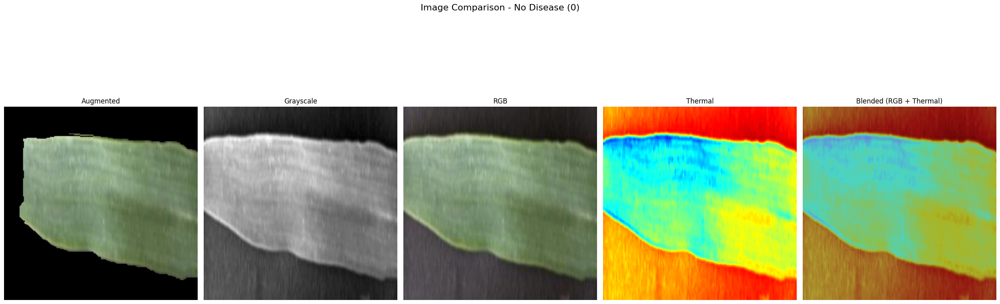

Augmented Image - Channels: 3
Grayscale Image - Channels: 1
RGB Image - Channels: 3
Thermal Image - Channels: 3
Blended Image - Channels: 3


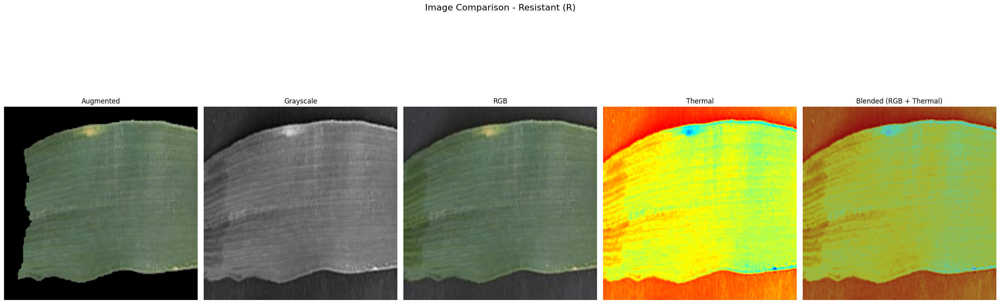

Augmented Image - Channels: 3
Grayscale Image - Channels: 1
RGB Image - Channels: 3
Thermal Image - Channels: 3
Blended Image - Channels: 3


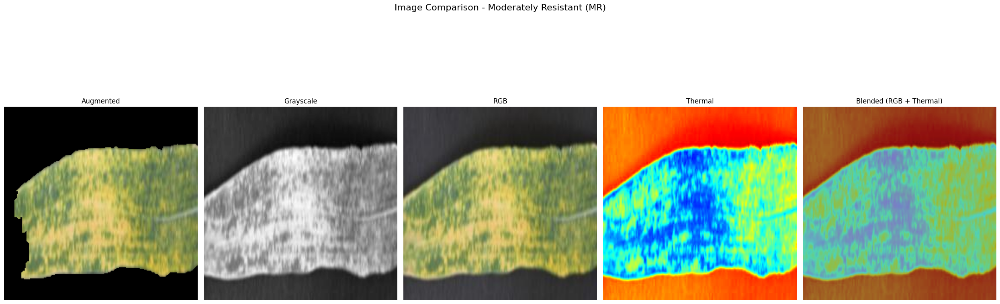

Augmented Image - Channels: 3
Grayscale Image - Channels: 1
RGB Image - Channels: 3
Thermal Image - Channels: 3
Blended Image - Channels: 3


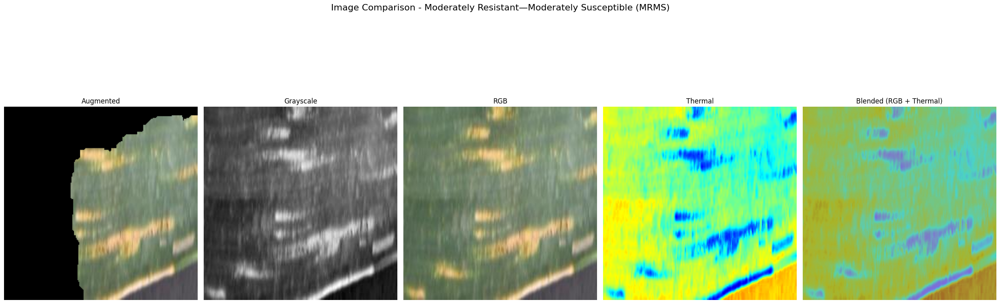

Augmented Image - Channels: 3
Grayscale Image - Channels: 1
RGB Image - Channels: 3
Thermal Image - Channels: 3
Blended Image - Channels: 3


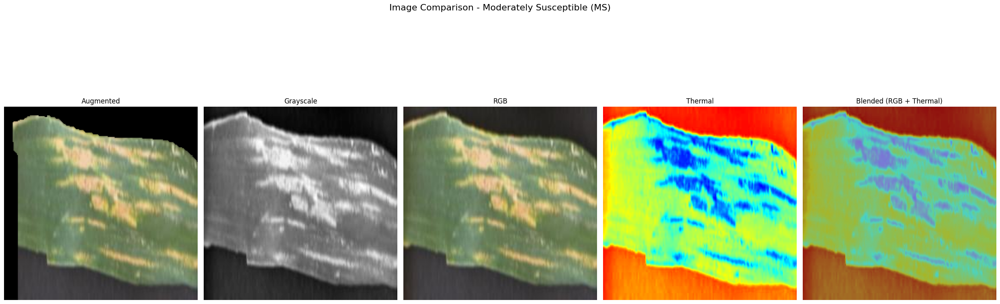

Augmented Image - Channels: 3
Grayscale Image - Channels: 1
RGB Image - Channels: 3
Thermal Image - Channels: 3
Blended Image - Channels: 3


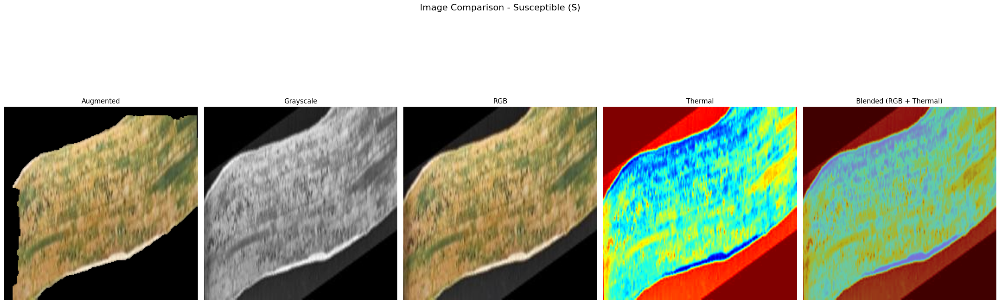

In [ ]:
import os
import random
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Define the base directory for augmented images
base_dir_aug = '/content/drive/MyDrive/Images for Azure/Augmented'

# Define the categories and their corresponding directories
categories = {
    'No Disease (0)': '0',
    'Resistant (R)': 'R',
    'Moderately Resistant (MR)': 'MR',
    'Moderately Resistant—Moderately Susceptible (MRMS)': 'MRMS',
    'Moderately Susceptible (MS)': 'MS',
    'Susceptible (S)': 'S'
}

# Function to convert an image to grayscale
def to_grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

# Function to apply thermal imaging effect
def to_thermal(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    thermal_image = cv2.applyColorMap(gray, cv2.COLORMAP_JET)
    return thermal_image

# Function to blend RGB and thermal images
def blend_rgb_and_thermal(rgb_image, thermal_image, alpha=0.5):
    blended_image = cv2.addWeighted(rgb_image, alpha, thermal_image, 1 - alpha, 0)
    return blended_image

# Function to remove the background using GrabCut
def remove_background(image_rgb):
    mask = np.zeros(image_rgb.shape[:2], np.uint8)

    bgdModel = np.zeros((1, 65), np.float64)
    fgdModel = np.zeros((1, 65), np.float64)

    rect = (10, 10, image_rgb.shape[1]-10, image_rgb.shape[0]-10)
    cv2.grabCut(image_rgb, mask, rect, bgdModel, fgdModel, 5, cv2.GC_INIT_WITH_RECT)

    # Modify the mask to be sure the background pixels are set to 0 and foreground to 1
    mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')

    # Apply mask to the image
    image_no_bg = image_rgb * mask2[:, :, np.newaxis]
    return image_no_bg

# Function to display images side by side
def display_image_comparison(augmented, grayscale, rgb, thermal, blended, category_name):
    fig, axes = plt.subplots(1, 5, figsize=(25, 10))
    fig.suptitle(f"Image Comparison - {category_name}", fontsize=16)

    # Display each image in a subplot
    axes[0].imshow(augmented)
    axes[0].set_title("Augmented")
    axes[0].axis('off')

    axes[1].imshow(grayscale, cmap='gray')
    axes[1].set_title("Grayscale")
    axes[1].axis('off')

    axes[2].imshow(rgb)
    axes[2].set_title("RGB")
    axes[2].axis('off')

    axes[3].imshow(thermal)
    axes[3].set_title("Thermal")
    axes[3].axis('off')

    axes[4].imshow(blended)
    axes[4].set_title("Blended (RGB + Thermal)")
    axes[4].axis('off')

    plt.tight_layout()
    plt.show()

# Function to print the number of channels
def print_image_channels(image, description):
    channels = image.shape[-1] if len(image.shape) == 3 else 1
    print(f"{description} Image - Channels: {channels}")

# Iterate through each category and process one random image
for category_name, directory_name in categories.items():
    category_path = os.path.join(base_dir_aug, directory_name)
    if os.path.exists(category_path):
        # Select a random image from the directory
        image_name = random.choice(os.listdir(category_path))
        image_path = os.path.join(category_path, image_name)

        # Load the image using OpenCV (as RGB)
        image_rgb = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image_rgb, cv2.COLOR_BGR2RGB)

        # Generate the different versions of the image
        image_augmented = image_rgb.copy()  # Assuming the augmented image is in RGB format
        image_grayscale = to_grayscale(image_rgb)
        image_thermal = to_thermal(image_rgb)
        image_blended = blend_rgb_and_thermal(image_rgb, image_thermal)

        # Apply background removal
        image_no_bg = remove_background(image_rgb)

        # Print the number of channels for each image
        print_image_channels(image_augmented, "Augmented")
        print_image_channels(image_grayscale, "Grayscale")
        print_image_channels(image_rgb, "RGB")
        print_image_channels(image_thermal, "Thermal")
        print_image_channels(image_blended, "Blended")

        # Display the images side by side
        display_image_comparison(image_no_bg, image_grayscale, image_rgb, image_thermal, image_blended, category_name)
    else:
        print(f"Directory {category_path} does not exist.")


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(


config.json:   0%|          | 0.00/69.7k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['vit.pooler.dense.bias', 'vit.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


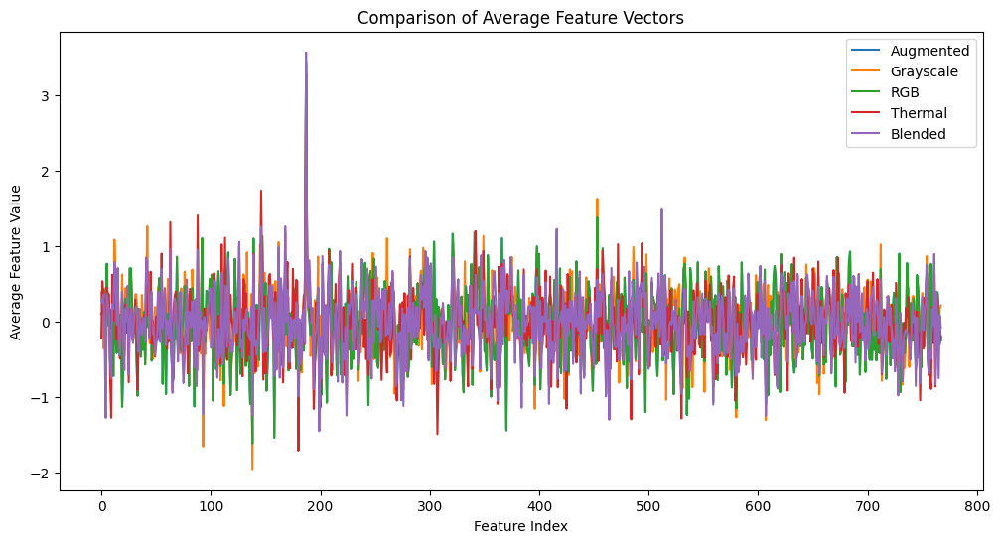

In [ ]:
import os
import random
import cv2
import numpy as np
import torch
from transformers import ViTFeatureExtractor, ViTModel
import matplotlib.pyplot as plt

# Define the base directory for augmented images
base_dir_aug = '/content/drive/MyDrive/Images for Azure/Augmented'

# Define the categories and their corresponding directories
categories = {
    'No Disease (0)': '0',
    'Resistant (R)': 'R',
    'Moderately Resistant (MR)': 'MR',
    'Moderately Resistant—Moderately Susceptible (MRMS)': 'MRMS',
    'Moderately Susceptible (MS)': 'MS',
    'Susceptible (S)': 'S'
}

# Function to convert an image to grayscale
def to_grayscale(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    gray_3ch = np.stack([gray] * 3, axis=-1)  # Convert to 3-channel grayscale
    return gray_3ch

# Function to apply thermal imaging effect
def to_thermal(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    thermal_image = cv2.applyColorMap(gray, cv2.COLORMAP_JET)
    return thermal_image

# Function to blend RGB and thermal images
def blend_rgb_and_thermal(rgb_image, thermal_image, alpha=0.5):
    blended_image = cv2.addWeighted(rgb_image, alpha, thermal_image, 1 - alpha, 0)
    return blended_image

# Load ViT model and feature extractor
feature_extractor = ViTFeatureExtractor.from_pretrained('google/vit-base-patch16-224')
model = ViTModel.from_pretrained('google/vit-base-patch16-224')

# Function to preprocess images for ViT
def preprocess_image(image):
    return feature_extractor(images=image, return_tensors="pt")

# Function to extract features using ViT
def extract_features(image):
    inputs = preprocess_image(image)
    with torch.no_grad():
        outputs = model(**inputs)
    return outputs.last_hidden_state.mean(dim=1).squeeze().numpy()

# Prepare a dictionary to store the features for comparison
features_dict = {
    "Augmented": [],
    "Grayscale": [],
    "RGB": [],
    "Thermal": [],
    "Blended": []
}

# Iterate through each category and process 10 random images
for category_name, directory_name in categories.items():
    category_path = os.path.join(base_dir_aug, directory_name)
    if os.path.exists(category_path):
        image_names = random.sample(os.listdir(category_path), 10)

        for image_name in image_names:
            image_path = os.path.join(category_path, image_name)
            image_rgb = cv2.imread(image_path)
            image_rgb = cv2.cvtColor(image_rgb, cv2.COLOR_BGR2RGB)

            # Generate different versions of the image
            image_augmented = image_rgb.copy()  # Assuming the augmented image is in RGB format
            image_grayscale = to_grayscale(image_rgb)
            image_thermal = to_thermal(image_rgb)
            image_blended = blend_rgb_and_thermal(image_rgb, image_thermal)

            # Extract features for each version
            features_dict["Augmented"].append(extract_features(image_augmented))
            features_dict["Grayscale"].append(extract_features(image_grayscale))
            features_dict["RGB"].append(extract_features(image_rgb))
            features_dict["Thermal"].append(extract_features(image_thermal))
            features_dict["Blended"].append(extract_features(image_blended))
    else:
        print(f"Directory {category_path} does not exist.")

# Convert features to numpy arrays for easier comparison
for key in features_dict:
    features_dict[key] = np.array(features_dict[key])

# Compare the feature vectors (example: compute average feature vectors)
avg_features = {key: np.mean(features_dict[key], axis=0) for key in features_dict}

# Display the average features using a simple plot (as a comparison)
plt.figure(figsize=(12, 6))
for key in avg_features:
    plt.plot(avg_features[key], label=key)
plt.title("Comparison of Average Feature Vectors")
plt.xlabel("Feature Index")
plt.ylabel("Average Feature Value")
plt.legend()
plt.show()


In [ ]:
import os
import pandas as pd
import random
from sklearn.model_selection import train_test_split

# Define the base directory where all the categories are stored
base_path = '/content/drive/MyDrive/Images for Azure/Train/'

# Define the categories and their corresponding directories
categories = {
    'No Disease (0)': '0',
    'Resistant (R)': 'R',
    'Moderately Resistant (MR)': 'MR',
    'Moderately Resistant—Moderately Susceptible (MRMS)': 'MRMS',
    'Moderately Susceptible (MS)': 'MS',
    'Susceptible (S)': 'S'
}

# Initialize lists to hold image paths and labels
image_paths = []
labels = []

# Collect random 25 images per category
for category_name, directory_name in categories.items():
    category_path = os.path.join(base_path, directory_name)
    if os.path.exists(category_path):
        image_files = os.listdir(category_path)
        if len(image_files) >= 25:
            selected_images = random.sample(image_files, 25)  # Select random 25 images
        else:
            selected_images = image_files  # If less than 25 images, take all images

        for image_name in selected_images:
            image_paths.append(os.path.join(category_path, image_name))
            labels.append(category_name)
    else:
        print(f"Directory {category_path} does not exist.")

# Create a DataFrame from the collected data
df = pd.DataFrame({
    'Image Path': image_paths,
    'Label': labels
})

# Split the data into training and testing sets
train_df, test_df = train_test_split(df, test_size=0.2, stratify=df['Label'], random_state=42)

# Save the split data (optional)
train_df.to_csv('/content/drive/MyDrive/Images for Azure/train_split.csv', index=False)
test_df.to_csv('/content/drive/MyDrive/Images for Azure/test_split.csv', index=False)


In [ ]:
import pandas as pd

# Randomly sample 25 images from each class for training
train_df_filtered = train_df.groupby('Label').apply(lambda x: x.sample(n=min(100, len(x)), random_state=1)).reset_index(drop=True)

# Randomly sample 25 images from each class for testing
test_df_filtered = test_df.groupby('Label').apply(lambda x: x.sample(n=min(20, len(x)), random_state=1)).reset_index(drop=True)

# Initialize the ImageDataGenerator for training and testing
datagen_train = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

datagen_test = ImageDataGenerator(rescale=1./255)

# Load training data with the filtered DataFrame
train_generator = datagen_train.flow_from_dataframe(
    dataframe=train_df_filtered,
    x_col='Image Path',
    y_col='Label',
    target_size=(224, 224),  # Adjust size if needed
    batch_size=32,
    class_mode='categorical'
)

# Load testing data with the filtered DataFrame
test_generator = datagen_test.flow_from_dataframe(
    dataframe=test_df_filtered,
    x_col='Image Path',
    y_col='Label',
    target_size=(224, 224),  # Adjust size if needed
    batch_size=32,
    class_mode='categorical'
)

# Output the number of images in each generator
print(f"Found {len(train_df_filtered)} validated image filenames belonging to {len(train_df_filtered['Label'].unique())} classes.")
print(f"Found {len(test_df_filtered)} validated image filenames belonging to {len(test_df_filtered['Label'].unique())} classes.")


Found 120 validated image filenames belonging to 6 classes.
Found 30 validated image filenames belonging to 6 classes.
Found 120 validated image filenames belonging to 6 classes.
Found 30 validated image filenames belonging to 6 classes.


<ipython-input-47-23abfbd6cb82>:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  train_df_filtered = train_df.groupby('Label').apply(lambda x: x.sample(n=min(100, len(x)), random_state=1)).reset_index(drop=True)
<ipython-input-47-23abfbd6cb82>:7: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  test_df_filtered = test_df.groupby('Label').apply(lambda x: x.sample(n=min(20, len(x)), random_state=1)).reset_index(

VGG 16 model prediction

In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam

# Define the categories (you should have this defined based on your dataset)
categories = ['category1', 'category2', 'category3', 'category4', 'category5', 'category6']

# Load the base model
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add custom layers on top
x = base_model.output
x = Flatten()(x)
x = Dense(256, activation='relu')(x)
predictions = Dense(len(categories), activation='softmax')(x)

# Define the model
model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the base model layers
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Display the model summary
model.summary()



Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 256)                 │       6,422,784 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 21,139,014 (80.64 MB)

 Trainable params: 6,424,326 (24.51 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam

# Load the base model
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add custom layers on top
x = base_model.output
x = Flatten()(x)
x = Dense(256, activation='relu')(x)
predictions = Dense(len(categories), activation='softmax')(x)

# Define the model
model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the base model layers
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(
    train_generator,
    validation_data=test_generator,
    epochs=100,  # Adjust as needed
    verbose=1
)


Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


4/4 ━━━━━━━━━━━━━━━━━━━━ 124s 27s/step - accuracy: 0.1794 - loss: 6.9633 - val_accuracy: 0.1667 - val_loss: 3.8178
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 106s 23s/step - accuracy: 0.1642 - loss: 2.8991 - val_accuracy: 0.1667 - val_loss: 2.4285
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 143s 22s/step - accuracy: 0.1583 - loss: 2.1917 - val_accuracy: 0.2667 - val_loss: 1.9865
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 144s 23s/step - accuracy: 0.3340 - loss: 1.7223 - val_accuracy: 0.2667 - val_loss: 1.8749
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 140s 22s/step - accuracy: 0.3351 - loss: 1.4617 - val_accuracy: 0.3333 - val_loss: 1.7194
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 142s 22s/step - accuracy: 0.4169 - loss: 1.3711 - val_accuracy: 0.3333 - val_loss: 1.6653
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 90s 23s/step - accuracy: 0.4624 - loss: 1.3289 - val_accuracy: 0.3667 - val_loss: 1.6231
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 87s 22s/step - accuracy: 0.5285 - loss: 1.1493 - val_accuracy: 0.3333 - val_loss: 1.638

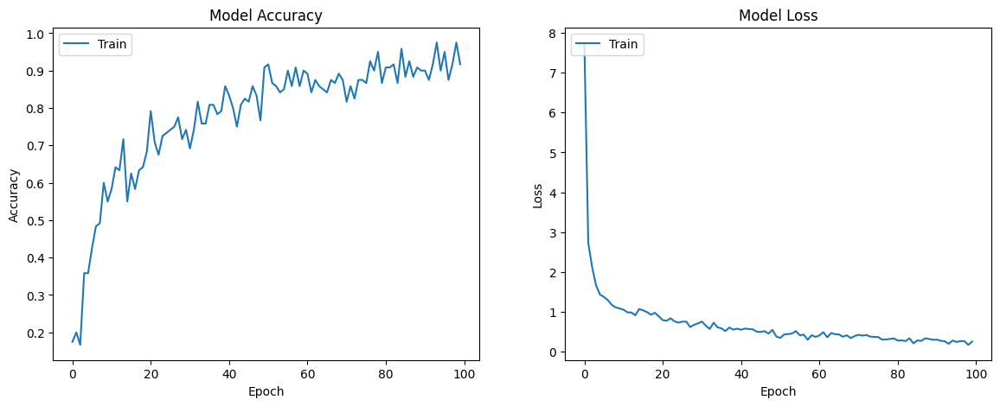

In [ ]:
# Plot training & validation accuracy values
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])

plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])

plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train'], loc='upper left')

plt.show()


Fine Tuning

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Data Augmentation
datagen = ImageDataGenerator(
    rescale=1.0/255.0,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Create generators
train_generator = datagen.flow_from_dataframe(
    train_df,
    x_col='Image Path',
    y_col='Label',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

test_generator = datagen.flow_from_dataframe(
    test_df,
    x_col='Image Path',
    y_col='Label',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

# Load the base VGG16 model
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add custom layers on top
x = base_model.output
x = Flatten()(x)
x = Dense(256, activation='relu')(x)
predictions = Dense(len(categories), activation='softmax')(x)

# Define the model
model = Model(inputs=base_model.input, outputs=predictions)

# Unfreeze more layers of the base model for fine-tuning
for layer in base_model.layers:
    layer.trainable = True  # Unfreeze all layers (experiment with this)

# Compile the model with a smaller learning rate for fine-tuning
model.compile(optimizer=Adam(learning_rate=1e-6), loss='categorical_crossentropy', metrics=['accuracy'])

# Add callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=1e-7)

# Fine-tune the model
history = model.fit(
    train_generator,
    validation_data=test_generator,
    epochs=100,  # Increase epochs as needed
    callbacks=[early_stopping, reduce_lr],
    verbose=1
)


Found 120 validated image filenames belonging to 6 classes.
Found 30 validated image filenames belonging to 6 classes.
Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


4/4 ━━━━━━━━━━━━━━━━━━━━ 307s 72s/step - accuracy: 0.1521 - loss: 2.0295 - val_accuracy: 0.3000 - val_loss: 1.9641 - learning_rate: 1.0000e-06
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 285s 71s/step - accuracy: 0.1223 - loss: 2.0644 - val_accuracy: 0.2667 - val_loss: 1.9615 - learning_rate: 1.0000e-06
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 284s 71s/step - accuracy: 0.1523 - loss: 1.8946 - val_accuracy: 0.1667 - val_loss: 1.9467 - learning_rate: 1.0000e-06
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 285s 77s/step - accuracy: 0.2621 - loss: 1.9006 - val_accuracy: 0.2000 - val_loss: 1.9052 - learning_rate: 1.0000e-06
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 285s 71s/step - accuracy: 0.2083 - loss: 1.8952 - val_accuracy: 0.1667 - val_loss: 1.8600 - learning_rate: 1.0000e-06
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 323s 71s/step - accuracy: 0.1365 - loss: 1.9401 - val_accuracy: 0.3667 - val_loss: 1.8345 - learning_rate: 1.0000e-06
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 285s 70s/step - accuracy: 0.2636 - loss: 1.82

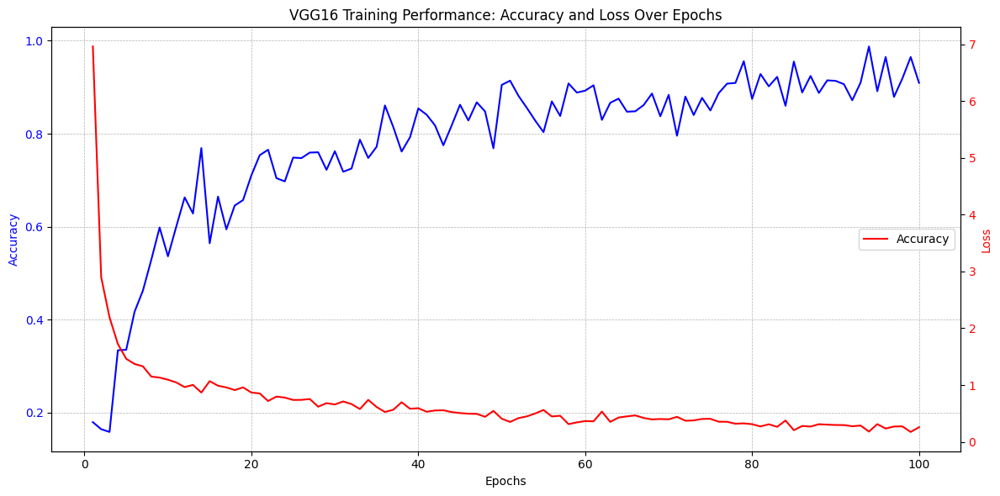

In [ ]:
vgg16_data1 ={1: {'accuracy': 0.1794, 'loss': 6.9633}, 2: {'accuracy': 0.1642, 'loss': 2.8991}, 3: {'accuracy': 0.1583, 'loss': 2.1917}, 4: {'accuracy': 0.334, 'loss': 1.7223}, 5: {'accuracy': 0.3351, 'loss': 1.4617}, 6: {'accuracy': 0.4169, 'loss': 1.3711}, 7: {'accuracy': 0.4624, 'loss': 1.3289}, 8: {'accuracy': 0.5285, 'loss': 1.1493}, 9: {'accuracy': 0.5982, 'loss': 1.1307}, 10: {'accuracy': 0.5362, 'loss': 1.0941}, 11: {'accuracy': 0.6003, 'loss': 1.045}, 12: {'accuracy': 0.6629, 'loss': 0.9636}, 13: {'accuracy': 0.6283, 'loss': 1.0022}, 14: {'accuracy': 0.769, 'loss': 0.8681}, 15: {'accuracy': 0.5643, 'loss': 1.0681}, 16: {'accuracy': 0.6646, 'loss': 0.9881}, 17: {'accuracy': 0.5942, 'loss': 0.9581}, 18: {'accuracy': 0.6454, 'loss': 0.9117}, 19: {'accuracy': 0.6572, 'loss': 0.9586}, 20: {'accuracy': 0.7107, 'loss': 0.8674}, 21: {'accuracy': 0.7538, 'loss': 0.8522}, 22: {'accuracy': 0.7655, 'loss': 0.7184}, 23: {'accuracy': 0.7044, 'loss': 0.797}, 24: {'accuracy': 0.6974, 'loss': 0.7791}, 25: {'accuracy': 0.7486, 'loss': 0.7374}, 26: {'accuracy': 0.7475, 'loss': 0.7392}, 27: {'accuracy': 0.7594, 'loss': 0.7533}, 28: {'accuracy': 0.76, 'loss': 0.6185}, 29: {'accuracy': 0.7222, 'loss': 0.6812}, 30: {'accuracy': 0.7623, 'loss': 0.6578}, 31: {'accuracy': 0.7181, 'loss': 0.7108}, 32: {'accuracy': 0.7251, 'loss': 0.6645}, 33: {'accuracy': 0.7871, 'loss': 0.5774}, 34: {'accuracy': 0.7477, 'loss': 0.7388}, 35: {'accuracy': 0.7718, 'loss': 0.6139}, 36: {'accuracy': 0.8608, 'loss': 0.5254}, 37: {'accuracy': 0.8144, 'loss': 0.5645}, 38: {'accuracy': 0.7616, 'loss': 0.697}, 39: {'accuracy': 0.7922, 'loss': 0.5825}, 40: {'accuracy': 0.8544, 'loss': 0.5918}, 41: {'accuracy': 0.8408, 'loss': 0.53}, 42: {'accuracy': 0.8179, 'loss': 0.552}, 43: {'accuracy': 0.775, 'loss': 0.5556}, 44: {'accuracy': 0.8179, 'loss': 0.5238}, 45: {'accuracy': 0.8623, 'loss': 0.5063}, 46: {'accuracy': 0.8284, 'loss': 0.4955}, 47: {'accuracy': 0.8675, 'loss': 0.4926}, 48: {'accuracy': 0.8479, 'loss': 0.4406}, 49: {'accuracy': 0.7686, 'loss': 0.5446}, 50: {'accuracy': 0.905, 'loss': 0.4066}, 51: {'accuracy': 0.9141, 'loss': 0.3501}, 52: {'accuracy': 0.8815, 'loss': 0.4176}, 53: {'accuracy': 0.8557, 'loss': 0.4474}, 54: {'accuracy': 0.8284, 'loss': 0.4982}, 55: {'accuracy': 0.8034, 'loss': 0.5611}, 56: {'accuracy': 0.8694, 'loss': 0.4466}, 57: {'accuracy': 0.8381, 'loss': 0.4592}, 58: {'accuracy': 0.9081, 'loss': 0.3115}, 59: {'accuracy': 0.8884, 'loss': 0.3423}, 60: {'accuracy': 0.8927, 'loss': 0.3651}, 61: {'accuracy': 0.9041, 'loss': 0.3616}, 62: {'accuracy': 0.8297, 'loss': 0.5324}, 63: {'accuracy': 0.8665, 'loss': 0.3512}, 64: {'accuracy': 0.8755, 'loss': 0.4281}, 65: {'accuracy': 0.8473, 'loss': 0.4482}, 66: {'accuracy': 0.8482, 'loss': 0.4651}, 67: {'accuracy': 0.8616, 'loss': 0.4201}, 68: {'accuracy': 0.8864, 'loss': 0.3946}, 69: {'accuracy': 0.8374, 'loss': 0.4016}, 70: {'accuracy': 0.8835, 'loss': 0.3966}, 71: {'accuracy': 0.7956, 'loss': 0.4398}, 72: {'accuracy': 0.8798, 'loss': 0.371}, 73: {'accuracy': 0.8402, 'loss': 0.3763}, 74: {'accuracy': 0.8771, 'loss': 0.4032}, 75: {'accuracy': 0.85, 'loss': 0.4051}, 76: {'accuracy': 0.8873, 'loss': 0.3538}, 77: {'accuracy': 0.9077, 'loss': 0.3531}, 78: {'accuracy': 0.9092, 'loss': 0.319}, 79: {'accuracy': 0.956, 'loss': 0.3249}, 80: {'accuracy': 0.8748, 'loss': 0.3105}, 81: {'accuracy': 0.9284, 'loss': 0.2707}, 82: {'accuracy': 0.9019, 'loss': 0.3087}, 83: {'accuracy': 0.9223, 'loss': 0.2639}, 84: {'accuracy': 0.86, 'loss': 0.3751}, 85: {'accuracy': 0.9552, 'loss': 0.2048}, 86: {'accuracy': 0.8887, 'loss': 0.2793}, 87: {'accuracy': 0.9242, 'loss': 0.2684}, 88: {'accuracy': 0.8877, 'loss': 0.31}, 89: {'accuracy': 0.9148, 'loss': 0.3023}, 90: {'accuracy': 0.9137, 'loss': 0.2962}, 91: {'accuracy': 0.9065, 'loss': 0.2948}, 92: {'accuracy': 0.8719, 'loss': 0.2739}, 93: {'accuracy': 0.9101, 'loss': 0.2868}, 94: {'accuracy': 0.9877, 'loss': 0.1798}, 95: {'accuracy': 0.8914, 'loss': 0.3117}, 96: {'accuracy': 0.9651, 'loss': 0.2337}, 97: {'accuracy': 0.8792, 'loss': 0.2699}, 98: {'accuracy': 0.9187, 'loss': 0.2719}, 99: {'accuracy': 0.965, 'loss': 0.174}, 100: {'accuracy': 0.9094, 'loss': 0.2573}}
import matplotlib.pyplot as plt

# Extract accuracy and loss values from the dictionary
epochs = list(vgg16_data1.keys())
accuracy = [vgg16_data1[epoch]['accuracy'] for epoch in epochs]
loss = [vgg16_data1[epoch]['loss'] for epoch in epochs]

# Create a plot for Accuracy and Loss
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot accuracy on primary y-axis
ax1.plot(epochs, accuracy, label="Accuracy", color="blue")
ax1.set_xlabel("Epochs")
ax1.set_ylabel("Accuracy", color="blue")
ax1.tick_params(axis="y", labelcolor="blue")
ax1.grid(True, which="both", linestyle="--", linewidth=0.5)

# Create a secondary y-axis for Loss
ax2 = ax1.twinx()
ax2.plot(epochs, loss, label="Loss", color="red")
ax2.set_ylabel("Loss", color="red")
ax2.tick_params(axis="y", labelcolor="red")

# Add title and legend
plt.title("VGG16 Training Performance: Accuracy and Loss Over Epochs")
fig.tight_layout()
plt.legend(["Accuracy", "Loss"], loc="center right")

plt.show()


Inception V3

In [ ]:
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam

# Load the base model (InceptionV3) with pre-trained ImageNet weights, without the top layers
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(299, 299, 3))

# Add custom layers on top of the base model
x = base_model.output
x = Flatten()(x)  # Flatten the output from the convolutional layers
x = Dense(256, activation='relu')(x)  # Add a fully connected layer with 256 neurons
predictions = Dense(6, activation='softmax')(x)  # Output layer with 6 classes (as per your categories)

# Define the final model
model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the layers of the base model so that they are not updated during training
for layer in base_model.layers:
    layer.trainable = False

# Compile the model with Adam optimizer and categorical crossentropy loss
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Summary of the model architecture
model.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 299, 299, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_94 (Conv2D)        │ (None, 149, 149, 32)   │            864 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_94    │ (None, 149, 149, 32)   │             96 │ conv2d_94[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_94             │ (None, 149, 149, 32)   │              0 │ batch_normalization_9… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_95 (Conv2D)        │ (None, 147, 147, 32)   │          9,216 │ activation_94[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_95    │ (None, 147, 147, 32)   │             96 │ conv2d_95[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_95             │ (None, 147, 147, 32)   │              0 │ batch_normalization_9… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_96 (Conv2D)        │ (None, 147, 147, 64)   │         18,432 │ activation_95[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_96    │ (None, 147, 147, 64)   │            192 │ conv2d_96[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_96             │ (None, 147, 147, 64)   │              0 │ batch_normalization_9… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_4           │ (None, 73, 73, 64)     │              0 │ activation_96[0][0]    │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_97 (Conv2D)        │ (None, 73, 73, 80)     │          5,120 │ max_pooling2d_4[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_97    │ (None, 73, 73, 80)     │            240 │ conv2d_97[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_97             │ (None, 73, 73, 80)     │              0 │ batch_normalization_9… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_98 (Conv2D)   

 Total params: 55,359,014 (211.18 MB)

 Trainable params: 33,556,230 (128.01 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

In [ ]:
import os
import pandas as pd
import random
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam

# Define the base directory where all the categories are stored
base_path = '/content/drive/MyDrive/Images for Azure/Train/'

# Define the categories and their corresponding directories
categories = {
    'No Disease (0)': '0',
    'Resistant (R)': 'R',
    'Moderately Resistant (MR)': 'MR',
    'Moderately Resistant—Moderately Susceptible (MRMS)': 'MRMS',
    'Moderately Susceptible (MS)': 'MS',
    'Susceptible (S)': 'S'
}

# Initialize lists to hold image paths and labels
image_paths = []
labels = []

# Collect random 25 images per category
for category_name, directory_name in categories.items():
    category_path = os.path.join(base_path, directory_name)
    if os.path.exists(category_path):
        image_files = os.listdir(category_path)
        if len(image_files) >= 25:
            selected_images = random.sample(image_files, 25)  # Select random 25 images
        else:
            selected_images = image_files  # If less than 25 images, take all images

        for image_name in selected_images:
            image_paths.append(os.path.join(category_path, image_name))
            labels.append(category_name)
    else:
        print(f"Directory {category_path} does not exist.")

# Create a DataFrame from the collected data
df = pd.DataFrame({
    'Image Path': image_paths,
    'Label': labels
})

# Split the data into training and testing sets
train_df, test_df = train_test_split(df, test_size=0.2, stratify=df['Label'], random_state=42)

# Save the split data (optional)
train_df.to_csv('/content/drive/MyDrive/Images for Azure/train_split.csv', index=False)
test_df.to_csv('/content/drive/MyDrive/Images for Azure/test_split.csv', index=False)

# Randomly sample images from each class for training
train_df_filtered = train_df.groupby('Label').apply(lambda x: x.sample(n=min(100, len(x)), random_state=1)).reset_index(drop=True)

# Randomly sample images from each class for testing
test_df_filtered = test_df.groupby('Label').apply(lambda x: x.sample(n=min(20, len(x)), random_state=1)).reset_index(drop=True)

# Initialize the ImageDataGenerator for training and testing
datagen_train = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

datagen_test = ImageDataGenerator(rescale=1./255)

# Load training data with the filtered DataFrame
train_generator = datagen_train.flow_from_dataframe(
    dataframe=train_df_filtered,
    x_col='Image Path',
    y_col='Label',
    target_size=(299, 299),  # InceptionV3 expects (299, 299)
    batch_size=32,
    class_mode='categorical'
)

# Load testing data with the filtered DataFrame
test_generator = datagen_test.flow_from_dataframe(
    dataframe=test_df_filtered,
    x_col='Image Path',
    y_col='Label',
    target_size=(299, 299),  # InceptionV3 expects (299, 299)
    batch_size=32,
    class_mode='categorical'
)

# Output the number of images in each generator
print(f"Found {len(train_df_filtered)} validated image filenames belonging to {len(train_df_filtered['Label'].unique())} classes.")
print(f"Found {len(test_df_filtered)} validated image filenames belonging to {len(test_df_filtered['Label'].unique())} classes.")

# Load the base model
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(299, 299, 3))

# Add custom layers on top
x = base_model.output
x = Flatten()(x)
x = Dense(256, activation='relu')(x)
predictions = Dense(len(categories), activation='softmax')(x)

# Define the model
model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the base model layers
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(
    train_generator,
    validation_data=test_generator,
    epochs=100,  # Adjust as needed
    verbose=1
)

# Evaluate the model
test_loss, test_accuracy = model.evaluate(test_generator)
print(f'Test Loss: {test_loss}, Test Accuracy: {test_accuracy}')

Found 120 validated image filenames belonging to 6 classes.
Found 30 validated image filenames belonging to 6 classes.


<ipython-input-13-34f970886fc9>:58: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  train_df_filtered = train_df.groupby('Label').apply(lambda x: x.sample(n=min(100, len(x)), random_state=1)).reset_index(drop=True)
<ipython-input-13-34f970886fc9>:61: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  test_df_filtered = test_df.groupby('Label').apply(lambda x: x.sample(n=min(20, len(x)), random_state=1)).reset_inde

Found 120 validated image filenames belonging to 6 classes.
Found 30 validated image filenames belonging to 6 classes.
Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


4/4 ━━━━━━━━━━━━━━━━━━━━ 98s 16s/step - accuracy: 0.1425 - loss: 59.3467 - val_accuracy: 0.1667 - val_loss: 72.4153
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 99s 10s/step - accuracy: 0.2554 - loss: 55.9801 - val_accuracy: 0.1667 - val_loss: 46.7034
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 83s 11s/step - accuracy: 0.2623 - loss: 36.0821 - val_accuracy: 0.1667 - val_loss: 28.3771
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 44s 11s/step - accuracy: 0.2791 - loss: 16.4957 - val_accuracy: 0.2333 - val_loss: 19.6666
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 40s 10s/step - accuracy: 0.3310 - loss: 14.9184 - val_accuracy: 0.2333 - val_loss: 15.9411
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 41s 10s/step - accuracy: 0.3590 - loss: 11.2829 - val_accuracy: 0.3333 - val_loss: 9.2481
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 55s 14s/step - accuracy: 0.4147 - loss: 5.9634 - val_accuracy: 0.3000 - val_loss: 6.3684
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 45s 12s/step - accuracy: 0.4620 - loss: 5.2257 - val_accuracy: 0.3333 - val_loss: 

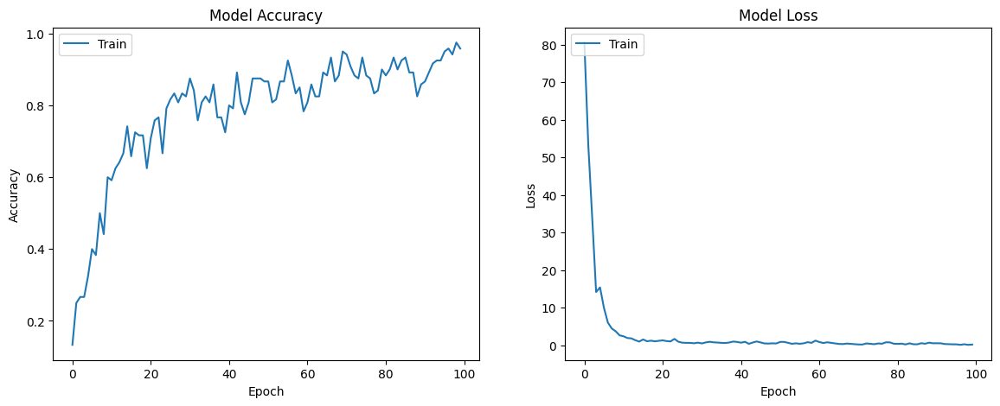

In [ ]:
# Plot training & validation accuracy values
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])

plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])

plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train'], loc='upper left')

plt.show()


Fine Tuning

Found 120 validated image filenames belonging to 6 classes.
Found 30 validated image filenames belonging to 6 classes.


<ipython-input-16-815f0d19045c>:48: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  train_df_filtered = train_df.groupby('Label').apply(lambda x: x.sample(n=min(100, len(x)), random_state=1)).reset_index(drop=True)
<ipython-input-16-815f0d19045c>:49: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  test_df_filtered = test_df.groupby('Label').apply(lambda x: x.sample(n=min(20, len(x)), random_state=1)).reset_inde

Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


4/4 ━━━━━━━━━━━━━━━━━━━━ 96s 17s/step - accuracy: 0.2254 - loss: 51.8278 - val_accuracy: 0.1667 - val_loss: 76.2385
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 49s 12s/step - accuracy: 0.2326 - loss: 54.9307 - val_accuracy: 0.2000 - val_loss: 40.3823
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 82s 12s/step - accuracy: 0.3582 - loss: 33.6479 - val_accuracy: 0.3667 - val_loss: 12.4064
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 50s 12s/step - accuracy: 0.4056 - loss: 10.4874 - val_accuracy: 0.2667 - val_loss: 9.1586
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 81s 12s/step - accuracy: 0.3269 - loss: 7.8765 - val_accuracy: 0.3667 - val_loss: 5.7912
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 89s 15s/step - accuracy: 0.3765 - loss: 5.5222 - val_accuracy: 0.3333 - val_loss: 6.0334
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 51s 12s/step - accuracy: 0.4744 - loss: 4.1083 - val_accuracy: 0.4333 - val_loss: 3.9167
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 49s 13s/step - accuracy: 0.4995 - loss: 3.2767 - val_accuracy: 0.4000 - val_loss: 2.76

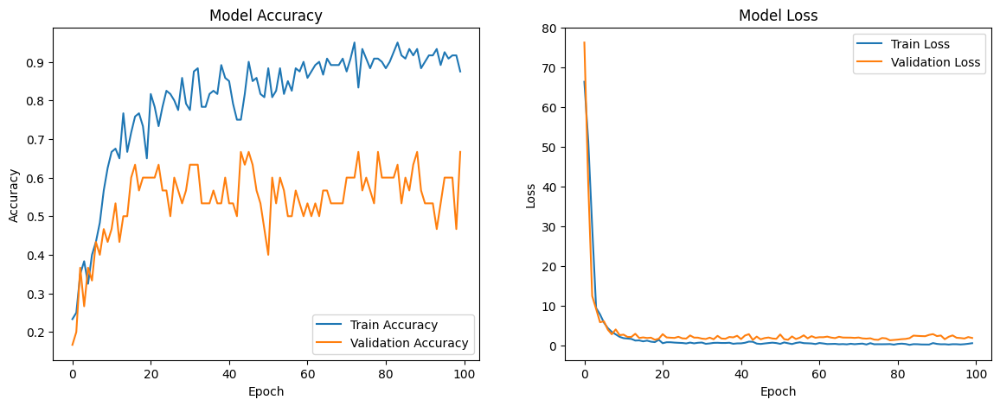

In [ ]:
import os
import random
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam

# Define the base directory where all the categories are stored
base_path = '/content/drive/MyDrive/Images for Azure/Train/'

# Define the categories and their corresponding directories
categories = {
    'No Disease (0)': '0',
    'Resistant (R)': 'R',
    'Moderately Resistant (MR)': 'MR',
    'Moderately Resistant—Moderately Susceptible (MRMS)': 'MRMS',
    'Moderately Susceptible (MS)': 'MS',
    'Susceptible (S)': 'S'
}

# Initialize lists to hold image paths and labels
image_paths = []
labels = []

# Collect random 25 images per category
for category_name, directory_name in categories.items():
    category_path = os.path.join(base_path, directory_name)
    if os.path.exists(category_path):
        image_files = os.listdir(category_path)
        selected_images = random.sample(image_files, min(25, len(image_files)))
        for image_name in selected_images:
            image_paths.append(os.path.join(category_path, image_name))
            labels.append(category_name)
    else:
        print(f"Directory {category_path} does not exist.")

# Create a DataFrame from the collected data
df = pd.DataFrame({'Image Path': image_paths, 'Label': labels})

# Split the data into training and testing sets
train_df, test_df = train_test_split(df, test_size=0.2, stratify=df['Label'], random_state=42)

# Filter the training and testing DataFrame (random sample of 100 for training, 20 for testing)
train_df_filtered = train_df.groupby('Label').apply(lambda x: x.sample(n=min(100, len(x)), random_state=1)).reset_index(drop=True)
test_df_filtered = test_df.groupby('Label').apply(lambda x: x.sample(n=min(20, len(x)), random_state=1)).reset_index(drop=True)

# Initialize the ImageDataGenerator for training and testing
datagen_train = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

datagen_test = ImageDataGenerator(rescale=1./255)

# Load training and testing data from DataFrame
train_generator = datagen_train.flow_from_dataframe(
    dataframe=train_df_filtered,
    x_col='Image Path',
    y_col='Label',
    target_size=(299, 299),
    batch_size=32,
    class_mode='categorical'
)

test_generator = datagen_test.flow_from_dataframe(
    dataframe=test_df_filtered,
    x_col='Image Path',
    y_col='Label',
    target_size=(299, 299),
    batch_size=32,
    class_mode='categorical'
)

# Load the base InceptionV3 model
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(299, 299, 3))

# Add custom layers on top
x = Flatten()(base_model.output)
x = Dense(256, activation='relu')(x)
predictions = Dense(len(categories), activation='softmax')(x)

# Define the model
model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the base model layers
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model for 100 epochs
history = model.fit(
    train_generator,
    validation_data=test_generator,
    epochs=100,
    verbose=1
)

# Evaluate the model
test_loss, test_accuracy = model.evaluate(test_generator)
print(f'Test Loss: {test_loss}, Test Accuracy: {test_accuracy}')

# Plot accuracy and loss
plt.figure(figsize=(14, 5))

# Plot accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()


Xception

In [ ]:
# Save the trained model to a file
model.save('/content/drive/MyDrive/Images for Azure/xception_model.h5')


In [ ]:
from tensorflow.keras.models import load_model

# Load the saved model from the file
loaded_model = load_model('/content/drive/MyDrive/Images for Azure/xception_model.h5')

# Print the model architecture to verify it was loaded correctly
loaded_model.summary()

# Optionally, evaluate the loaded model on the test set
test_loss, test_accuracy = loaded_model.evaluate(test_generator)
print(f'Loaded Model Test Loss: {test_loss}, Test Accuracy: {test_accuracy}')


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 299, 299, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_188 (Conv2D)       │ (None, 149, 149, 32)   │            864 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_188   │ (None, 149, 149, 32)   │             96 │ conv2d_188[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_188            │ (None, 149, 149, 32)   │              0 │ batch_normalization_1… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_189 (Conv2D)       │ (None, 147, 147, 32)   │          9,216 │ activation_188[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_189   │ (None, 147, 147, 32)   │             96 │ conv2d_189[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_189            │ (None, 147, 147, 32)   │              0 │ batch_normalization_1… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_190 (Conv2D)       │ (None, 147, 147, 64)   │         18,432 │ activation_189[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_190   │ (None, 147, 147, 64)   │            192 │ conv2d_190[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_190            │ (None, 147, 147, 64)   │              0 │ batch_normalization_1… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_8           │ (None, 73, 73, 64)     │              0 │ activation_190[0][0]   │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_191 (Conv2D)       │ (None, 73, 73, 80)     │          5,120 │ max_pooling2d_8[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_191   │ (None, 73, 73, 80)     │            240 │ conv2d_191[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_191            │ (None, 73, 73, 80)     │              0 │ batch_normalization_1… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_192 (Conv2D)  

 Total params: 55,359,016 (211.18 MB)

 Trainable params: 33,556,230 (128.01 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

 Optimizer params: 2 (12.00 B)

1/1 ━━━━━━━━━━━━━━━━━━━━ 20s 20s/step - accuracy: 0.6667 - loss: 1.8383
Loaded Model Test Loss: 1.8382607698440552, Test Accuracy: 0.6666666865348816


In [ ]:
import os
import pandas as pd
import random
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import Xception
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam

# Define the base directory where all the categories are stored
base_path = '/content/drive/MyDrive/Images for Azure/Train/'

# Define the categories and their corresponding directories
categories = {
    'No Disease (0)': '0',
    'Resistant (R)': 'R',
    'Moderately Resistant (MR)': 'MR',
    'Moderately Resistant—Moderately Susceptible (MRMS)': 'MRMS',
    'Moderately Susceptible (MS)': 'MS',
    'Susceptible (S)': 'S'
}

# Initialize lists to hold image paths and labels
image_paths = []
labels = []

# Collect random 25 images per category
for category_name, directory_name in categories.items():
    category_path = os.path.join(base_path, directory_name)
    if os.path.exists(category_path):
        image_files = os.listdir(category_path)
        if len(image_files) >= 25:
            selected_images = random.sample(image_files, 25)  # Select random 25 images
        else:
            selected_images = image_files  # If less than 25 images, take all images

        for image_name in selected_images:
            image_paths.append(os.path.join(category_path, image_name))
            labels.append(category_name)
    else:
        print(f"Directory {category_path} does not exist.")

# Create a DataFrame from the collected data
df = pd.DataFrame({
    'Image Path': image_paths,
    'Label': labels
})

# Split the data into training and testing sets
train_df, test_df = train_test_split(df, test_size=0.2, stratify=df['Label'], random_state=42)

# Save the split data (optional)
train_df.to_csv('/content/drive/MyDrive/Images for Azure/train_split.csv', index=False)
test_df.to_csv('/content/drive/MyDrive/Images for Azure/test_split.csv', index=False)

# Randomly sample images from each class for training
train_df_filtered = train_df.groupby('Label').apply(lambda x: x.sample(n=min(100, len(x)), random_state=1)).reset_index(drop=True)

# Randomly sample images from each class for testing
test_df_filtered = test_df.groupby('Label').apply(lambda x: x.sample(n=min(20, len(x)), random_state=1)).reset_index(drop=True)

# Initialize the ImageDataGenerator for training and testing
datagen_train = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

datagen_test = ImageDataGenerator(rescale=1./255)

# Load training data with the filtered DataFrame
train_generator = datagen_train.flow_from_dataframe(
    dataframe=train_df_filtered,
    x_col='Image Path',
    y_col='Label',
    target_size=(299, 299),  # Xception expects (299, 299)
    batch_size=32,
    class_mode='categorical'
)

# Load testing data with the filtered DataFrame
test_generator = datagen_test.flow_from_dataframe(
    dataframe=test_df_filtered,
    x_col='Image Path',
    y_col='Label',
    target_size=(299, 299),  # Xception expects (299, 299)
    batch_size=32,
    class_mode='categorical'
)

# Output the number of images in each generator
print(f"Found {len(train_df_filtered)} validated image filenames belonging to {len(train_df_filtered['Label'].unique())} classes.")
print(f"Found {len(test_df_filtered)} validated image filenames belonging to {len(test_df_filtered['Label'].unique())} classes.")

# Load the base model
base_model = Xception(weights='imagenet', include_top=False, input_shape=(299, 299, 3))

# Add custom layers on top
x = base_model.output
x = Flatten()(x)
x = Dense(256, activation='relu')(x)
predictions = Dense(len(categories), activation='softmax')(x)

# Define the model
model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the base model layers
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(
    train_generator,
    validation_data=test_generator,
    epochs=100,  # Adjust as needed
    verbose=1
)

# Evaluate the model
test_loss, test_accuracy = model.evaluate(test_generator)
print(f'Test Loss: {test_loss}, Test Accuracy: {test_accuracy}')


Found 120 validated image filenames belonging to 6 classes.
Found 30 validated image filenames belonging to 6 classes.


<ipython-input-17-440cc6ee6340>:58: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  train_df_filtered = train_df.groupby('Label').apply(lambda x: x.sample(n=min(100, len(x)), random_state=1)).reset_index(drop=True)
<ipython-input-17-440cc6ee6340>:61: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  test_df_filtered = test_df.groupby('Label').apply(lambda x: x.sample(n=min(20, len(x)), random_state=1)).reset_inde

Found 120 validated image filenames belonging to 6 classes.
Found 30 validated image filenames belonging to 6 classes.
Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


4/4 ━━━━━━━━━━━━━━━━━━━━ 112s 21s/step - accuracy: 0.1043 - loss: 29.5690 - val_accuracy: 0.1667 - val_loss: 36.8631
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 79s 20s/step - accuracy: 0.1435 - loss: 31.3197 - val_accuracy: 0.2333 - val_loss: 20.6393
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 76s 20s/step - accuracy: 0.3054 - loss: 14.9576 - val_accuracy: 0.4000 - val_loss: 6.6715
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 71s 18s/step - accuracy: 0.4077 - loss: 7.6184 - val_accuracy: 0.3333 - val_loss: 7.5304
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 69s 17s/step - accuracy: 0.4408 - loss: 5.6597 - val_accuracy: 0.3667 - val_loss: 6.5185
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 85s 19s/step - accuracy: 0.5234 - loss: 4.5739 - val_accuracy: 0.3333 - val_loss: 4.6428
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 85s 22s/step - accuracy: 0.6360 - loss: 2.5968 - val_accuracy: 0.3333 - val_loss: 5.0345
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 127s 17s/step - accuracy: 0.4873 - loss: 3.8329 - val_accuracy: 0.2667 - val_loss: 4.31

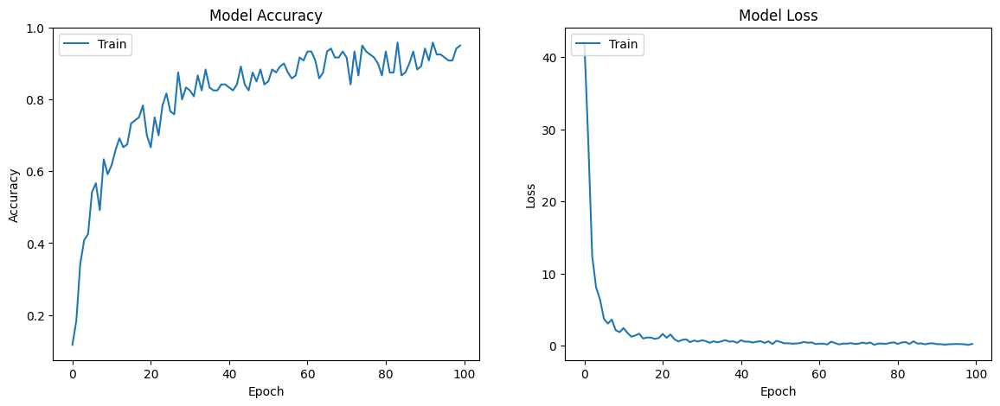

In [ ]:
# Plot training & validation accuracy values
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])

plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])

plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train'], loc='upper left')

plt.show()


Fine Tuning

Found 120 validated image filenames belonging to 6 classes.
Found 30 validated image filenames belonging to 6 classes.


<ipython-input-23-93d30344aef7>:39: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  train_df_filtered = train_df.groupby('Label').apply(lambda x: x.sample(n=min(100, len(x)), random_state=1)).reset_index(drop=True)
<ipython-input-23-93d30344aef7>:40: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  test_df_filtered = test_df.groupby('Label').apply(lambda x: x.sample(n=min(20, len(x)), random_state=1)).reset_inde

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


4/4 ━━━━━━━━━━━━━━━━━━━━ 117s 23s/step - accuracy: 0.2088 - loss: 17.7174 - val_accuracy: 0.3667 - val_loss: 40.1296
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 118s 23s/step - accuracy: 0.3053 - loss: 42.1113 - val_accuracy: 0.4333 - val_loss: 28.1839
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 79s 21s/step - accuracy: 0.3832 - loss: 19.6410 - val_accuracy: 0.4000 - val_loss: 7.8369
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 81s 20s/step - accuracy: 0.4214 - loss: 5.8918 - val_accuracy: 0.3000 - val_loss: 5.4637
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 93s 24s/step - accuracy: 0.3262 - loss: 5.5432 - val_accuracy: 0.5333 - val_loss: 2.2876
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 81s 20s/step - accuracy: 0.4631 - loss: 2.5981 - val_accuracy: 0.4333 - val_loss: 3.5333
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 80s 20s/step - accuracy: 0.5983 - loss: 1.9486 - val_accuracy: 0.3667 - val_loss: 3.7334
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 82s 20s/step - accuracy: 0.5773 - loss: 2.3192 - val_accuracy: 0.4667 - val_loss: 2.86

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3             │ (None, 299, 299, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1 (Conv2D)     │ (None, 149, 149, 32)   │            864 │ input_layer_3[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1_bn           │ (None, 149, 149, 32)   │            128 │ block1_conv1[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1_act          │ (None, 149, 149, 32)   │              0 │ block1_conv1_bn[0][0]  │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2 (Conv2D)     │ (None, 147, 147, 64)   │         18,432 │ block1_conv1_act[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2_bn           │ (None, 147, 147, 64)   │            256 │ block1_conv2[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2_act          │ (None, 147, 147, 64)   │              0 │ block1_conv2_bn[0][0]  │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv1           │ (None, 147, 147, 128)  │          8,768 │ block1_conv2_act[0][0] │
│ (SeparableConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv1_bn        │ (None, 147, 147, 128)  │            512 │ block2_sepconv1[0][0]  │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2_act       │ (None, 147, 147, 128)  │              0 │ block2_sepconv1_bn[0]… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2           │ (None, 147, 147, 128)  │         17,536 │ block2_sepconv2_act[0… │
│ (SeparableConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2_bn        │ (None, 147, 147, 128)  │            512 │ block2_sepconv2[0][0]  │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_282 (Conv2D)       │ (None, 74, 74, 128)    │          8,192 │ block1_conv2_act[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_pool               │ (None, 74, 74, 128)    │              0 │ block2_sepconv2_bn[0]… │
│ (MaxPooling2D)            │                        │                │                        │
├──────────────────────

 Total params: 73,292,080 (279.59 MB)

 Trainable params: 52,430,598 (200.01 MB)

 Non-trainable params: 20,861,480 (79.58 MB)

 Optimizer params: 2 (12.00 B)

1/1 ━━━━━━━━━━━━━━━━━━━━ 17s 17s/step - accuracy: 0.5000 - loss: 2.7798
Loaded Model Test Loss: 2.779772996902466, Test Accuracy: 0.5


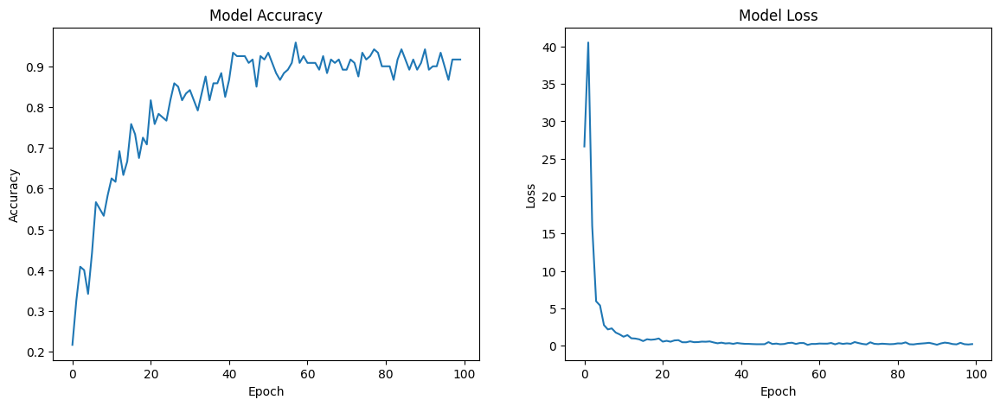

In [ ]:
import os
import random
import pandas as pd
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import Xception
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam

# Define base directory and categories
base_path = '/content/drive/MyDrive/Images for Azure/Train/'
categories = {
    'No Disease (0)': '0',
    'Resistant (R)': 'R',
    'Moderately Resistant (MR)': 'MR',
    'Moderately Resistant—Moderately Susceptible (MRMS)': 'MRMS',
    'Moderately Susceptible (MS)': 'MS',
    'Susceptible (S)': 'S'
}

# Collect random 25 images per category
image_paths, labels = [], []
for category_name, directory_name in categories.items():
    category_path = os.path.join(base_path, directory_name)
    if os.path.exists(category_path):
        image_files = os.listdir(category_path)
        selected_images = random.sample(image_files, 25) if len(image_files) >= 25 else image_files
        for image_name in selected_images:
            image_paths.append(os.path.join(category_path, image_name))
            labels.append(category_name)

# Create DataFrame and split into train/test
df = pd.DataFrame({'Image Path': image_paths, 'Label': labels})
train_df, test_df = train_test_split(df, test_size=0.2, stratify=df['Label'], random_state=42)

# Randomly sample 100 images for training, 20 for testing from each class
train_df_filtered = train_df.groupby('Label').apply(lambda x: x.sample(n=min(100, len(x)), random_state=1)).reset_index(drop=True)
test_df_filtered = test_df.groupby('Label').apply(lambda x: x.sample(n=min(20, len(x)), random_state=1)).reset_index(drop=True)

# Data generators
datagen_train = ImageDataGenerator(
    rescale=1./255, rotation_range=20, width_shift_range=0.2, height_shift_range=0.2, shear_range=0.2,
    zoom_range=0.2, horizontal_flip=True, fill_mode='nearest'
)
datagen_test = ImageDataGenerator(rescale=1./255)

train_generator = datagen_train.flow_from_dataframe(
    dataframe=train_df_filtered, x_col='Image Path', y_col='Label', target_size=(299, 299),
    batch_size=32, class_mode='categorical'
)
test_generator = datagen_test.flow_from_dataframe(
    dataframe=test_df_filtered, x_col='Image Path', y_col='Label', target_size=(299, 299),
    batch_size=32, class_mode='categorical'
)

# Load the Xception base model
base_model = Xception(weights='imagenet', include_top=False, input_shape=(299, 299, 3))

# Add custom layers on top
x = base_model.output
x = Flatten()(x)
x = Dense(256, activation='relu')(x)
predictions = Dense(len(categories), activation='softmax')(x)
model = Model(inputs=base_model.input, outputs=predictions)

# Freeze base model layers
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(train_generator, validation_data=test_generator, epochs=100, verbose=1)

# Save the trained model
model.save('/content/drive/MyDrive/Images for Azure/xception_model.h5')

# Load the model to verify
loaded_model = load_model('/content/drive/MyDrive/Images for Azure/xception_model.h5')
loaded_model.summary()

# Evaluate the model on the test set
test_loss, test_accuracy = loaded_model.evaluate(test_generator)
print(f'Loaded Model Test Loss: {test_loss}, Test Accuracy: {test_accuracy}')

# Plot training & validation accuracy and loss
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')

plt.show()


model comparision

without fine-tuned

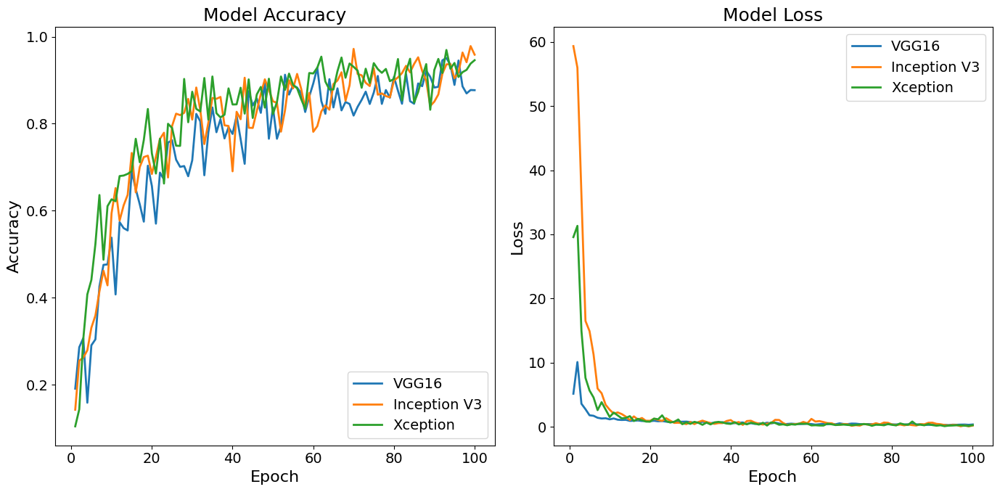

Model Comparison without fine-tunning


In [ ]:
import matplotlib.pyplot as plt

# Example usage:
# Assuming you have dictionaries for VGG16, InceptionV3, and Xception
vgg16_data = {1: {'accuracy': 0.191, 'loss': 5.1533}, 2: {'accuracy': 0.2862, 'loss': 10.0917}, 3: {'accuracy': 0.3071, 'loss': 3.5869}, 4: {'accuracy': 0.1586, 'loss': 2.7377}, 5: {'accuracy': 0.2906, 'loss': 1.7921}, 6: {'accuracy': 0.3042, 'loss': 1.7117}, 7: {'accuracy': 0.4261, 'loss': 1.4057}, 8: {'accuracy': 0.4755, 'loss': 1.2893}, 9: {'accuracy': 0.4765, 'loss': 1.3252}, 10: {'accuracy': 0.5381, 'loss': 1.1597}, 11: {'accuracy': 0.4075, 'loss': 1.294}, 12: {'accuracy': 0.5736, 'loss': 1.1001}, 13: {'accuracy': 0.5599, 'loss': 1.0585}, 14: {'accuracy': 0.5546, 'loss': 1.0834}, 15: {'accuracy': 0.6907, 'loss': 0.9164}, 16: {'accuracy': 0.6496, 'loss': 0.9429}, 17: {'accuracy': 0.6145, 'loss': 0.9823}, 18: {'accuracy': 0.5748, 'loss': 0.8986}, 19: {'accuracy': 0.7034, 'loss': 0.9018}, 20: {'accuracy': 0.6567, 'loss': 0.8722}, 21: {'accuracy': 0.5702, 'loss': 0.9359}, 22: {'accuracy': 0.6875, 'loss': 0.8546}, 23: {'accuracy': 0.6716, 'loss': 0.894}, 24: {'accuracy': 0.7565, 'loss': 0.7981}, 25: {'accuracy': 0.7621, 'loss': 0.705}, 26: {'accuracy': 0.7173, 'loss': 0.7744}, 27: {'accuracy': 0.7007, 'loss': 0.7691}, 28: {'accuracy': 0.7026, 'loss': 0.7857}, 29: {'accuracy': 0.6792, 'loss': 0.8036}, 30: {'accuracy': 0.7158, 'loss': 0.7309}, 31: {'accuracy': 0.8224, 'loss': 0.6235}, 32: {'accuracy': 0.8054, 'loss': 0.6433}, 33: {'accuracy': 0.6814, 'loss': 0.7869}, 34: {'accuracy': 0.7802, 'loss': 0.6874}, 35: {'accuracy': 0.8373, 'loss': 0.5526}, 36: {'accuracy': 0.7804, 'loss': 0.65}, 37: {'accuracy': 0.8102, 'loss': 0.6132}, 38: {'accuracy': 0.7661, 'loss': 0.702}, 39: {'accuracy': 0.7916, 'loss': 0.6068}, 40: {'accuracy': 0.7764, 'loss': 0.5222}, 41: {'accuracy': 0.8183, 'loss': 0.5724}, 42: {'accuracy': 0.7643, 'loss': 0.6322}, 43: {'accuracy': 0.7077, 'loss': 0.6683}, 44: {'accuracy': 0.8748, 'loss': 0.4524}, 45: {'accuracy': 0.8419, 'loss': 0.5593}, 46: {'accuracy': 0.8579, 'loss': 0.4467}, 47: {'accuracy': 0.8249, 'loss': 0.5316}, 48: {'accuracy': 0.8952, 'loss': 0.4664}, 49: {'accuracy': 0.7654, 'loss': 0.636}, 50: {'accuracy': 0.8374, 'loss': 0.5164}, 51: {'accuracy': 0.7654, 'loss': 0.6458}, 52: {'accuracy': 0.7944, 'loss': 0.5053}, 53: {'accuracy': 0.9125, 'loss': 0.3926}, 54: {'accuracy': 0.8669, 'loss': 0.4353}, 55: {'accuracy': 0.8884, 'loss': 0.4867}, 56: {'accuracy': 0.883, 'loss': 0.4409}, 57: {'accuracy': 0.8698, 'loss': 0.4116}, 58: {'accuracy': 0.8269, 'loss': 0.4536}, 59: {'accuracy': 0.8621, 'loss': 0.4677}, 60: {'accuracy': 0.8923, 'loss': 0.4237}, 61: {'accuracy': 0.9287, 'loss': 0.3352}, 62: {'accuracy': 0.8519, 'loss': 0.4022}, 63: {'accuracy': 0.8227, 'loss': 0.4605}, 64: {'accuracy': 0.9023, 'loss': 0.3865}, 65: {'accuracy': 0.8373, 'loss': 0.4561}, 66: {'accuracy': 0.8812, 'loss': 0.3884}, 67: {'accuracy': 0.8306, 'loss': 0.5339}, 68: {'accuracy': 0.8498, 'loss': 0.4306}, 69: {'accuracy': 0.8453, 'loss': 0.4195}, 70: {'accuracy': 0.8186, 'loss': 0.4988}, 71: {'accuracy': 0.8388, 'loss': 0.4852}, 72: {'accuracy': 0.8548, 'loss': 0.4141}, 73: {'accuracy': 0.8736, 'loss': 0.3852}, 74: {'accuracy': 0.8453, 'loss': 0.4186}, 75: {'accuracy': 0.8715, 'loss': 0.4086}, 76: {'accuracy': 0.9097, 'loss': 0.3745}, 77: {'accuracy': 0.8455, 'loss': 0.3485}, 78: {'accuracy': 0.8773, 'loss': 0.4019}, 79: {'accuracy': 0.8598, 'loss': 0.3909}, 80: {'accuracy': 0.9075, 'loss': 0.3681}, 81: {'accuracy': 0.8757, 'loss': 0.3615}, 82: {'accuracy': 0.8458, 'loss': 0.3874}, 83: {'accuracy': 0.9139, 'loss': 0.3371}, 84: {'accuracy': 0.8517, 'loss': 0.39}, 85: {'accuracy': 0.8458, 'loss': 0.4328}, 86: {'accuracy': 0.8925, 'loss': 0.36}, 87: {'accuracy': 0.8862, 'loss': 0.3817}, 88: {'accuracy': 0.9216, 'loss': 0.2912}, 89: {'accuracy': 0.9077, 'loss': 0.2987}, 90: {'accuracy': 0.883, 'loss': 0.2947}, 91: {'accuracy': 0.8848, 'loss': 0.3292}, 92: {'accuracy': 0.9455, 'loss': 0.2968}, 93: {'accuracy': 0.951, 'loss': 0.302}, 94: {'accuracy': 0.9353, 'loss': 0.2552}, 95: {'accuracy': 0.8891, 'loss': 0.3266}, 96: {'accuracy': 0.9452, 'loss': 0.3119}, 97: {'accuracy': 0.8858, 'loss': 0.3338}, 98: {'accuracy': 0.8696, 'loss': 0.3431}, 99: {'accuracy': 0.8774, 'loss': 0.3028}, 100: {'accuracy': 0.877, 'loss': 0.3568}}

inception_v3_data = {1: {'accuracy': 0.1425, 'loss': 59.3467},2: {'accuracy': 0.2554, 'loss': 55.9801}, 3: {'accuracy': 0.2623, 'loss': 36.0821}, 4: {'accuracy': 0.2791, 'loss': 16.4957}, 5: {'accuracy': 0.331, 'loss': 14.9184}, 6: {'accuracy': 0.359, 'loss': 11.2829}, 7: {'accuracy': 0.4147, 'loss': 5.9634}, 8: {'accuracy': 0.462, 'loss': 5.2257}, 9: {'accuracy': 0.4284, 'loss': 3.4243}, 10: {'accuracy': 0.5939, 'loss': 2.6534}, 11: {'accuracy': 0.6519, 'loss': 2.0522}, 12: {'accuracy': 0.5772, 'loss': 2.2346}, 13: {'accuracy': 0.6122, 'loss': 1.977}, 14: {'accuracy': 0.6365, 'loss': 1.5806}, 15: {'accuracy': 0.7327, 'loss': 1.044}, 16: {'accuracy': 0.6421, 'loss': 1.6175}, 17: {'accuracy': 0.7005, 'loss': 1.1212}, 18: {'accuracy': 0.7233, 'loss': 1.3679}, 19: {'accuracy': 0.7264, 'loss': 0.9198}, 20: {'accuracy': 0.6844, 'loss': 0.9313}, 21: {'accuracy': 0.724, 'loss': 1.2475}, 22: {'accuracy': 0.765, 'loss': 1.0535}, 23: {'accuracy': 0.7792, 'loss': 0.9143}, 24: {'accuracy': 0.6763, 'loss': 1.3323}, 25: {'accuracy': 0.7945, 'loss': 0.9533}, 26: {'accuracy': 0.823, 'loss': 0.6038}, 27: {'accuracy': 0.8197, 'loss': 0.6304}, 28: {'accuracy': 0.825, 'loss': 0.5585}, 29: {'accuracy': 0.8569, 'loss': 0.4117}, 30: {'accuracy': 0.8094, 'loss': 0.7444}, 31: {'accuracy': 0.8831, 'loss': 0.4159}, 32: {'accuracy': 0.8313, 'loss': 0.7428}, 33: {'accuracy': 0.7532, 'loss': 0.9555}, 34: {'accuracy': 0.8024, 'loss': 0.751}, 35: {'accuracy': 0.8592, 'loss': 0.5614}, 36: {'accuracy': 0.8571, 'loss': 0.4559}, 37: {'accuracy': 0.8615, 'loss': 0.5773}, 38: {'accuracy': 0.7962, 'loss': 0.5743}, 39: {'accuracy': 0.7947, 'loss': 0.9035}, 40: {'accuracy': 0.6905, 'loss': 1.0434}, 41: {'accuracy': 0.8273, 'loss': 0.5911}, 42: {'accuracy': 0.8103, 'loss': 0.7373}, 43: {'accuracy': 0.9056, 'loss': 0.2867}, 44: {'accuracy': 0.7906, 'loss': 0.8905}, 45: {'accuracy': 0.7902, 'loss': 0.94}, 46: {'accuracy': 0.829, 'loss': 0.6551}, 47: {'accuracy': 0.8682, 'loss': 0.4884}, 48: {'accuracy': 0.9019, 'loss': 0.3447}, 49: {'accuracy': 0.8777, 'loss': 0.4836}, 50: {'accuracy': 0.8515, 'loss': 0.5598}, 51: {'accuracy': 0.8479, 'loss': 1.0778}, 52: {'accuracy': 0.7817, 'loss': 1.0581}, 53: {'accuracy': 0.8308, 'loss': 0.5823}, 54: {'accuracy': 0.8998, 'loss': 0.294}, 55: {'accuracy': 0.8811, 'loss': 0.3897}, 56: {'accuracy': 0.9143, 'loss': 0.4157}, 57: {'accuracy': 0.8804, 'loss': 0.4864}, 58: {'accuracy': 0.8358, 'loss': 0.7529}, 59: {'accuracy': 0.8704, 'loss': 0.547}, 60: {'accuracy': 0.7813, 'loss': 1.2266}, 61: {'accuracy': 0.7942, 'loss': 0.816}, 62: {'accuracy': 0.8281, 'loss': 0.8845}, 63: {'accuracy': 0.8421, 'loss': 0.736}, 64: {'accuracy': 0.8321, 'loss': 0.5636}, 65: {'accuracy': 0.8911, 'loss': 0.5479}, 66: {'accuracy': 0.8993, 'loss': 0.2959}, 67: {'accuracy': 0.9181, 'loss': 0.3137}, 68: {'accuracy': 0.8527, 'loss': 0.4159}, 69: {'accuracy': 0.8882, 'loss': 0.3847}, 70: {'accuracy': 0.9719, 'loss': 0.1557}, 71: {'accuracy': 0.9143, 'loss': 0.2499}, 72: {'accuracy': 0.9112, 'loss': 0.1812}, 73: {'accuracy': 0.894, 'loss': 0.4401}, 74: {'accuracy': 0.8865, 'loss': 0.3269}, 75: {'accuracy': 0.9275, 'loss': 0.3561}, 76: {'accuracy': 0.8666, 'loss': 0.5538}, 77: {'accuracy': 0.8696, 'loss': 0.3782}, 78: {'accuracy': 0.8634, 'loss': 0.6598}, 79: {'accuracy': 0.8606, 'loss': 0.6141}, 80: {'accuracy': 0.8989, 'loss': 0.3537}, 81: {'accuracy': 0.9065, 'loss': 0.2563}, 82: {'accuracy': 0.9163, 'loss': 0.3532}, 83: {'accuracy': 0.933, 'loss': 0.2205}, 84: {'accuracy': 0.918, 'loss': 0.3445}, 85: {'accuracy': 0.9373, 'loss': 0.2556}, 86: {'accuracy': 0.9526, 'loss': 0.1925}, 87: {'accuracy': 0.9212, 'loss': 0.41}, 88: {'accuracy': 0.8981, 'loss': 0.3807}, 89: {'accuracy': 0.8406, 'loss': 0.6199}, 90: {'accuracy': 0.8506, 'loss': 0.6366}, 91: {'accuracy': 0.8671, 'loss': 0.4552}, 92: {'accuracy': 0.9148, 'loss': 0.3963}, 93: {'accuracy': 0.9363, 'loss': 0.2679}, 94: {'accuracy': 0.9371, 'loss': 0.2101}, 95: {'accuracy': 0.9044, 'loss': 0.2844}, 96: {'accuracy': 0.9174, 'loss': 0.2658}, 97: {'accuracy': 0.9635, 'loss': 0.0793}, 98: {'accuracy': 0.9413, 'loss': 0.2159}, 99: {'accuracy': 0.9783, 'loss': 0.0654}, 100: {'accuracy': 0.9586, 'loss': 0.195}}

xception_data = {1: {'accuracy': 0.1043, 'loss': 29.569},2: {'accuracy': 0.1435, 'loss': 31.3197}, 3: {'accuracy': 0.3054, 'loss': 14.9576}, 4: {'accuracy': 0.4077, 'loss': 7.6184}, 5: {'accuracy': 0.4408, 'loss': 5.6597}, 6: {'accuracy': 0.5234, 'loss': 4.5739}, 7: {'accuracy': 0.636, 'loss': 2.5968}, 8: {'accuracy': 0.4873, 'loss': 3.8329}, 9: {'accuracy': 0.6104, 'loss': 2.6764}, 10: {'accuracy': 0.6261, 'loss': 1.5208}, 11: {'accuracy': 0.6217, 'loss': 2.2204}, 12: {'accuracy': 0.6796, 'loss': 1.7606}, 13: {'accuracy': 0.6808, 'loss': 1.3051}, 14: {'accuracy': 0.6846, 'loss': 1.3794}, 15: {'accuracy': 0.6908, 'loss': 1.6553}, 16: {'accuracy': 0.7652, 'loss': 0.8992}, 17: {'accuracy': 0.7113, 'loss': 1.2395}, 18: {'accuracy': 0.7625, 'loss': 1.0173}, 19: {'accuracy': 0.8338, 'loss': 0.8094}, 20: {'accuracy': 0.7317, 'loss': 0.7897}, 21: {'accuracy': 0.6854, 'loss': 1.2777}, 22: {'accuracy': 0.7653, 'loss': 1.1628}, 23: {'accuracy': 0.6624, 'loss': 1.7789}, 24: {'accuracy': 0.7998, 'loss': 0.8903}, 25: {'accuracy': 0.7902, 'loss': 0.6719}, 26: {'accuracy': 0.7494, 'loss': 0.7701}, 27: {'accuracy': 0.749, 'loss': 1.1369}, 28: {'accuracy': 0.9028, 'loss': 0.4007}, 29: {'accuracy': 0.8033, 'loss': 0.6896}, 30: {'accuracy': 0.8734, 'loss': 0.4517}, 31: {'accuracy': 0.834, 'loss': 0.7666}, 32: {'accuracy': 0.8281, 'loss': 0.6162}, 33: {'accuracy': 0.905, 'loss': 0.3044}, 34: {'accuracy': 0.8092, 'loss': 0.6506}, 35: {'accuracy': 0.9085, 'loss': 0.3704}, 36: {'accuracy': 0.8241, 'loss': 0.6869}, 37: {'accuracy': 0.8144, 'loss': 0.7616}, 38: {'accuracy': 0.8206, 'loss': 0.6668}, 39: {'accuracy': 0.8811, 'loss': 0.4983}, 40: {'accuracy': 0.8441, 'loss': 0.4437}, 41: {'accuracy': 0.8444, 'loss': 0.7174}, 42: {'accuracy': 0.8826, 'loss': 0.3634}, 43: {'accuracy': 0.8231, 'loss': 0.5606}, 44: {'accuracy': 0.9018, 'loss': 0.3787}, 45: {'accuracy': 0.8131, 'loss': 0.6329}, 46: {'accuracy': 0.8671, 'loss': 0.4916}, 47: {'accuracy': 0.8844, 'loss': 0.3426}, 48: {'accuracy': 0.8369, 'loss': 0.6246}, 49: {'accuracy': 0.9033, 'loss': 0.1893}, 50: {'accuracy': 0.8221, 'loss': 0.6739}, 51: {'accuracy': 0.8497, 'loss': 0.5907}, 52: {'accuracy': 0.9085, 'loss': 0.3134}, 53: {'accuracy': 0.8777, 'loss': 0.3791}, 54: {'accuracy': 0.915, 'loss': 0.2402}, 55: {'accuracy': 0.8891, 'loss': 0.3905}, 56: {'accuracy': 0.8813, 'loss': 0.3331}, 57: {'accuracy': 0.8566, 'loss': 0.491}, 58: {'accuracy': 0.8341, 'loss': 0.4601}, 59: {'accuracy': 0.9164, 'loss': 0.4796}, 60: {'accuracy': 0.9154, 'loss': 0.209}, 61: {'accuracy': 0.9287, 'loss': 0.2392}, 62: {'accuracy': 0.954, 'loss': 0.196}, 63: {'accuracy': 0.8967, 'loss': 0.1907}, 64: {'accuracy': 0.8788, 'loss': 0.491}, 65: {'accuracy': 0.8786, 'loss': 0.3873}, 66: {'accuracy': 0.9206, 'loss': 0.2662}, 67: {'accuracy': 0.952, 'loss': 0.3122}, 68: {'accuracy': 0.9056, 'loss': 0.3382}, 69: {'accuracy': 0.9383, 'loss': 0.282}, 70: {'accuracy': 0.9306, 'loss': 0.2459}, 71: {'accuracy': 0.9219, 'loss': 0.2923}, 72: {'accuracy': 0.8825, 'loss': 0.3402}, 73: {'accuracy': 0.9263, 'loss': 0.4258}, 74: {'accuracy': 0.8935, 'loss': 0.3583}, 75: {'accuracy': 0.9392, 'loss': 0.1542}, 76: {'accuracy': 0.9254, 'loss': 0.3198}, 77: {'accuracy': 0.9169, 'loss': 0.3009}, 78: {'accuracy': 0.9258, 'loss': 0.2295}, 79: {'accuracy': 0.8977, 'loss': 0.4278}, 80: {'accuracy': 0.9029, 'loss': 0.3051}, 81: {'accuracy': 0.9486, 'loss': 0.2158}, 82: {'accuracy': 0.8534, 'loss': 0.5245}, 83: {'accuracy': 0.9198, 'loss': 0.3582}, 84: {'accuracy': 0.9492, 'loss': 0.3046}, 85: {'accuracy': 0.8483, 'loss': 0.8175}, 86: {'accuracy': 0.8727, 'loss': 0.3211}, 87: {'accuracy': 0.9073, 'loss': 0.327}, 88: {'accuracy': 0.9369, 'loss': 0.2267}, 89: {'accuracy': 0.832, 'loss': 0.4293}, 90: {'accuracy': 0.9232, 'loss': 0.2599}, 91: {'accuracy': 0.9488, 'loss': 0.1709}, 92: {'accuracy': 0.9165, 'loss': 0.2348}, 93: {'accuracy': 0.9694, 'loss': 0.0957}, 94: {'accuracy': 0.9262, 'loss': 0.1798}, 95: {'accuracy': 0.9396, 'loss': 0.1948}, 96: {'accuracy': 0.9073, 'loss': 0.2354}, 97: {'accuracy': 0.9184, 'loss': 0.2219}, 98: {'accuracy': 0.9237, 'loss': 0.1686}, 99: {'accuracy': 0.9381, 'loss': 0.1266},100: {'accuracy': 0.9459, 'loss': 0.2472}}

alexnet_data={1: {'accuracy': 0.1172, 'loss': 2.598}, 2: {'accuracy': 0.125, 'loss': 2.6078}, 3: {'accuracy': 0.2044, 'loss': 1.9449}, 4: {'accuracy': 0.25, 'loss': 1.8254}, 5: {'accuracy': 0.2545, 'loss': 1.8382}, 6: {'accuracy': 0.2812, 'loss': 1.8533}, 7: {'accuracy': 0.3086, 'loss': 1.6929}, 8: {'accuracy': 0.2083, 'loss': 1.9519}, 9: {'accuracy': 0.3058, 'loss': 1.6422}, 10: {'accuracy': 0.25, 'loss': 1.6391}, 11: {'accuracy': 0.3081, 'loss': 1.5656}, 12: {'accuracy': 0.2188, 'loss': 1.5581}, 13: {'accuracy': 0.5043, 'loss': 1.3841}, 14: {'accuracy': 0.2812, 'loss': 1.639}, 15: {'accuracy': 0.388, 'loss': 1.3848}, 16: {'accuracy': 0.4583, 'loss': 1.1512}, 17: {'accuracy': 0.3298, 'loss': 1.4155}, 18: {'accuracy': 0.4688, 'loss': 1.3287}, 19: {'accuracy': 0.4167, 'loss': 1.3887}, 20: {'accuracy': 0.4167, 'loss': 1.3718}, 21: {'accuracy': 0.3737, 'loss': 1.4929}, 22: {'accuracy': 0.5417, 'loss': 1.1576}, 23: {'accuracy': 0.4388, 'loss': 1.145}, 24: {'accuracy': 0.375, 'loss': 1.436}, 25: {'accuracy': 0.3958, 'loss': 1.3131}, 26: {'accuracy': 0.2917, 'loss': 1.4503}, 27: {'accuracy': 0.3177, 'loss': 1.4528}, 28: {'accuracy': 0.5833, 'loss': 1.0733}, 29: {'accuracy': 0.4655, 'loss': 1.2833}, 30: {'accuracy': 0.5312, 'loss': 1.1279}, 31: {'accuracy': 0.3945, 'loss': 1.2556}, 32: {'accuracy': 0.4167, 'loss': 1.3607}, 33: {'accuracy': 0.4583, 'loss': 1.2522}, 34: {'accuracy': 0.4583, 'loss': 1.4392}, 35: {'accuracy': 0.4886, 'loss': 1.1726}, 36: {'accuracy': 0.5312, 'loss': 1.0735}, 37: {'accuracy': 0.5352, 'loss': 1.1067}, 38: {'accuracy': 0.5, 'loss': 1.3555}, 39: {'accuracy': 0.5575, 'loss': 1.2382}, 40: {'accuracy': 0.3125, 'loss': 1.435}, 41: {'accuracy': 0.5427, 'loss': 1.1388}, 42: {'accuracy': 0.4375, 'loss': 1.0866}, 43: {'accuracy': 0.449, 'loss': 1.1755}, 44: {'accuracy': 0.3125, 'loss': 1.7571}, 45: {'accuracy': 0.5322, 'loss': 1.1977}, 46: {'accuracy': 0.5, 'loss': 1.1163}, 47: {'accuracy': 0.5378, 'loss': 1.0974}, 48: {'accuracy': 0.6667, 'loss': 0.9648}, 49: {'accuracy': 0.517, 'loss': 1.1456}, 50: {'accuracy': 0.5312, 'loss': 1.0326}, 51: {'accuracy': 0.581, 'loss': 1.06}, 52: {'accuracy': 0.5, 'loss': 0.9963}, 53: {'accuracy': 0.5725, 'loss': 1.0203}, 54: {'accuracy': 0.5625, 'loss': 1.1648}, 55: {'accuracy': 0.6619, 'loss': 0.8413}, 56: {'accuracy': 0.5, 'loss': 1.0992}, 57: {'accuracy': 0.6193, 'loss': 0.8164}, 58: {'accuracy': 0.5, 'loss': 1.727}, 59: {'accuracy': 0.5574, 'loss': 0.9911}, 60: {'accuracy': 0.5, 'loss': 1.4149}, 61: {'accuracy': 0.5768, 'loss': 1.0429}, 62: {'accuracy': 0.5, 'loss': 1.2578}, 63: {'accuracy': 0.5653, 'loss': 1.1181}, 64: {'accuracy': 0.75, 'loss': 0.75}, 65: {'accuracy': 0.646, 'loss': 0.8674}, 66: {'accuracy': 0.5938, 'loss': 0.931}, 67: {'accuracy': 0.5326, 'loss': 0.9567}, 68: {'accuracy': 0.5833, 'loss': 1.0447}, 69: {'accuracy': 0.5911, 'loss': 0.8718}, 70: {'accuracy': 0.6667, 'loss': 0.9611}, 71: {'accuracy': 0.6068, 'loss': 0.8951}, 72: {'accuracy': 0.6667, 'loss': 0.8785}, 73: {'accuracy': 0.6302, 'loss': 0.8917}, 74: {'accuracy': 0.4583, 'loss': 1.2032}, 75: {'accuracy': 0.696, 'loss': 0.9174}, 76: {'accuracy': 0.6562, 'loss': 0.9588}, 77: {'accuracy': 0.6458, 'loss': 0.8928}, 78: {'accuracy': 0.625, 'loss': 0.8609}, 79: {'accuracy': 0.5713, 'loss': 0.9545}, 80: {'accuracy': 0.5625, 'loss': 0.8836}, 81: {'accuracy': 0.6307, 'loss': 0.8545}, 82: {'accuracy': 0.75, 'loss': 0.731}, 83: {'accuracy': 0.7234, 'loss': 0.6894}, 84: {'accuracy': 0.6562, 'loss': 1.0599}, 85: {'accuracy': 0.6385, 'loss': 0.8875}, 86: {'accuracy': 0.75, 'loss': 0.8075}, 87: {'accuracy': 0.5951, 'loss': 0.927}, 88: {'accuracy': 0.625, 'loss': 1.0473}, 89: {'accuracy': 0.6834, 'loss': 0.7228}, 90: {'accuracy': 0.6875, 'loss': 0.8282}, 91: {'accuracy': 0.7148, 'loss': 0.7729}, 92: {'accuracy': 0.625, 'loss': 1.1081}, 93: {'accuracy': 0.7804, 'loss': 0.6253}, 94: {'accuracy': 0.625, 'loss': 0.8721}, 95: {'accuracy': 0.7212, 'loss': 0.8728}, 96: {'accuracy': 0.6875, 'loss': 0.8086}, 97: {'accuracy': 0.6793, 'loss': 0.7214}, 98: {'accuracy': 0.8438, 'loss': 0.5293}, 99: {'accuracy': 0.656, 'loss': 0.8025}, 100: {'accuracy': 0.5625, 'loss': 1.2829}, 101: {'accuracy': 0.6442, 'loss': 0.7687}, 102: {'accuracy': 0.6875, 'loss': 0.9081}, 103: {'accuracy': 0.6579, 'loss': 0.8972}, 104: {'accuracy': 0.3438, 'loss': 1.4372}, 105: {'accuracy': 0.7611, 'loss': 0.6537}, 106: {'accuracy': 0.6562, 'loss': 0.8346}, 107: {'accuracy': 0.679, 'loss': 0.832}, 108: {'accuracy': 0.625, 'loss': 0.9993}, 109: {'accuracy': 0.7347, 'loss': 0.7503}, 110: {'accuracy': 0.625, 'loss': 0.8695}, 111: {'accuracy': 0.7877, 'loss': 0.5717}, 112: {'accuracy': 0.75, 'loss': 0.8654}, 113: {'accuracy': 0.7276, 'loss': 0.6387}, 114: {'accuracy': 0.4375, 'loss': 1.4186}, 115: {'accuracy': 0.6875, 'loss': 0.7739}, 116: {'accuracy': 0.6667, 'loss': 0.868}, 117: {'accuracy': 0.7089, 'loss': 0.6584}, 118: {'accuracy': 0.7812, 'loss': 0.7265}, 119: {'accuracy': 0.756, 'loss': 0.5544}, 120: {'accuracy': 0.8125, 'loss': 0.4751}, 121: {'accuracy': 0.7564, 'loss': 0.5814}, 122: {'accuracy': 0.8438, 'loss': 0.5873}, 123: {'accuracy': 0.8478, 'loss': 0.3782}, 124: {'accuracy': 0.7188, 'loss': 0.9205}, 125: {'accuracy': 0.7193, 'loss': 0.6535}, 126: {'accuracy': 0.75, 'loss': 0.6935}, 127: {'accuracy': 0.7845, 'loss': 0.6221}, 128: {'accuracy': 0.6562, 'loss': 0.7129}, 129: {'accuracy': 0.7643, 'loss': 0.5991}, 130: {'accuracy': 0.5417, 'loss': 1.1016}, 131: {'accuracy': 0.7934, 'loss': 0.6316}, 132: {'accuracy': 0.8438, 'loss': 0.5002}, 133: {'accuracy': 0.7227, 'loss': 0.6694}, 134: {'accuracy': 0.625, 'loss': 1.0761}, 135: {'accuracy': 0.6442, 'loss': 0.9923}, 136: {'accuracy': 0.8125, 'loss': 0.4911}, 137: {'accuracy': 0.7596, 'loss': 0.6484}, 138: {'accuracy': 0.6875, 'loss': 0.7475}, 139: {'accuracy': 0.8149, 'loss': 0.4941}, 140: {'accuracy': 0.6875, 'loss': 0.7202}, 141: {'accuracy': 0.8157, 'loss': 0.5441}, 142: {'accuracy': 0.7812, 'loss': 0.5463}, 143: {'accuracy': 0.8256, 'loss': 0.4988}, 144: {'accuracy': 0.6875, 'loss': 0.6272}, 145: {'accuracy': 0.8203, 'loss': 0.4658}, 146: {'accuracy': 0.75, 'loss': 0.6488}, 147: {'accuracy': 0.8928, 'loss': 0.3587}, 148: {'accuracy': 0.6562, 'loss': 0.8224}, 149: {'accuracy': 0.7848, 'loss': 0.4645}, 150: {'accuracy': 0.7812, 'loss': 0.65}, 151: {'accuracy': 0.8693, 'loss': 0.3565}, 152: {'accuracy': 0.7812, 'loss': 0.4861}, 153: {'accuracy': 0.881, 'loss': 0.3377}, 154: {'accuracy': 0.6875, 'loss': 0.8841}, 155: {'accuracy': 0.8717, 'loss': 0.4112}, 156: {'accuracy': 0.7812, 'loss': 0.5065}, 157: {'accuracy': 0.8112, 'loss': 0.5293}, 158: {'accuracy': 0.7083, 'loss': 0.6678}, 159: {'accuracy': 0.8693, 'loss': 0.3922}, 160: {'accuracy': 0.7812, 'loss': 0.5712}, 161: {'accuracy': 0.8281, 'loss': 0.4043}, 162: {'accuracy': 0.9167, 'loss': 0.3919}, 163: {'accuracy': 0.8854, 'loss': 0.3435}, 164: {'accuracy': 0.875, 'loss': 0.3863}, 165: {'accuracy': 0.9045, 'loss': 0.3404}, 166: {'accuracy': 0.9375, 'loss': 0.2565}, 167: {'accuracy': 0.9211, 'loss': 0.2817}, 168: {'accuracy': 0.9688, 'loss': 0.2132}, 169: {'accuracy': 0.8825, 'loss': 0.3569}, 170: {'accuracy': 0.875, 'loss': 0.2501}, 171: {'accuracy': 0.8555, 'loss': 0.4202}, 172: {'accuracy': 0.75, 'loss': 0.503}, 173: {'accuracy': 0.8768, 'loss': 0.3524}, 174: {'accuracy': 0.9062, 'loss': 0.2567}, 175: {'accuracy': 0.8974, 'loss': 0.284}, 176: {'accuracy': 0.8438, 'loss': 0.3394}, 177: {'accuracy': 0.8939, 'loss': 0.311}, 178: {'accuracy': 0.9062, 'loss': 0.4148}, 179: {'accuracy': 0.8154, 'loss': 0.4725}, 180: {'accuracy': 0.8438, 'loss': 0.3935}, 181: {'accuracy': 0.8277, 'loss': 0.3838}, 182: {'accuracy': 0.9688, 'loss': 0.1736}, 183: {'accuracy': 0.9102, 'loss': 0.3064}, 184: {'accuracy': 0.8333, 'loss': 0.3476}, 185: {'accuracy': 0.8816, 'loss': 0.2446}, 186: {'accuracy': 0.9062, 'loss': 0.2204}, 187: {'accuracy': 0.8943, 'loss': 0.2585}, 188: {'accuracy': 0.8125, 'loss': 0.3664}, 189: {'accuracy': 0.9206, 'loss': 0.317}, 190: {'accuracy': 0.7917, 'loss': 0.5315}, 191: {'accuracy': 0.8581, 'loss': 0.4244}, 192: {'accuracy': 0.8333, 'loss': 0.433}, 193: {'accuracy': 0.8693, 'loss': 0.281}, 194: {'accuracy': 0.8125, 'loss': 0.5053}, 195: {'accuracy': 0.908, 'loss': 0.259}, 196: {'accuracy': 0.8438, 'loss': 0.4835}, 197: {'accuracy': 0.8967, 'loss': 0.3458}, 198: {'accuracy': 0.8438, 'loss': 0.4081}, 199: {'accuracy': 0.9121, 'loss': 0.3359}, 200: {'accuracy': 0.875, 'loss': 0.2842}}
# Extract epoch numbers, accuracies, and losses for each model
vgg16_epochs = list(vgg16_data.keys())
vgg16_accuracies = [data['accuracy'] for data in vgg16_data.values()]
vgg16_losses = [data['loss'] for data in vgg16_data.values()]

inception_v3_epochs = list(inception_v3_data.keys())
inception_v3_accuracies = [data['accuracy'] for data in inception_v3_data.values()]
inception_v3_losses = [data['loss'] for data in inception_v3_data.values()]

xception_epochs = list(xception_data.keys())
xception_accuracies = [data['accuracy'] for data in xception_data.values()]
xception_losses = [data['loss'] for data in xception_data.values()]



plt.rcParams.update({'font.size': 14})  # Set default font size

fig, axs = plt.subplots(1, 2, figsize=(14, 7))  # Adjust figure size if needed


# Plot accuracy graph
axs[0].plot(vgg16_epochs, vgg16_accuracies, label='VGG16', linewidth=2) #increased linewidth
axs[0].plot(inception_v3_epochs, inception_v3_accuracies, label='Inception V3', linewidth=2) #increased linewidth
axs[0].plot(xception_epochs, xception_accuracies, label='Xception', linewidth=2) #increased linewidth
axs[0].set_xlabel('Epoch', fontsize=16) #increased fontsize
axs[0].set_ylabel('Accuracy', fontsize=16) #increased fontsize
axs[0].set_title('Model Accuracy', fontsize=18) #increased fontsize
axs[0].legend(fontsize=14) #increased fontsize
axs[0].tick_params(axis='both', which='major', labelsize=14) #increased tick label size

# Plot loss graph
axs[1].plot(vgg16_epochs, vgg16_losses, label='VGG16', linewidth=2) #increased linewidth
axs[1].plot(inception_v3_epochs, inception_v3_losses, label='Inception V3', linewidth=2) #increased linewidth
axs[1].plot(xception_epochs, xception_losses, label='Xception', linewidth=2) #increased linewidth
axs[1].set_xlabel('Epoch', fontsize=16) #increased fontsize
axs[1].set_ylabel('Loss', fontsize=16) #increased fontsize
axs[1].set_title('Model Loss', fontsize=18) #increased fontsize
axs[1].legend(fontsize=14) #increased fontsize
axs[1].tick_params(axis='both', which='major', labelsize=14) #increased tick label size


plt.tight_layout()
plt.show()
print("Model Comparison without fine-tunning")

In [ ]:
# Calculate average accuracy and loss for each model
alexnet_epochs=list(alexnet_data.keys())
alexnet_accuracies = [data['accuracy'] for data in alexnet_data.values()]
alexnet_losses = [data['loss'] for data in alexnet_data.values()]

vgg16_avg_accuracy = sum(vgg16_accuracies) / len(vgg16_accuracies)
vgg16_avg_loss = sum(vgg16_losses) / len(vgg16_losses)

inception_v3_avg_accuracy = sum(inception_v3_accuracies) / len(inception_v3_accuracies)
inception_v3_avg_loss = sum(inception_v3_losses) / len(inception_v3_losses)

xception_avg_accuracy = sum(xception_accuracies) / len(xception_accuracies)
xception_avg_loss = sum(xception_losses) / len(xception_losses)

alexnet_avg_accuracy=sum(alexnet_accuracies)/len(alexnet_accuracies)
alexnet_avg_loss=sum(alexnet_losses)/len(alexnet_losses)

# Print the average accuracy and loss for each model
print("VGG16 Average Accuracy:", vgg16_avg_accuracy)
print("VGG16 Average Loss:", vgg16_avg_loss)

print("Inception V3 Average Accuracy:", inception_v3_avg_accuracy)
print("Inception V3 Average Loss:", inception_v3_avg_loss)

print("Xception Average Accuracy:", xception_avg_accuracy)
print("Xception Average Loss:", xception_avg_loss)

print("Alexnet Average Accuracy:",alexnet_avg_accuracy)
print("Alexnet Average Loss:", alexnet_avg_loss )
# Correct the input for AlexNet's average accuracy
best_model = max([(vgg16_avg_accuracy, vgg16_avg_loss, "VGG16"),
                  (inception_v3_avg_accuracy, inception_v3_avg_loss, "Inception V3"),
                  (xception_avg_accuracy, xception_avg_loss, "Xception"),
                  (alexnet_avg_accuracy, alexnet_avg_loss, "AlexNet")],  # Use alexnet_avg_accuracy instead of alexnet_accuracies
                 key=lambda x: (x[0], -x[1]))

print("Best Model (avg accuracy and loss):", best_model[2])
print("Best Model Average Accuracy:", best_model[0])
print("Best Model Average Loss:", best_model[1])

# Correct the input for AlexNet's maximum accuracy
max_accuracy_model = max([(max(vgg16_accuracies), min(vgg16_losses), "VGG16"),
                          (max(inception_v3_accuracies), min(inception_v3_losses), "Inception V3"),
                          (max(xception_accuracies), min(xception_losses), "Xception"),
                          (max(alexnet_accuracies), min(alexnet_losses), "AlexNet")],  # Use max(alexnet_accuracies) and min(alexnet_losses)
                         key=lambda x: x[0])

print("Model with Maximum Accuracy:", max_accuracy_model[2])
print("Maximum Accuracy:", max_accuracy_model[0])
print("Corresponding Loss:", max_accuracy_model[1])


# Find the model with the maximum accuracy
max_accuracy_model = max([(max(vgg16_accuracies), min(vgg16_losses), "VGG16"),
                          (max(inception_v3_accuracies), min(inception_v3_losses), "Inception V3"),
                          (max(xception_accuracies), min(xception_losses), "Xception"),
                          (max(alexnet_accuracies), min(alexnet_losses), "AlexNet")],  # Use max(alexnet_accuracies)
                         key=lambda x: x[0])

print("Model with Maximum Accuracy:", max_accuracy_model[2])
print("Maximum Accuracy:", max_accuracy_model[0])
print("Corresponding Loss:", max_accuracy_model[1])



# Calculate maximum accuracy for each model
vgg16_max_accuracy = max(vgg16_accuracies)
inception_v3_max_accuracy = max(inception_v3_accuracies)
xception_max_accuracy = max(xception_accuracies)
alexnet_max_accuracy=max(alexnet_accuracies)

# If you also want to get the loss corresponding to the maximum accuracy
vgg16_max_loss = vgg16_losses[vgg16_accuracies.index(vgg16_max_accuracy)]
inception_v3_max_loss = inception_v3_losses[inception_v3_accuracies.index(inception_v3_max_accuracy)]
xception_max_loss = xception_losses[xception_accuracies.index(xception_max_accuracy)]
alexnet_max_loss=alexnet_losses[alexnet_accuracies.index(alexnet_max_accuracy)]

# Printing the results
print(f"VGG16 - Max Accuracy: {vgg16_max_accuracy}, Corresponding Loss: {vgg16_max_loss}")
print(f"InceptionV3 - Max Accuracy: {inception_v3_max_accuracy}, Corresponding Loss: {inception_v3_max_loss}")
print(f"Xception - Max Accuracy: {xception_max_accuracy}, Corresponding Loss: {xception_max_loss}")
print(f"Alexnet - Max Accuracy: {alexnet_max_accuracy}, Corresponding Loss: {alexnet_max_loss}")


VGG16 Average Accuracy: 0.7614039999999995
VGG16 Average Loss: 0.7988820000000003
Inception V3 Average Accuracy: 0.7919689999999996
Inception V3 Average Loss: 2.697900000000002
Xception Average Accuracy: 0.8176089999999996
Xception Average Loss: 1.5302179999999999
Alexnet Average Accuracy: 0.65264
Alexnet Average Loss: 0.8665454999999992
Best Model (avg accuracy and loss): Xception
Best Model Average Accuracy: 0.8176089999999996
Best Model Average Loss: 1.5302179999999999
Model with Maximum Accuracy: Inception V3
Maximum Accuracy: 0.9783
Corresponding Loss: 0.0654
Model with Maximum Accuracy: Inception V3
Maximum Accuracy: 0.9783
Corresponding Loss: 0.0654
VGG16 - Max Accuracy: 0.951, Corresponding Loss: 0.302
InceptionV3 - Max Accuracy: 0.9783, Corresponding Loss: 0.0654
Xception - Max Accuracy: 0.9694, Corresponding Loss: 0.0957
Alexnet - Max Accuracy: 0.9688, Corresponding Loss: 0.2132


with fine-tuned

In [ ]:
#VGG16 finetuning data
import re

# Input string containing the training output
input_str = """Epoch 1/100 /usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your PyDataset class should call super().__init__(**kwargs) in its constructor. **kwargs can include workers, use_multiprocessing, max_queue_size. Do not pass these arguments to fit(), as they will be ignored. self._warn_if_super_not_called() 4/4 ━━━━━━━━━━━━━━━━━━━━ 124s 27s/step - accuracy: 0.1794 - loss: 6.9633 - val_accuracy: 0.1667 - val_loss: 3.8178 Epoch 2/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 106s 23s/step - accuracy: 0.1642 - loss: 2.8991 - val_accuracy: 0.1667 - val_loss: 2.4285 Epoch 3/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 143s 22s/step - accuracy: 0.1583 - loss: 2.1917 - val_accuracy: 0.2667 - val_loss: 1.9865 Epoch 4/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 144s 23s/step - accuracy: 0.3340 - loss: 1.7223 - val_accuracy: 0.2667 - val_loss: 1.8749 Epoch 5/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 140s 22s/step - accuracy: 0.3351 - loss: 1.4617 - val_accuracy: 0.3333 - val_loss: 1.7194 Epoch 6/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 142s 22s/step - accuracy: 0.4169 - loss: 1.3711 - val_accuracy: 0.3333 - val_loss: 1.6653 Epoch 7/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 90s 23s/step - accuracy: 0.4624 - loss: 1.3289 - val_accuracy: 0.3667 - val_loss: 1.6231 Epoch 8/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 87s 22s/step - accuracy: 0.5285 - loss: 1.1493 - val_accuracy: 0.3333 - val_loss: 1.6387 Epoch 9/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 89s 22s/step - accuracy: 0.5982 - loss: 1.1307 - val_accuracy: 0.3333 - val_loss: 1.5948 Epoch 10/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 88s 22s/step - accuracy: 0.5362 - loss: 1.0941 - val_accuracy: 0.3333 - val_loss: 1.6725 Epoch 11/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 89s 24s/step - accuracy: 0.6003 - loss: 1.0450 - val_accuracy: 0.3333 - val_loss: 1.6413 Epoch 12/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 87s 22s/step - accuracy: 0.6629 - loss: 0.9636 - val_accuracy: 0.3000 - val_loss: 1.6532 Epoch 13/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 89s 22s/step - accuracy: 0.6283 - loss: 1.0022 - val_accuracy: 0.2667 - val_loss: 1.6768 Epoch 14/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 141s 23s/step - accuracy: 0.7690 - loss: 0.8681 - val_accuracy: 0.2667 - val_loss: 1.6709 Epoch 15/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 87s 22s/step - accuracy: 0.5643 - loss: 1.0681 - val_accuracy: 0.2000 - val_loss: 1.7631 Epoch 16/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 144s 22s/step - accuracy: 0.6646 - loss: 0.9881 - val_accuracy: 0.2333 - val_loss: 1.7034 Epoch 17/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 87s 22s/step - accuracy: 0.5942 - loss: 0.9581 - val_accuracy: 0.1667 - val_loss: 2.0119 Epoch 18/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 142s 22s/step - accuracy: 0.6454 - loss: 0.9117 - val_accuracy: 0.2667 - val_loss: 1.8614 Epoch 19/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 89s 23s/step - accuracy: 0.6572 - loss: 0.9586 - val_accuracy: 0.2333 - val_loss: 1.8417 Epoch 20/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 140s 24s/step - accuracy: 0.7107 - loss: 0.8674 - val_accuracy: 0.2000 - val_loss: 1.8735 Epoch 21/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 142s 22s/step - accuracy: 0.7538 - loss: 0.8522 - val_accuracy: 0.1667 - val_loss: 1.9089 Epoch 22/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 143s 22s/step - accuracy: 0.7655 - loss: 0.7184 - val_accuracy: 0.2667 - val_loss: 1.8955 Epoch 23/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 91s 24s/step - accuracy: 0.7044 - loss: 0.7970 - val_accuracy: 0.1667 - val_loss: 2.0068 Epoch 24/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 87s 22s/step - accuracy: 0.6974 - loss: 0.7791 - val_accuracy: 0.3000 - val_loss: 1.9394 Epoch 25/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 88s 22s/step - accuracy: 0.7486 - loss: 0.7374 - val_accuracy: 0.2333 - val_loss: 1.9510 Epoch 26/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 144s 23s/step - accuracy: 0.7475 - loss: 0.7392 - val_accuracy: 0.3000 - val_loss: 1.9345 Epoch 27/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 88s 22s/step - accuracy: 0.7594 - loss: 0.7533 - val_accuracy: 0.2667 - val_loss: 1.9195 Epoch 28/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 93s 26s/step - accuracy: 0.7600 - loss: 0.6185 - val_accuracy: 0.1333 - val_loss: 2.0619 Epoch 29/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 88s 22s/step - accuracy: 0.7222 - loss: 0.6812 - val_accuracy: 0.2333 - val_loss: 1.9613 Epoch 30/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 86s 22s/step - accuracy: 0.7623 - loss: 0.6578 - val_accuracy: 0.3000 - val_loss: 1.8562 Epoch 31/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 88s 22s/step - accuracy: 0.7181 - loss: 0.7108 - val_accuracy: 0.2000 - val_loss: 2.1484 Epoch 32/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 142s 23s/step - accuracy: 0.7251 - loss: 0.6645 - val_accuracy: 0.3333 - val_loss: 1.9723 Epoch 33/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 141s 22s/step - accuracy: 0.7871 - loss: 0.5774 - val_accuracy: 0.2000 - val_loss: 2.2876 Epoch 34/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 89s 22s/step - accuracy: 0.7477 - loss: 0.7388 - val_accuracy: 0.3333 - val_loss: 2.0939 Epoch 35/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 141s 23s/step - accuracy: 0.7718 - loss: 0.6139 - val_accuracy: 0.2333 - val_loss: 2.0896 Epoch 36/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 141s 22s/step - accuracy: 0.8608 - loss: 0.5254 - val_accuracy: 0.1333 - val_loss: 2.1218 Epoch 37/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 141s 23s/step - accuracy: 0.8144 - loss: 0.5645 - val_accuracy: 0.2667 - val_loss: 2.0064 Epoch 38/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 90s 23s/step - accuracy: 0.7616 - loss: 0.6970 - val_accuracy: 0.2667 - val_loss: 2.1329 Epoch 39/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 87s 22s/step - accuracy: 0.7922 - loss: 0.5825 - val_accuracy: 0.2333 - val_loss: 2.0639 Epoch 40/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 90s 23s/step - accuracy: 0.8544 - loss: 0.5918 - val_accuracy: 0.2667 - val_loss: 1.9299 Epoch 41/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 86s 23s/step - accuracy: 0.8408 - loss: 0.5300 - val_accuracy: 0.3333 - val_loss: 1.9653 Epoch 42/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 89s 22s/step - accuracy: 0.8179 - loss: 0.5520 - val_accuracy: 0.4333 - val_loss: 1.9020 Epoch 43/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 87s 22s/step - accuracy: 0.7750 - loss: 0.5556 - val_accuracy: 0.2333 - val_loss: 2.1222 Epoch 44/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 141s 23s/step - accuracy: 0.8179 - loss: 0.5238 - val_accuracy: 0.3667 - val_loss: 2.1202 Epoch 45/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 90s 24s/step - accuracy: 0.8623 - loss: 0.5063 - val_accuracy: 0.3333 - val_loss: 1.8597 Epoch 46/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 138s 23s/step - accuracy: 0.8284 - loss: 0.4955 - val_accuracy: 0.3000 - val_loss: 2.1072 Epoch 47/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 88s 22s/step - accuracy: 0.8675 - loss: 0.4926 - val_accuracy: 0.3333 - val_loss: 2.0827 Epoch 48/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 144s 23s/step - accuracy: 0.8479 - loss: 0.4406 - val_accuracy: 0.4000 - val_loss: 1.8945 Epoch 49/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 87s 24s/step - accuracy: 0.7686 - loss: 0.5446 - val_accuracy: 0.2667 - val_loss: 2.0968 Epoch 50/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 89s 23s/step - accuracy: 0.9050 - loss: 0.4066 - val_accuracy: 0.3333 - val_loss: 2.0305 Epoch 51/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 86s 22s/step - accuracy: 0.9141 - loss: 0.3501 - val_accuracy: 0.2667 - val_loss: 2.0930 Epoch 52/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 89s 22s/step - accuracy: 0.8815 - loss: 0.4176 - val_accuracy: 0.2667 - val_loss: 2.2761 Epoch 53/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 89s 24s/step - accuracy: 0.8557 - loss: 0.4474 - val_accuracy: 0.4000 - val_loss: 2.0914 Epoch 54/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 89s 22s/step - accuracy: 0.8284 - loss: 0.4982 - val_accuracy: 0.2667 - val_loss: 2.3161 Epoch 55/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 90s 25s/step - accuracy: 0.8034 - loss: 0.5611 - val_accuracy: 0.3333 - val_loss: 2.3791 Epoch 56/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 87s 22s/step - accuracy: 0.8694 - loss: 0.4466 - val_accuracy: 0.3333 - val_loss: 2.0852 Epoch 57/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 89s 22s/step - accuracy: 0.8381 - loss: 0.4592 - val_accuracy: 0.3333 - val_loss: 2.0797 Epoch 58/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 87s 24s/step - accuracy: 0.9081 - loss: 0.3115 - val_accuracy: 0.2667 - val_loss: 2.1322 Epoch 59/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 142s 24s/step - accuracy: 0.8884 - loss: 0.3423 - val_accuracy: 0.4000 - val_loss: 2.1863 Epoch 60/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 89s 23s/step - accuracy: 0.8927 - loss: 0.3651 - val_accuracy: 0.3333 - val_loss: 2.0593 Epoch 61/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 143s 23s/step - accuracy: 0.9041 - loss: 0.3616 - val_accuracy: 0.3667 - val_loss: 2.4315 Epoch 62/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 86s 23s/step - accuracy: 0.8297 - loss: 0.5324 - val_accuracy: 0.3667 - val_loss: 2.0272 Epoch 63/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 88s 22s/step - accuracy: 0.8665 - loss: 0.3512 - val_accuracy: 0.3000 - val_loss: 2.3666 Epoch 64/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 86s 22s/step - accuracy: 0.8755 - loss: 0.4281 - val_accuracy: 0.3000 - val_loss: 2.2636 Epoch 65/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 88s 23s/step - accuracy: 0.8473 - loss: 0.4482 - val_accuracy: 0.4000 - val_loss: 2.1125 Epoch 66/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 140s 22s/step - accuracy: 0.8482 - loss: 0.4651 - val_accuracy: 0.3333 - val_loss: 2.6323 Epoch 67/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 88s 22s/step - accuracy: 0.8616 - loss: 0.4201 - val_accuracy: 0.3333 - val_loss: 2.2539 Epoch 68/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 86s 22s/step - accuracy: 0.8864 - loss: 0.3946 - val_accuracy: 0.3667 - val_loss: 2.5984 Epoch 69/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 143s 22s/step - accuracy: 0.8374 - loss: 0.4016 - val_accuracy: 0.3000 - val_loss: 2.3901 Epoch 70/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 141s 22s/step - accuracy: 0.8835 - loss: 0.3966 - val_accuracy: 0.3333 - val_loss: 2.1476 Epoch 71/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 143s 22s/step - accuracy: 0.7956 - loss: 0.4398 - val_accuracy: 0.3333 - val_loss: 2.6105 Epoch 72/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 141s 22s/step - accuracy: 0.8798 - loss: 0.3710 - val_accuracy: 0.2667 - val_loss: 2.1746 Epoch 73/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 145s 23s/step - accuracy: 0.8402 - loss: 0.3763 - val_accuracy: 0.3667 - val_loss: 2.4880 Epoch 74/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 138s 22s/step - accuracy: 0.8771 - loss: 0.4032 - val_accuracy: 0.2667 - val_loss: 2.6341 Epoch 75/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 146s 23s/step - accuracy: 0.8500 - loss: 0.4051 - val_accuracy: 0.3000 - val_loss: 2.2010 Epoch 76/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 85s 22s/step - accuracy: 0.8873 - loss: 0.3538 - val_accuracy: 0.2667 - val_loss: 2.7330 Epoch 77/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 143s 22s/step - accuracy: 0.9077 - loss: 0.3531 - val_accuracy: 0.3333 - val_loss: 2.5190 Epoch 78/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 142s 22s/step - accuracy: 0.9092 - loss: 0.3190 - val_accuracy: 0.3000 - val_loss: 2.4974 Epoch 79/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 85s 22s/step - accuracy: 0.9560 - loss: 0.3249 - val_accuracy: 0.3333 - val_loss: 2.5266 Epoch 80/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 142s 22s/step - accuracy: 0.8748 - loss: 0.3105 - val_accuracy: 0.3000 - val_loss: 2.2087 Epoch 81/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 141s 23s/step - accuracy: 0.9284 - loss: 0.2707 - val_accuracy: 0.2333 - val_loss: 2.4743 Epoch 82/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 142s 22s/step - accuracy: 0.9019 - loss: 0.3087 - val_accuracy: 0.3667 - val_loss: 2.4100 Epoch 83/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 87s 22s/step - accuracy: 0.9223 - loss: 0.2639 - val_accuracy: 0.3000 - val_loss: 2.3787 Epoch 84/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 141s 22s/step - accuracy: 0.8600 - loss: 0.3751 - val_accuracy: 0.3000 - val_loss: 2.5417 Epoch 85/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 143s 24s/step - accuracy: 0.9552 - loss: 0.2048 - val_accuracy: 0.4000 - val_loss: 2.4185 Epoch 86/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 85s 23s/step - accuracy: 0.8887 - loss: 0.2793 - val_accuracy: 0.2333 - val_loss: 2.5814 Epoch 87/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 144s 23s/step - accuracy: 0.9242 - loss: 0.2684 - val_accuracy: 0.3333 - val_loss: 2.6446 Epoch 88/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 140s 23s/step - accuracy: 0.8877 - loss: 0.3100 - val_accuracy: 0.3333 - val_loss: 2.6154 Epoch 89/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 146s 23s/step - accuracy: 0.9148 - loss: 0.3023 - val_accuracy: 0.3000 - val_loss: 2.4587 Epoch 90/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 139s 22s/step - accuracy: 0.9137 - loss: 0.2962 - val_accuracy: 0.3333 - val_loss: 2.5820 Epoch 91/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 142s 22s/step - accuracy: 0.9065 - loss: 0.2948 - val_accuracy: 0.2667 - val_loss: 2.5879 Epoch 92/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 142s 22s/step - accuracy: 0.8719 - loss: 0.2739 - val_accuracy: 0.4000 - val_loss: 2.7628 Epoch 93/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 145s 23s/step - accuracy: 0.9101 - loss: 0.2868 - val_accuracy: 0.2667 - val_loss: 2.4911 Epoch 94/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 142s 23s/step - accuracy: 0.9877 - loss: 0.1798 - val_accuracy: 0.3667 - val_loss: 2.8503 Epoch 95/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 141s 23s/step - accuracy: 0.8914 - loss: 0.3117 - val_accuracy: 0.3000 - val_loss: 2.5688 Epoch 96/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 86s 23s/step - accuracy: 0.9651 - loss: 0.2337 - val_accuracy: 0.3000 - val_loss: 2.8728 Epoch 97/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 86s 22s/step - accuracy: 0.8792 - loss: 0.2699 - val_accuracy: 0.3667 - val_loss: 2.6871 Epoch 98/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 143s 22s/step - accuracy: 0.9187 - loss: 0.2719 - val_accuracy: 0.2667 - val_loss: 2.6304 Epoch 99/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 142s 22s/step - accuracy: 0.9650 - loss: 0.1740 - val_accuracy: 0.2667 - val_loss: 2.6050 Epoch 100/100 4/4 ━━━━━━━━━━━━━━━━━━━━ 141s 22s/step - accuracy: 0.9094 - loss: 0.2573 - val_accuracy: 0.2667 - val_loss: 2.6604"""


# Regex pattern to extract epoch, accuracy, and loss
epoch_pattern = r"Epoch\s+(\d+)/100.*?accuracy:\s+([\d\.]+)\s+-\s+loss:\s+([\d\.]+)"

# Find all matches
matches = re.findall(epoch_pattern, input_str)

# Create the dictionary
vgg16_data = {}

# Loop to populate the dictionary
for match in matches:
    epoch, accuracy, loss = match
    epoch = int(epoch)
    if epoch <= 100:  # Only process up to 100 epochs
        vgg16_data[epoch] = {'accuracy': float(accuracy), 'loss': float(loss)}

# Print the resulting dictionary
print(vgg16_data)

{1: {'accuracy': 0.1794, 'loss': 6.9633}, 2: {'accuracy': 0.1642, 'loss': 2.8991}, 3: {'accuracy': 0.1583, 'loss': 2.1917}, 4: {'accuracy': 0.334, 'loss': 1.7223}, 5: {'accuracy': 0.3351, 'loss': 1.4617}, 6: {'accuracy': 0.4169, 'loss': 1.3711}, 7: {'accuracy': 0.4624, 'loss': 1.3289}, 8: {'accuracy': 0.5285, 'loss': 1.1493}, 9: {'accuracy': 0.5982, 'loss': 1.1307}, 10: {'accuracy': 0.5362, 'loss': 1.0941}, 11: {'accuracy': 0.6003, 'loss': 1.045}, 12: {'accuracy': 0.6629, 'loss': 0.9636}, 13: {'accuracy': 0.6283, 'loss': 1.0022}, 14: {'accuracy': 0.769, 'loss': 0.8681}, 15: {'accuracy': 0.5643, 'loss': 1.0681}, 16: {'accuracy': 0.6646, 'loss': 0.9881}, 17: {'accuracy': 0.5942, 'loss': 0.9581}, 18: {'accuracy': 0.6454, 'loss': 0.9117}, 19: {'accuracy': 0.6572, 'loss': 0.9586}, 20: {'accuracy': 0.7107, 'loss': 0.8674}, 21: {'accuracy': 0.7538, 'loss': 0.8522}, 22: {'accuracy': 0.7655, 'loss': 0.7184}, 23: {'accuracy': 0.7044, 'loss': 0.797}, 24: {'accuracy': 0.6974, 'loss': 0.7791}, 25: 

In [ ]:
#Inception V3 fine tunning data
import re

# Input string containing the training output
input_str = """Epoch 1/100
/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
4/4 ━━━━━━━━━━━━━━━━━━━━ 96s 17s/step - accuracy: 0.2254 - loss: 51.8278 - val_accuracy: 0.1667 - val_loss: 76.2385
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 49s 12s/step - accuracy: 0.2326 - loss: 54.9307 - val_accuracy: 0.2000 - val_loss: 40.3823
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 82s 12s/step - accuracy: 0.3582 - loss: 33.6479 - val_accuracy: 0.3667 - val_loss: 12.4064
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 50s 12s/step - accuracy: 0.4056 - loss: 10.4874 - val_accuracy: 0.2667 - val_loss: 9.1586
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 81s 12s/step - accuracy: 0.3269 - loss: 7.8765 - val_accuracy: 0.3667 - val_loss: 5.7912
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 89s 15s/step - accuracy: 0.3765 - loss: 5.5222 - val_accuracy: 0.3333 - val_loss: 6.0334
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 51s 12s/step - accuracy: 0.4744 - loss: 4.1083 - val_accuracy: 0.4333 - val_loss: 3.9167
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 49s 13s/step - accuracy: 0.4995 - loss: 3.2767 - val_accuracy: 0.4000 - val_loss: 2.7674
Epoch 9/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 49s 13s/step - accuracy: 0.5270 - loss: 2.7987 - val_accuracy: 0.4667 - val_loss: 3.9869
Epoch 10/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 49s 12s/step - accuracy: 0.6083 - loss: 2.2749 - val_accuracy: 0.4333 - val_loss: 2.5503
Epoch 11/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 81s 11s/step - accuracy: 0.6883 - loss: 1.6236 - val_accuracy: 0.4667 - val_loss: 2.6781
Epoch 12/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 83s 11s/step - accuracy: 0.6836 - loss: 1.5567 - val_accuracy: 0.5333 - val_loss: 2.1129
Epoch 13/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 49s 12s/step - accuracy: 0.6892 - loss: 1.4063 - val_accuracy: 0.4333 - val_loss: 2.1021
Epoch 14/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 49s 12s/step - accuracy: 0.7769 - loss: 1.0946 - val_accuracy: 0.5000 - val_loss: 2.8896
Epoch 15/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 82s 12s/step - accuracy: 0.6425 - loss: 1.3890 - val_accuracy: 0.5000 - val_loss: 1.8306
Epoch 16/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 49s 11s/step - accuracy: 0.7099 - loss: 0.9918 - val_accuracy: 0.6000 - val_loss: 1.9800
Epoch 17/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 84s 13s/step - accuracy: 0.7485 - loss: 1.1318 - val_accuracy: 0.6333 - val_loss: 1.8322
Epoch 18/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 80s 11s/step - accuracy: 0.7706 - loss: 0.9453 - val_accuracy: 0.5667 - val_loss: 1.9147
Epoch 19/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 84s 12s/step - accuracy: 0.7149 - loss: 0.8169 - val_accuracy: 0.6000 - val_loss: 1.3929
Epoch 20/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 49s 12s/step - accuracy: 0.6954 - loss: 1.0806 - val_accuracy: 0.6000 - val_loss: 1.6475
Epoch 21/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 81s 11s/step - accuracy: 0.8373 - loss: 0.4818 - val_accuracy: 0.6000 - val_loss: 2.7988
Epoch 22/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 83s 12s/step - accuracy: 0.7581 - loss: 0.9162 - val_accuracy: 0.6000 - val_loss: 1.9781
Epoch 23/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 84s 12s/step - accuracy: 0.7581 - loss: 0.8423 - val_accuracy: 0.6333 - val_loss: 1.9066
Epoch 24/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 81s 12s/step - accuracy: 0.8014 - loss: 0.6038 - val_accuracy: 0.5667 - val_loss: 1.8508
Epoch 25/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 49s 12s/step - accuracy: 0.8227 - loss: 0.6102 - val_accuracy: 0.5667 - val_loss: 2.1361
Epoch 26/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 52s 12s/step - accuracy: 0.7767 - loss: 0.6364 - val_accuracy: 0.5000 - val_loss: 1.7477
Epoch 27/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 81s 12s/step - accuracy: 0.7723 - loss: 0.5299 - val_accuracy: 0.6000 - val_loss: 1.6922
Epoch 28/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 49s 11s/step - accuracy: 0.7883 - loss: 0.7738 - val_accuracy: 0.5667 - val_loss: 2.4777
Epoch 29/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 49s 12s/step - accuracy: 0.8669 - loss: 0.4532 - val_accuracy: 0.5333 - val_loss: 1.9350
Epoch 30/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 48s 11s/step - accuracy: 0.7914 - loss: 0.6501 - val_accuracy: 0.5667 - val_loss: 1.9214
Epoch 31/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 82s 12s/step - accuracy: 0.7717 - loss: 0.7655 - val_accuracy: 0.6333 - val_loss: 1.6742
Epoch 32/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 48s 11s/step - accuracy: 0.8814 - loss: 0.4298 - val_accuracy: 0.6333 - val_loss: 1.5801
Epoch 33/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 82s 11s/step - accuracy: 0.8891 - loss: 0.4230 - val_accuracy: 0.6333 - val_loss: 1.9224
Epoch 34/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 81s 11s/step - accuracy: 0.7812 - loss: 0.5583 - val_accuracy: 0.5333 - val_loss: 1.5180
Epoch 35/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 50s 12s/step - accuracy: 0.7008 - loss: 0.8890 - val_accuracy: 0.5333 - val_loss: 2.3666
Epoch 36/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 50s 12s/step - accuracy: 0.8395 - loss: 0.5445 - val_accuracy: 0.5333 - val_loss: 1.6946
Epoch 37/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 52s 12s/step - accuracy: 0.8217 - loss: 0.6086 - val_accuracy: 0.5667 - val_loss: 1.6349
Epoch 38/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 50s 12s/step - accuracy: 0.8252 - loss: 0.5153 - val_accuracy: 0.5333 - val_loss: 2.0892
Epoch 39/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 49s 12s/step - accuracy: 0.8767 - loss: 0.3858 - val_accuracy: 0.5333 - val_loss: 1.9906
Epoch 40/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 51s 12s/step - accuracy: 0.8817 - loss: 0.4222 - val_accuracy: 0.6000 - val_loss: 2.3922
Epoch 41/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 48s 11s/step - accuracy: 0.8648 - loss: 0.4120 - val_accuracy: 0.5333 - val_loss: 1.5552
Epoch 42/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 48s 12s/step - accuracy: 0.7902 - loss: 0.5890 - val_accuracy: 0.5333 - val_loss: 2.4529
Epoch 43/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 49s 12s/step - accuracy: 0.7523 - loss: 0.9881 - val_accuracy: 0.5000 - val_loss: 2.7958
Epoch 44/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 81s 12s/step - accuracy: 0.7083 - loss: 0.9233 - val_accuracy: 0.6667 - val_loss: 1.3514
Epoch 45/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 83s 11s/step - accuracy: 0.8207 - loss: 0.3911 - val_accuracy: 0.6333 - val_loss: 2.1833
Epoch 46/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 84s 13s/step - accuracy: 0.8965 - loss: 0.3129 - val_accuracy: 0.6667 - val_loss: 1.5004
Epoch 47/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 80s 11s/step - accuracy: 0.8721 - loss: 0.4356 - val_accuracy: 0.6333 - val_loss: 1.8074
Epoch 48/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 84s 13s/step - accuracy: 0.8523 - loss: 0.6401 - val_accuracy: 0.5667 - val_loss: 1.9566
Epoch 49/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 82s 12s/step - accuracy: 0.8235 - loss: 0.6409 - val_accuracy: 0.5333 - val_loss: 1.7089
Epoch 50/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 83s 13s/step - accuracy: 0.8102 - loss: 0.5709 - val_accuracy: 0.4667 - val_loss: 1.6270
Epoch 51/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 50s 12s/step - accuracy: 0.8789 - loss: 0.3403 - val_accuracy: 0.4000 - val_loss: 2.7172
Epoch 52/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 49s 13s/step - accuracy: 0.7954 - loss: 0.6921 - val_accuracy: 0.6000 - val_loss: 1.5414
Epoch 53/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 50s 12s/step - accuracy: 0.8279 - loss: 0.5090 - val_accuracy: 0.5333 - val_loss: 1.3753
Epoch 54/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 83s 12s/step - accuracy: 0.8471 - loss: 0.3970 - val_accuracy: 0.6000 - val_loss: 2.2305
Epoch 55/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 80s 13s/step - accuracy: 0.8190 - loss: 0.6289 - val_accuracy: 0.5667 - val_loss: 1.5722
Epoch 56/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 49s 12s/step - accuracy: 0.8515 - loss: 0.6682 - val_accuracy: 0.5000 - val_loss: 1.9187
Epoch 57/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 80s 12s/step - accuracy: 0.8426 - loss: 0.4668 - val_accuracy: 0.5000 - val_loss: 2.5046
Epoch 58/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 84s 12s/step - accuracy: 0.8837 - loss: 0.5152 - val_accuracy: 0.5667 - val_loss: 1.7447
Epoch 59/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 85s 13s/step - accuracy: 0.8858 - loss: 0.3695 - val_accuracy: 0.5333 - val_loss: 2.3011
Epoch 60/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 50s 13s/step - accuracy: 0.8812 - loss: 0.3340 - val_accuracy: 0.5000 - val_loss: 1.8955
Epoch 61/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 49s 12s/step - accuracy: 0.8387 - loss: 0.6145 - val_accuracy: 0.5333 - val_loss: 2.0345
Epoch 62/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 49s 12s/step - accuracy: 0.9037 - loss: 0.3673 - val_accuracy: 0.5000 - val_loss: 2.0280
Epoch 63/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 81s 11s/step - accuracy: 0.8673 - loss: 0.3902 - val_accuracy: 0.5333 - val_loss: 2.1819
Epoch 64/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 48s 11s/step - accuracy: 0.8673 - loss: 0.3936 - val_accuracy: 0.5000 - val_loss: 1.9364
Epoch 65/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 82s 11s/step - accuracy: 0.8739 - loss: 0.3855 - val_accuracy: 0.5667 - val_loss: 1.8040
Epoch 66/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 48s 13s/step - accuracy: 0.8904 - loss: 0.3313 - val_accuracy: 0.5667 - val_loss: 2.1399
Epoch 67/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 48s 12s/step - accuracy: 0.9018 - loss: 0.2884 - val_accuracy: 0.5333 - val_loss: 1.9457
Epoch 68/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 82s 11s/step - accuracy: 0.8977 - loss: 0.2581 - val_accuracy: 0.5333 - val_loss: 1.9337
Epoch 69/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 108s 19s/step - accuracy: 0.8639 - loss: 0.3581 - val_accuracy: 0.5333 - val_loss: 1.9288
Epoch 70/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 71s 15s/step - accuracy: 0.8965 - loss: 0.2514 - val_accuracy: 0.5333 - val_loss: 1.8599
Epoch 71/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 67s 12s/step - accuracy: 0.8705 - loss: 0.4133 - val_accuracy: 0.6000 - val_loss: 1.9542
Epoch 72/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 83s 12s/step - accuracy: 0.8947 - loss: 0.4370 - val_accuracy: 0.6000 - val_loss: 1.7333
Epoch 73/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 49s 12s/step - accuracy: 0.9575 - loss: 0.1722 - val_accuracy: 0.6000 - val_loss: 1.6667
Epoch 74/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 48s 12s/step - accuracy: 0.8313 - loss: 0.5348 - val_accuracy: 0.6667 - val_loss: 1.7569
Epoch 75/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 48s 12s/step - accuracy: 0.9244 - loss: 0.3508 - val_accuracy: 0.5667 - val_loss: 1.4323
Epoch 76/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 49s 13s/step - accuracy: 0.8954 - loss: 0.3026 - val_accuracy: 0.6000 - val_loss: 1.3678
Epoch 77/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 84s 12s/step - accuracy: 0.8596 - loss: 0.2994 - val_accuracy: 0.5667 - val_loss: 1.8297
Epoch 78/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 79s 11s/step - accuracy: 0.9148 - loss: 0.2920 - val_accuracy: 0.5333 - val_loss: 1.7314
Epoch 79/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 48s 11s/step - accuracy: 0.9373 - loss: 0.1995 - val_accuracy: 0.6667 - val_loss: 1.2559
Epoch 80/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 81s 11s/step - accuracy: 0.9006 - loss: 0.1443 - val_accuracy: 0.6000 - val_loss: 1.3399
Epoch 81/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 47s 11s/step - accuracy: 0.8888 - loss: 0.3193 - val_accuracy: 0.6000 - val_loss: 1.4255
Epoch 82/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 47s 11s/step - accuracy: 0.9052 - loss: 0.3386 - val_accuracy: 0.6000 - val_loss: 1.5386
Epoch 83/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 83s 11s/step - accuracy: 0.9291 - loss: 0.3052 - val_accuracy: 0.6000 - val_loss: 1.5994
Epoch 84/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 82s 12s/step - accuracy: 0.9356 - loss: 0.1334 - val_accuracy: 0.6333 - val_loss: 1.7878
Epoch 85/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 80s 11s/step - accuracy: 0.9164 - loss: 0.2864 - val_accuracy: 0.5333 - val_loss: 2.4319
Epoch 86/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 47s 12s/step - accuracy: 0.9023 - loss: 0.2405 - val_accuracy: 0.6000 - val_loss: 2.3679
Epoch 87/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 47s 11s/step - accuracy: 0.9400 - loss: 0.1771 - val_accuracy: 0.5667 - val_loss: 2.3139
Epoch 88/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 83s 12s/step - accuracy: 0.9244 - loss: 0.1699 - val_accuracy: 0.6333 - val_loss: 2.2832
Epoch 89/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 86s 13s/step - accuracy: 0.9473 - loss: 0.1531 - val_accuracy: 0.6667 - val_loss: 2.6147
Epoch 90/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 48s 12s/step - accuracy: 0.8900 - loss: 0.5889 - val_accuracy: 0.5667 - val_loss: 2.8082
Epoch 91/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 49s 12s/step - accuracy: 0.9027 - loss: 0.3067 - val_accuracy: 0.5333 - val_loss: 2.3104
Epoch 92/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 80s 12s/step - accuracy: 0.8760 - loss: 0.3715 - val_accuracy: 0.5333 - val_loss: 2.4626
Epoch 93/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 83s 11s/step - accuracy: 0.9200 - loss: 0.2599 - val_accuracy: 0.5333 - val_loss: 1.5270
Epoch 94/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 49s 11s/step - accuracy: 0.9306 - loss: 0.1676 - val_accuracy: 0.4667 - val_loss: 2.1424
Epoch 95/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 82s 12s/step - accuracy: 0.8808 - loss: 0.2706 - val_accuracy: 0.5333 - val_loss: 2.4862
Epoch 96/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 80s 11s/step - accuracy: 0.9112 - loss: 0.3340 - val_accuracy: 0.6000 - val_loss: 1.9005
Epoch 97/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 48s 11s/step - accuracy: 0.9219 - loss: 0.1840 - val_accuracy: 0.6000 - val_loss: 1.8225
Epoch 98/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 46s 12s/step - accuracy: 0.8866 - loss: 0.2923 - val_accuracy: 0.6000 - val_loss: 1.7032
Epoch 99/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 83s 12s/step - accuracy: 0.9010 - loss: 0.4659 - val_accuracy: 0.4667 - val_loss: 2.0711
Epoch 100/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 81s 11s/step - accuracy: 0.8634 - loss: 0.5382 - val_accuracy: 0.6667 - val_loss: 1.8383"""

# Regex pattern to extract epoch, accuracy, and loss
epoch_pattern = r"Epoch (\d+)/100[\s\S]*?accuracy: ([\d\.]+) - loss: ([\d\.]+)"

# Find all matches
matches = re.findall(epoch_pattern, input_str, re.DOTALL)

# Create the dictionary
inception_V3_data = {}

# Loop to populate the dictionary
for match in matches:
    epoch, accuracy, loss = match
    epoch = int(epoch)
    if epoch <= 100:  # Only process up to 100 epochs
        inception_V3_data[epoch] = {'accuracy': float(accuracy), 'loss': float(loss)}

# Print the resulting dictionary
print(inception_V3_data)

# Print the number of epochs processed
print(f"Number of epochs processed: {len(inception_V3_data)}")

{1: {'accuracy': 0.2254, 'loss': 51.8278}, 2: {'accuracy': 0.2326, 'loss': 54.9307}, 3: {'accuracy': 0.3582, 'loss': 33.6479}, 4: {'accuracy': 0.4056, 'loss': 10.4874}, 5: {'accuracy': 0.3269, 'loss': 7.8765}, 6: {'accuracy': 0.3765, 'loss': 5.5222}, 7: {'accuracy': 0.4744, 'loss': 4.1083}, 8: {'accuracy': 0.4995, 'loss': 3.2767}, 9: {'accuracy': 0.527, 'loss': 2.7987}, 10: {'accuracy': 0.6083, 'loss': 2.2749}, 11: {'accuracy': 0.6883, 'loss': 1.6236}, 12: {'accuracy': 0.6836, 'loss': 1.5567}, 13: {'accuracy': 0.6892, 'loss': 1.4063}, 14: {'accuracy': 0.7769, 'loss': 1.0946}, 15: {'accuracy': 0.6425, 'loss': 1.389}, 16: {'accuracy': 0.7099, 'loss': 0.9918}, 17: {'accuracy': 0.7485, 'loss': 1.1318}, 18: {'accuracy': 0.7706, 'loss': 0.9453}, 19: {'accuracy': 0.7149, 'loss': 0.8169}, 20: {'accuracy': 0.6954, 'loss': 1.0806}, 21: {'accuracy': 0.8373, 'loss': 0.4818}, 22: {'accuracy': 0.7581, 'loss': 0.9162}, 23: {'accuracy': 0.7581, 'loss': 0.8423}, 24: {'accuracy': 0.8014, 'loss': 0.6038}

In [ ]:
#Xception finetuning data
import re

# The input string containing the epoch data
input_str = """Epoch 1/100
/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
4/4 ━━━━━━━━━━━━━━━━━━━━ 117s 23s/step - accuracy: 0.2088 - loss: 17.7174 - val_accuracy: 0.3667 - val_loss: 40.1296
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 118s 23s/step - accuracy: 0.3053 - loss: 42.1113 - val_accuracy: 0.4333 - val_loss: 28.1839
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 79s 21s/step - accuracy: 0.3832 - loss: 19.6410 - val_accuracy: 0.4000 - val_loss: 7.8369
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 81s 20s/step - accuracy: 0.4214 - loss: 5.8918 - val_accuracy: 0.3000 - val_loss: 5.4637
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 93s 24s/step - accuracy: 0.3262 - loss: 5.5432 - val_accuracy: 0.5333 - val_loss: 2.2876
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 81s 20s/step - accuracy: 0.4631 - loss: 2.5981 - val_accuracy: 0.4333 - val_loss: 3.5333
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 80s 20s/step - accuracy: 0.5983 - loss: 1.9486 - val_accuracy: 0.3667 - val_loss: 3.7334
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 82s 20s/step - accuracy: 0.5773 - loss: 2.3192 - val_accuracy: 0.4667 - val_loss: 2.8679
Epoch 9/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 81s 21s/step - accuracy: 0.5357 - loss: 1.7533 - val_accuracy: 0.5000 - val_loss: 2.1026
Epoch 10/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 79s 21s/step - accuracy: 0.6149 - loss: 1.3481 - val_accuracy: 0.4667 - val_loss: 2.1867
Epoch 11/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 88s 22s/step - accuracy: 0.5946 - loss: 1.3610 - val_accuracy: 0.4333 - val_loss: 2.6582
Epoch 12/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 85s 21s/step - accuracy: 0.6015 - loss: 1.5727 - val_accuracy: 0.4667 - val_loss: 2.2536
Epoch 13/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 137s 19s/step - accuracy: 0.6849 - loss: 1.0390 - val_accuracy: 0.4667 - val_loss: 2.2172
Epoch 14/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 83s 22s/step - accuracy: 0.5916 - loss: 1.0057 - val_accuracy: 0.5000 - val_loss: 2.1079
Epoch 15/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 81s 20s/step - accuracy: 0.5665 - loss: 1.0639 - val_accuracy: 0.5667 - val_loss: 1.9472
Epoch 16/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 79s 20s/step - accuracy: 0.7606 - loss: 0.6233 - val_accuracy: 0.4667 - val_loss: 2.3118
Epoch 17/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 82s 19s/step - accuracy: 0.7573 - loss: 0.8360 - val_accuracy: 0.5333 - val_loss: 2.1816
Epoch 18/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 78s 19s/step - accuracy: 0.7013 - loss: 0.7085 - val_accuracy: 0.4000 - val_loss: 2.4895
Epoch 19/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 88s 21s/step - accuracy: 0.7256 - loss: 0.7961 - val_accuracy: 0.4667 - val_loss: 2.1848
Epoch 20/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 135s 21s/step - accuracy: 0.7042 - loss: 0.8896 - val_accuracy: 0.4667 - val_loss: 2.7987
Epoch 21/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 82s 20s/step - accuracy: 0.8179 - loss: 0.5496 - val_accuracy: 0.5000 - val_loss: 2.4377
Epoch 22/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 89s 22s/step - accuracy: 0.7399 - loss: 0.6773 - val_accuracy: 0.3667 - val_loss: 2.6652
Epoch 23/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 80s 20s/step - accuracy: 0.8081 - loss: 0.4827 - val_accuracy: 0.5000 - val_loss: 2.6495
Epoch 24/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 80s 21s/step - accuracy: 0.7598 - loss: 0.7108 - val_accuracy: 0.3667 - val_loss: 2.6279
Epoch 25/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 83s 20s/step - accuracy: 0.8004 - loss: 0.6531 - val_accuracy: 0.4000 - val_loss: 2.4712
Epoch 26/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 81s 19s/step - accuracy: 0.8308 - loss: 0.4445 - val_accuracy: 0.4667 - val_loss: 2.3491
Epoch 27/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 83s 20s/step - accuracy: 0.8433 - loss: 0.4500 - val_accuracy: 0.4333 - val_loss: 2.3373
Epoch 28/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 80s 19s/step - accuracy: 0.8551 - loss: 0.5183 - val_accuracy: 0.5333 - val_loss: 2.2816
Epoch 29/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 91s 22s/step - accuracy: 0.8224 - loss: 0.5064 - val_accuracy: 0.4000 - val_loss: 2.2764
Epoch 30/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 80s 20s/step - accuracy: 0.7958 - loss: 0.5392 - val_accuracy: 0.5000 - val_loss: 2.2667
Epoch 31/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 81s 20s/step - accuracy: 0.8173 - loss: 0.6772 - val_accuracy: 0.4667 - val_loss: 2.4456
Epoch 32/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 80s 21s/step - accuracy: 0.8258 - loss: 0.5421 - val_accuracy: 0.5667 - val_loss: 2.3195
Epoch 33/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 79s 21s/step - accuracy: 0.7725 - loss: 0.5947 - val_accuracy: 0.4333 - val_loss: 2.1229
Epoch 34/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 91s 22s/step - accuracy: 0.8623 - loss: 0.4070 - val_accuracy: 0.4333 - val_loss: 2.1488
Epoch 35/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 132s 19s/step - accuracy: 0.8705 - loss: 0.3471 - val_accuracy: 0.4000 - val_loss: 2.0304
Epoch 36/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 81s 21s/step - accuracy: 0.7833 - loss: 0.4934 - val_accuracy: 0.5333 - val_loss: 2.1686
Epoch 37/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 87s 24s/step - accuracy: 0.8377 - loss: 0.3985 - val_accuracy: 0.4667 - val_loss: 2.1391
Epoch 38/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 134s 19s/step - accuracy: 0.8829 - loss: 0.3225 - val_accuracy: 0.5000 - val_loss: 2.1372
Epoch 39/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 78s 19s/step - accuracy: 0.8835 - loss: 0.2287 - val_accuracy: 0.5000 - val_loss: 1.9301
Epoch 40/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 85s 21s/step - accuracy: 0.8092 - loss: 0.4090 - val_accuracy: 0.4333 - val_loss: 2.0004
Epoch 41/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 137s 20s/step - accuracy: 0.8529 - loss: 0.3423 - val_accuracy: 0.5000 - val_loss: 1.8797
Epoch 42/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 82s 20s/step - accuracy: 0.9276 - loss: 0.2658 - val_accuracy: 0.5000 - val_loss: 1.9613
Epoch 43/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 80s 19s/step - accuracy: 0.9200 - loss: 0.2772 - val_accuracy: 0.5333 - val_loss: 1.9103
Epoch 44/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 79s 19s/step - accuracy: 0.9221 - loss: 0.2210 - val_accuracy: 0.4333 - val_loss: 1.8962
Epoch 45/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 78s 19s/step - accuracy: 0.9273 - loss: 0.2029 - val_accuracy: 0.4667 - val_loss: 1.9207
Epoch 46/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 80s 21s/step - accuracy: 0.9190 - loss: 0.2038 - val_accuracy: 0.4333 - val_loss: 2.0676
Epoch 47/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 81s 21s/step - accuracy: 0.9376 - loss: 0.1743 - val_accuracy: 0.5667 - val_loss: 2.0151
Epoch 48/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 89s 22s/step - accuracy: 0.8488 - loss: 0.5202 - val_accuracy: 0.5000 - val_loss: 2.1193
Epoch 49/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 134s 21s/step - accuracy: 0.9386 - loss: 0.1889 - val_accuracy: 0.5333 - val_loss: 2.1603
Epoch 50/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 79s 19s/step - accuracy: 0.9181 - loss: 0.2547 - val_accuracy: 0.5333 - val_loss: 2.2615
Epoch 51/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 79s 21s/step - accuracy: 0.9454 - loss: 0.1915 - val_accuracy: 0.4333 - val_loss: 2.5240
Epoch 52/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 79s 20s/step - accuracy: 0.9223 - loss: 0.2068 - val_accuracy: 0.5333 - val_loss: 2.5456
Epoch 53/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 80s 21s/step - accuracy: 0.8523 - loss: 0.4915 - val_accuracy: 0.5667 - val_loss: 2.6785
Epoch 54/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 81s 20s/step - accuracy: 0.8703 - loss: 0.4415 - val_accuracy: 0.5667 - val_loss: 2.5679
Epoch 55/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 82s 20s/step - accuracy: 0.8694 - loss: 0.2763 - val_accuracy: 0.4333 - val_loss: 2.8953
Epoch 56/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 82s 20s/step - accuracy: 0.8714 - loss: 0.3905 - val_accuracy: 0.5333 - val_loss: 2.7214
Epoch 57/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 80s 20s/step - accuracy: 0.8937 - loss: 0.4060 - val_accuracy: 0.4333 - val_loss: 2.4721
Epoch 58/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 86s 22s/step - accuracy: 0.9631 - loss: 0.1247 - val_accuracy: 0.4333 - val_loss: 2.5005
Epoch 59/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 141s 22s/step - accuracy: 0.9081 - loss: 0.2466 - val_accuracy: 0.5000 - val_loss: 2.4791
Epoch 60/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 81s 21s/step - accuracy: 0.9242 - loss: 0.2850 - val_accuracy: 0.4667 - val_loss: 2.7098
Epoch 61/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 82s 20s/step - accuracy: 0.9005 - loss: 0.3470 - val_accuracy: 0.4000 - val_loss: 3.1572
Epoch 62/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 81s 20s/step - accuracy: 0.9050 - loss: 0.3311 - val_accuracy: 0.5000 - val_loss: 2.5207
Epoch 63/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 81s 21s/step - accuracy: 0.9071 - loss: 0.2958 - val_accuracy: 0.4333 - val_loss: 2.5915
Epoch 64/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 82s 20s/step - accuracy: 0.9064 - loss: 0.3028 - val_accuracy: 0.4667 - val_loss: 2.6144
Epoch 65/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 80s 19s/step - accuracy: 0.9299 - loss: 0.1843 - val_accuracy: 0.4333 - val_loss: 2.7214
Epoch 66/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 80s 21s/step - accuracy: 0.8950 - loss: 0.3160 - val_accuracy: 0.3667 - val_loss: 2.7443
Epoch 67/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 84s 20s/step - accuracy: 0.9315 - loss: 0.2332 - val_accuracy: 0.3667 - val_loss: 3.0424
Epoch 68/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 86s 22s/step - accuracy: 0.9185 - loss: 0.3305 - val_accuracy: 0.4333 - val_loss: 2.7307
Epoch 69/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 80s 21s/step - accuracy: 0.9185 - loss: 0.2821 - val_accuracy: 0.4333 - val_loss: 2.7938
Epoch 70/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 81s 20s/step - accuracy: 0.8671 - loss: 0.6475 - val_accuracy: 0.4333 - val_loss: 2.4648
Epoch 71/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 81s 19s/step - accuracy: 0.8871 - loss: 0.3948 - val_accuracy: 0.4333 - val_loss: 2.4744
Epoch 72/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 79s 21s/step - accuracy: 0.9185 - loss: 0.2054 - val_accuracy: 0.4667 - val_loss: 2.4737
Epoch 73/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 80s 19s/step - accuracy: 0.9004 - loss: 0.2080 - val_accuracy: 0.4667 - val_loss: 2.9736
Epoch 74/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 79s 19s/step - accuracy: 0.8693 - loss: 0.5866 - val_accuracy: 0.4333 - val_loss: 2.9272
Epoch 75/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 89s 22s/step - accuracy: 0.9289 - loss: 0.2792 - val_accuracy: 0.5000 - val_loss: 2.9671
Epoch 76/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 142s 22s/step - accuracy: 0.8927 - loss: 0.2910 - val_accuracy: 0.5667 - val_loss: 2.2941
Epoch 77/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 79s 21s/step - accuracy: 0.9279 - loss: 0.3125 - val_accuracy: 0.5333 - val_loss: 2.6545
Epoch 78/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 79s 21s/step - accuracy: 0.9319 - loss: 0.2601 - val_accuracy: 0.4667 - val_loss: 2.7778
Epoch 79/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 83s 20s/step - accuracy: 0.9392 - loss: 0.1797 - val_accuracy: 0.5333 - val_loss: 2.2767
Epoch 80/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 86s 23s/step - accuracy: 0.8992 - loss: 0.2109 - val_accuracy: 0.6333 - val_loss: 2.1536
Epoch 81/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 87s 22s/step - accuracy: 0.9065 - loss: 0.2347 - val_accuracy: 0.5667 - val_loss: 2.4065
Epoch 82/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 85s 21s/step - accuracy: 0.9038 - loss: 0.2669 - val_accuracy: 0.5333 - val_loss: 2.1665
Epoch 83/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 80s 21s/step - accuracy: 0.8560 - loss: 0.4839 - val_accuracy: 0.4667 - val_loss: 2.7799
Epoch 84/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 87s 22s/step - accuracy: 0.8805 - loss: 0.2897 - val_accuracy: 0.5333 - val_loss: 2.2039
Epoch 85/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 80s 20s/step - accuracy: 0.9444 - loss: 0.1797 - val_accuracy: 0.5333 - val_loss: 2.3602
Epoch 86/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 81s 19s/step - accuracy: 0.9021 - loss: 0.3354 - val_accuracy: 0.4333 - val_loss: 2.2023
Epoch 87/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 81s 21s/step - accuracy: 0.9017 - loss: 0.3215 - val_accuracy: 0.5667 - val_loss: 2.4365
Epoch 88/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 82s 19s/step - accuracy: 0.8802 - loss: 0.5236 - val_accuracy: 0.5667 - val_loss: 2.5696
Epoch 89/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 83s 20s/step - accuracy: 0.8817 - loss: 0.4661 - val_accuracy: 0.5000 - val_loss: 2.3471
Epoch 90/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 88s 22s/step - accuracy: 0.9193 - loss: 0.2679 - val_accuracy: 0.5000 - val_loss: 2.6932
Epoch 91/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 80s 20s/step - accuracy: 0.9287 - loss: 0.1804 - val_accuracy: 0.6000 - val_loss: 2.6241
Epoch 92/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 80s 20s/step - accuracy: 0.8934 - loss: 0.3048 - val_accuracy: 0.5667 - val_loss: 2.4761
Epoch 93/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 80s 20s/step - accuracy: 0.8989 - loss: 0.4003 - val_accuracy: 0.4667 - val_loss: 3.5255
Epoch 94/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 83s 22s/step - accuracy: 0.8835 - loss: 0.3469 - val_accuracy: 0.5000 - val_loss: 2.9341
Epoch 95/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 80s 20s/step - accuracy: 0.9358 - loss: 0.2330 - val_accuracy: 0.5667 - val_loss: 2.3720
Epoch 96/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 80s 20s/step - accuracy: 0.9007 - loss: 0.1744 - val_accuracy: 0.5000 - val_loss: 2.7501
Epoch 97/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 83s 20s/step - accuracy: 0.8696 - loss: 0.4153 - val_accuracy: 0.4333 - val_loss: 3.1117
Epoch 98/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 85s 23s/step - accuracy: 0.9423 - loss: 0.1700 - val_accuracy: 0.5333 - val_loss: 2.4000
Epoch 99/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 80s 20s/step - accuracy: 0.9200 - loss: 0.1550 - val_accuracy: 0.5667 - val_loss: 2.2488
Epoch 100/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 79s 20s/step - accuracy: 0.9405 - loss: 0.1622 - val_accuracy: 0.5000 - val_loss: 2.7798"""

# Regex pattern to extract epoch, accuracy, and loss
epoch_pattern = r"Epoch (\d+)/100[\s\S]*?accuracy: ([\d\.]+) - loss: ([\d\.]+)"

# Find all matches
matches = re.findall(epoch_pattern, input_str, re.DOTALL)

# Create the dictionary
xception_data = {}

# Loop to populate the dictionary
for match in matches:
    epoch, accuracy, loss = match
    epoch = int(epoch)
    if epoch <= 100:  # Only process up to 100 epochs
        xception_data[epoch] = {'accuracy': float(accuracy), 'loss': float(loss)}

# Print the resulting dictionary
print(xception_data)

# Print the number of epochs processed
print(f"Number of epochs processed: {len(xception_data)}")




{1: {'accuracy': 0.2088, 'loss': 17.7174}, 2: {'accuracy': 0.3053, 'loss': 42.1113}, 3: {'accuracy': 0.3832, 'loss': 19.641}, 4: {'accuracy': 0.4214, 'loss': 5.8918}, 5: {'accuracy': 0.3262, 'loss': 5.5432}, 6: {'accuracy': 0.4631, 'loss': 2.5981}, 7: {'accuracy': 0.5983, 'loss': 1.9486}, 8: {'accuracy': 0.5773, 'loss': 2.3192}, 9: {'accuracy': 0.5357, 'loss': 1.7533}, 10: {'accuracy': 0.6149, 'loss': 1.3481}, 11: {'accuracy': 0.5946, 'loss': 1.361}, 12: {'accuracy': 0.6015, 'loss': 1.5727}, 13: {'accuracy': 0.6849, 'loss': 1.039}, 14: {'accuracy': 0.5916, 'loss': 1.0057}, 15: {'accuracy': 0.5665, 'loss': 1.0639}, 16: {'accuracy': 0.7606, 'loss': 0.6233}, 17: {'accuracy': 0.7573, 'loss': 0.836}, 18: {'accuracy': 0.7013, 'loss': 0.7085}, 19: {'accuracy': 0.7256, 'loss': 0.7961}, 20: {'accuracy': 0.7042, 'loss': 0.8896}, 21: {'accuracy': 0.8179, 'loss': 0.5496}, 22: {'accuracy': 0.7399, 'loss': 0.6773}, 23: {'accuracy': 0.8081, 'loss': 0.4827}, 24: {'accuracy': 0.7598, 'loss': 0.7108}, 2

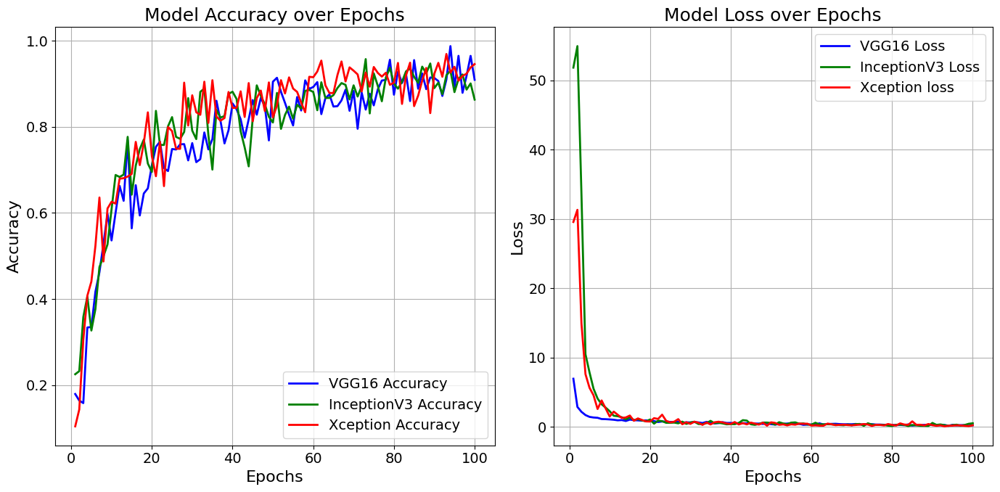

In [ ]:
import matplotlib.pyplot as plt
vgg16_data1 ={1: {'accuracy': 0.1794, 'loss': 6.9633}, 2: {'accuracy': 0.1642, 'loss': 2.8991}, 3: {'accuracy': 0.1583, 'loss': 2.1917}, 4: {'accuracy': 0.334, 'loss': 1.7223}, 5: {'accuracy': 0.3351, 'loss': 1.4617}, 6: {'accuracy': 0.4169, 'loss': 1.3711}, 7: {'accuracy': 0.4624, 'loss': 1.3289}, 8: {'accuracy': 0.5285, 'loss': 1.1493}, 9: {'accuracy': 0.5982, 'loss': 1.1307}, 10: {'accuracy': 0.5362, 'loss': 1.0941}, 11: {'accuracy': 0.6003, 'loss': 1.045}, 12: {'accuracy': 0.6629, 'loss': 0.9636}, 13: {'accuracy': 0.6283, 'loss': 1.0022}, 14: {'accuracy': 0.769, 'loss': 0.8681}, 15: {'accuracy': 0.5643, 'loss': 1.0681}, 16: {'accuracy': 0.6646, 'loss': 0.9881}, 17: {'accuracy': 0.5942, 'loss': 0.9581}, 18: {'accuracy': 0.6454, 'loss': 0.9117}, 19: {'accuracy': 0.6572, 'loss': 0.9586}, 20: {'accuracy': 0.7107, 'loss': 0.8674}, 21: {'accuracy': 0.7538, 'loss': 0.8522}, 22: {'accuracy': 0.7655, 'loss': 0.7184}, 23: {'accuracy': 0.7044, 'loss': 0.797}, 24: {'accuracy': 0.6974, 'loss': 0.7791}, 25: {'accuracy': 0.7486, 'loss': 0.7374}, 26: {'accuracy': 0.7475, 'loss': 0.7392}, 27: {'accuracy': 0.7594, 'loss': 0.7533}, 28: {'accuracy': 0.76, 'loss': 0.6185}, 29: {'accuracy': 0.7222, 'loss': 0.6812}, 30: {'accuracy': 0.7623, 'loss': 0.6578}, 31: {'accuracy': 0.7181, 'loss': 0.7108}, 32: {'accuracy': 0.7251, 'loss': 0.6645}, 33: {'accuracy': 0.7871, 'loss': 0.5774}, 34: {'accuracy': 0.7477, 'loss': 0.7388}, 35: {'accuracy': 0.7718, 'loss': 0.6139}, 36: {'accuracy': 0.8608, 'loss': 0.5254}, 37: {'accuracy': 0.8144, 'loss': 0.5645}, 38: {'accuracy': 0.7616, 'loss': 0.697}, 39: {'accuracy': 0.7922, 'loss': 0.5825}, 40: {'accuracy': 0.8544, 'loss': 0.5918}, 41: {'accuracy': 0.8408, 'loss': 0.53}, 42: {'accuracy': 0.8179, 'loss': 0.552}, 43: {'accuracy': 0.775, 'loss': 0.5556}, 44: {'accuracy': 0.8179, 'loss': 0.5238}, 45: {'accuracy': 0.8623, 'loss': 0.5063}, 46: {'accuracy': 0.8284, 'loss': 0.4955}, 47: {'accuracy': 0.8675, 'loss': 0.4926}, 48: {'accuracy': 0.8479, 'loss': 0.4406}, 49: {'accuracy': 0.7686, 'loss': 0.5446}, 50: {'accuracy': 0.905, 'loss': 0.4066}, 51: {'accuracy': 0.9141, 'loss': 0.3501}, 52: {'accuracy': 0.8815, 'loss': 0.4176}, 53: {'accuracy': 0.8557, 'loss': 0.4474}, 54: {'accuracy': 0.8284, 'loss': 0.4982}, 55: {'accuracy': 0.8034, 'loss': 0.5611}, 56: {'accuracy': 0.8694, 'loss': 0.4466}, 57: {'accuracy': 0.8381, 'loss': 0.4592}, 58: {'accuracy': 0.9081, 'loss': 0.3115}, 59: {'accuracy': 0.8884, 'loss': 0.3423}, 60: {'accuracy': 0.8927, 'loss': 0.3651}, 61: {'accuracy': 0.9041, 'loss': 0.3616}, 62: {'accuracy': 0.8297, 'loss': 0.5324}, 63: {'accuracy': 0.8665, 'loss': 0.3512}, 64: {'accuracy': 0.8755, 'loss': 0.4281}, 65: {'accuracy': 0.8473, 'loss': 0.4482}, 66: {'accuracy': 0.8482, 'loss': 0.4651}, 67: {'accuracy': 0.8616, 'loss': 0.4201}, 68: {'accuracy': 0.8864, 'loss': 0.3946}, 69: {'accuracy': 0.8374, 'loss': 0.4016}, 70: {'accuracy': 0.8835, 'loss': 0.3966}, 71: {'accuracy': 0.7956, 'loss': 0.4398}, 72: {'accuracy': 0.8798, 'loss': 0.371}, 73: {'accuracy': 0.8402, 'loss': 0.3763}, 74: {'accuracy': 0.8771, 'loss': 0.4032}, 75: {'accuracy': 0.85, 'loss': 0.4051}, 76: {'accuracy': 0.8873, 'loss': 0.3538}, 77: {'accuracy': 0.9077, 'loss': 0.3531}, 78: {'accuracy': 0.9092, 'loss': 0.319}, 79: {'accuracy': 0.956, 'loss': 0.3249}, 80: {'accuracy': 0.8748, 'loss': 0.3105}, 81: {'accuracy': 0.9284, 'loss': 0.2707}, 82: {'accuracy': 0.9019, 'loss': 0.3087}, 83: {'accuracy': 0.9223, 'loss': 0.2639}, 84: {'accuracy': 0.86, 'loss': 0.3751}, 85: {'accuracy': 0.9552, 'loss': 0.2048}, 86: {'accuracy': 0.8887, 'loss': 0.2793}, 87: {'accuracy': 0.9242, 'loss': 0.2684}, 88: {'accuracy': 0.8877, 'loss': 0.31}, 89: {'accuracy': 0.9148, 'loss': 0.3023}, 90: {'accuracy': 0.9137, 'loss': 0.2962}, 91: {'accuracy': 0.9065, 'loss': 0.2948}, 92: {'accuracy': 0.8719, 'loss': 0.2739}, 93: {'accuracy': 0.9101, 'loss': 0.2868}, 94: {'accuracy': 0.9877, 'loss': 0.1798}, 95: {'accuracy': 0.8914, 'loss': 0.3117}, 96: {'accuracy': 0.9651, 'loss': 0.2337}, 97: {'accuracy': 0.8792, 'loss': 0.2699}, 98: {'accuracy': 0.9187, 'loss': 0.2719}, 99: {'accuracy': 0.965, 'loss': 0.174}, 100: {'accuracy': 0.9094, 'loss': 0.2573}}
inception_V3_data1={1: {'accuracy': 0.2254, 'loss': 51.8278}, 2: {'accuracy': 0.2326, 'loss': 54.9307}, 3: {'accuracy': 0.3582, 'loss': 33.6479}, 4: {'accuracy': 0.4056, 'loss': 10.4874}, 5: {'accuracy': 0.3269, 'loss': 7.8765}, 6: {'accuracy': 0.3765, 'loss': 5.5222}, 7: {'accuracy': 0.4744, 'loss': 4.1083}, 8: {'accuracy': 0.4995, 'loss': 3.2767}, 9: {'accuracy': 0.527, 'loss': 2.7987}, 10: {'accuracy': 0.6083, 'loss': 2.2749}, 11: {'accuracy': 0.6883, 'loss': 1.6236}, 12: {'accuracy': 0.6836, 'loss': 1.5567}, 13: {'accuracy': 0.6892, 'loss': 1.4063}, 14: {'accuracy': 0.7769, 'loss': 1.0946}, 15: {'accuracy': 0.6425, 'loss': 1.389}, 16: {'accuracy': 0.7099, 'loss': 0.9918}, 17: {'accuracy': 0.7485, 'loss': 1.1318}, 18: {'accuracy': 0.7706, 'loss': 0.9453}, 19: {'accuracy': 0.7149, 'loss': 0.8169}, 20: {'accuracy': 0.6954, 'loss': 1.0806}, 21: {'accuracy': 0.8373, 'loss': 0.4818}, 22: {'accuracy': 0.7581, 'loss': 0.9162}, 23: {'accuracy': 0.7581, 'loss': 0.8423}, 24: {'accuracy': 0.8014, 'loss': 0.6038}, 25: {'accuracy': 0.8227, 'loss': 0.6102}, 26: {'accuracy': 0.7767, 'loss': 0.6364}, 27: {'accuracy': 0.7723, 'loss': 0.5299}, 28: {'accuracy': 0.7883, 'loss': 0.7738}, 29: {'accuracy': 0.8669, 'loss': 0.4532}, 30: {'accuracy': 0.7914, 'loss': 0.6501}, 31: {'accuracy': 0.7717, 'loss': 0.7655}, 32: {'accuracy': 0.8814, 'loss': 0.4298}, 33: {'accuracy': 0.8891, 'loss': 0.423}, 34: {'accuracy': 0.7812, 'loss': 0.5583}, 35: {'accuracy': 0.7008, 'loss': 0.889}, 36: {'accuracy': 0.8395, 'loss': 0.5445}, 37: {'accuracy': 0.8217, 'loss': 0.6086}, 38: {'accuracy': 0.8252, 'loss': 0.5153}, 39: {'accuracy': 0.8767, 'loss': 0.3858}, 40: {'accuracy': 0.8817, 'loss': 0.4222}, 41: {'accuracy': 0.8648, 'loss': 0.412}, 42: {'accuracy': 0.7902, 'loss': 0.589}, 43: {'accuracy': 0.7523, 'loss': 0.9881}, 44: {'accuracy': 0.7083, 'loss': 0.9233}, 45: {'accuracy': 0.8207, 'loss': 0.3911}, 46: {'accuracy': 0.8965, 'loss': 0.3129}, 47: {'accuracy': 0.8721, 'loss': 0.4356}, 48: {'accuracy': 0.8523, 'loss': 0.6401}, 49: {'accuracy': 0.8235, 'loss': 0.6409}, 50: {'accuracy': 0.8102, 'loss': 0.5709}, 51: {'accuracy': 0.8789, 'loss': 0.3403}, 52: {'accuracy': 0.7954, 'loss': 0.6921}, 53: {'accuracy': 0.8279, 'loss': 0.509}, 54: {'accuracy': 0.8471, 'loss': 0.397}, 55: {'accuracy': 0.819, 'loss': 0.6289}, 56: {'accuracy': 0.8515, 'loss': 0.6682}, 57: {'accuracy': 0.8426, 'loss': 0.4668}, 58: {'accuracy': 0.8837, 'loss': 0.5152}, 59: {'accuracy': 0.8858, 'loss': 0.3695}, 60: {'accuracy': 0.8812, 'loss': 0.334}, 61: {'accuracy': 0.8387, 'loss': 0.6145}, 62: {'accuracy': 0.9037, 'loss': 0.3673}, 63: {'accuracy': 0.8673, 'loss': 0.3902}, 64: {'accuracy': 0.8673, 'loss': 0.3936}, 65: {'accuracy': 0.8739, 'loss': 0.3855}, 66: {'accuracy': 0.8904, 'loss': 0.3313}, 67: {'accuracy': 0.9018, 'loss': 0.2884}, 68: {'accuracy': 0.8977, 'loss': 0.2581}, 69: {'accuracy': 0.8639, 'loss': 0.3581}, 70: {'accuracy': 0.8965, 'loss': 0.2514}, 71: {'accuracy': 0.8705, 'loss': 0.4133}, 72: {'accuracy': 0.8947, 'loss': 0.437}, 73: {'accuracy': 0.9575, 'loss': 0.1722}, 74: {'accuracy': 0.8313, 'loss': 0.5348}, 75: {'accuracy': 0.9244, 'loss': 0.3508}, 76: {'accuracy': 0.8954, 'loss': 0.3026}, 77: {'accuracy': 0.8596, 'loss': 0.2994}, 78: {'accuracy': 0.9148, 'loss': 0.292}, 79: {'accuracy': 0.9373, 'loss': 0.1995}, 80: {'accuracy': 0.9006, 'loss': 0.1443}, 81: {'accuracy': 0.8888, 'loss': 0.3193}, 82: {'accuracy': 0.9052, 'loss': 0.3386}, 83: {'accuracy': 0.9291, 'loss': 0.3052}, 84: {'accuracy': 0.9356, 'loss': 0.1334}, 85: {'accuracy': 0.9164, 'loss': 0.2864}, 86: {'accuracy': 0.9023, 'loss': 0.2405}, 87: {'accuracy': 0.94, 'loss': 0.1771}, 88: {'accuracy': 0.9244, 'loss': 0.1699}, 89: {'accuracy': 0.9473, 'loss': 0.1531}, 90: {'accuracy': 0.89, 'loss': 0.5889}, 91: {'accuracy': 0.9027, 'loss': 0.3067}, 92: {'accuracy': 0.876, 'loss': 0.3715}, 93: {'accuracy': 0.92, 'loss': 0.2599}, 94: {'accuracy': 0.9306, 'loss': 0.1676}, 95: {'accuracy': 0.8808, 'loss': 0.2706}, 96: {'accuracy': 0.9112, 'loss': 0.334}, 97: {'accuracy': 0.9219, 'loss': 0.184}, 98: {'accuracy': 0.8866, 'loss': 0.2923}, 99: {'accuracy': 0.901, 'loss': 0.4659}, 100: {'accuracy': 0.8634, 'loss': 0.5382}}
xception_data1={1: {'accuracy': 0.1043, 'loss': 29.569}, 2: {'accuracy': 0.1435, 'loss': 31.3197}, 3: {'accuracy': 0.3054, 'loss': 14.9576}, 4: {'accuracy': 0.4077, 'loss': 7.6184}, 5: {'accuracy': 0.4408, 'loss': 5.6597}, 6: {'accuracy': 0.5234, 'loss': 4.5739}, 7: {'accuracy': 0.636, 'loss': 2.5968}, 8: {'accuracy': 0.4873, 'loss': 3.8329}, 9: {'accuracy': 0.6104, 'loss': 2.6764}, 10: {'accuracy': 0.6261, 'loss': 1.5208}, 11: {'accuracy': 0.6217, 'loss': 2.2204}, 12: {'accuracy': 0.6796, 'loss': 1.7606}, 13: {'accuracy': 0.6808, 'loss': 1.3051}, 14: {'accuracy': 0.6846, 'loss': 1.3794}, 15: {'accuracy': 0.6908, 'loss': 1.6553}, 16: {'accuracy': 0.7652, 'loss': 0.8992}, 17: {'accuracy': 0.7113, 'loss': 1.2395}, 18: {'accuracy': 0.7625, 'loss': 1.0173}, 19: {'accuracy': 0.8338, 'loss': 0.8094}, 20: {'accuracy': 0.7317, 'loss': 0.7897}, 21: {'accuracy': 0.6854, 'loss': 1.2777}, 22: {'accuracy': 0.7653, 'loss': 1.1628}, 23: {'accuracy': 0.6624, 'loss': 1.7789}, 24: {'accuracy': 0.7998, 'loss': 0.8903}, 25: {'accuracy': 0.7902, 'loss': 0.6719}, 26: {'accuracy': 0.7494, 'loss': 0.7701}, 27: {'accuracy': 0.749, 'loss': 1.1369}, 28: {'accuracy': 0.9028, 'loss': 0.4007}, 29: {'accuracy': 0.8033, 'loss': 0.6896}, 30: {'accuracy': 0.8734, 'loss': 0.4517}, 31: {'accuracy': 0.834, 'loss': 0.7666}, 32: {'accuracy': 0.8281, 'loss': 0.6162}, 33: {'accuracy': 0.905, 'loss': 0.3044}, 34: {'accuracy': 0.8092, 'loss': 0.6506}, 35: {'accuracy': 0.9085, 'loss': 0.3704}, 36: {'accuracy': 0.8241, 'loss': 0.6869}, 37: {'accuracy': 0.8144, 'loss': 0.7616}, 38: {'accuracy': 0.8206, 'loss': 0.6668}, 39: {'accuracy': 0.8811, 'loss': 0.4983}, 40: {'accuracy': 0.8441, 'loss': 0.4437}, 41: {'accuracy': 0.8444, 'loss': 0.7174}, 42: {'accuracy': 0.8826, 'loss': 0.3634}, 43: {'accuracy': 0.8231, 'loss': 0.5606}, 44: {'accuracy': 0.9018, 'loss': 0.3787}, 45: {'accuracy': 0.8131, 'loss': 0.6329}, 46: {'accuracy': 0.8671, 'loss': 0.4916}, 47: {'accuracy': 0.8844, 'loss': 0.3426}, 48: {'accuracy': 0.8369, 'loss': 0.6246}, 49: {'accuracy': 0.9033, 'loss': 0.1893}, 50: {'accuracy': 0.8221, 'loss': 0.6739}, 51: {'accuracy': 0.8497, 'loss': 0.5907}, 52: {'accuracy': 0.9085, 'loss': 0.3134}, 53: {'accuracy': 0.8777, 'loss': 0.3791}, 54: {'accuracy': 0.915, 'loss': 0.2402}, 55: {'accuracy': 0.8891, 'loss': 0.3905}, 56: {'accuracy': 0.8813, 'loss': 0.3331}, 57: {'accuracy': 0.8566, 'loss': 0.491}, 58: {'accuracy': 0.8341, 'loss': 0.4601}, 59: {'accuracy': 0.9164, 'loss': 0.4796}, 60: {'accuracy': 0.9154, 'loss': 0.209}, 61: {'accuracy': 0.9287, 'loss': 0.2392}, 62: {'accuracy': 0.954, 'loss': 0.196}, 63: {'accuracy': 0.8967, 'loss': 0.1907}, 64: {'accuracy': 0.8788, 'loss': 0.491}, 65: {'accuracy': 0.8786, 'loss': 0.3873}, 66: {'accuracy': 0.9206, 'loss': 0.2662}, 67: {'accuracy': 0.952, 'loss': 0.3122}, 68: {'accuracy': 0.9056, 'loss': 0.3382}, 69: {'accuracy': 0.9383, 'loss': 0.282}, 70: {'accuracy': 0.9306, 'loss': 0.2459}, 71: {'accuracy': 0.9219, 'loss': 0.2923}, 72: {'accuracy': 0.8825, 'loss': 0.3402}, 73: {'accuracy': 0.9263, 'loss': 0.4258}, 74: {'accuracy': 0.8935, 'loss': 0.3583}, 75: {'accuracy': 0.9392, 'loss': 0.1542}, 76: {'accuracy': 0.9254, 'loss': 0.3198}, 77: {'accuracy': 0.9169, 'loss': 0.3009}, 78: {'accuracy': 0.9258, 'loss': 0.2295}, 79: {'accuracy': 0.8977, 'loss': 0.4278}, 80: {'accuracy': 0.9029, 'loss': 0.3051}, 81: {'accuracy': 0.9486, 'loss': 0.2158}, 82: {'accuracy': 0.8534, 'loss': 0.5245}, 83: {'accuracy': 0.9198, 'loss': 0.3582}, 84: {'accuracy': 0.9492, 'loss': 0.3046}, 85: {'accuracy': 0.8483, 'loss': 0.8175}, 86: {'accuracy': 0.8727, 'loss': 0.3211}, 87: {'accuracy': 0.9073, 'loss': 0.327}, 88: {'accuracy': 0.9369, 'loss': 0.2267}, 89: {'accuracy': 0.832, 'loss': 0.4293}, 90: {'accuracy': 0.9232, 'loss': 0.2599}, 91: {'accuracy': 0.9488, 'loss': 0.1709}, 92: {'accuracy': 0.9165, 'loss': 0.2348}, 93: {'accuracy': 0.9694, 'loss': 0.0957}, 94: {'accuracy': 0.9262, 'loss': 0.1798}, 95: {'accuracy': 0.9396, 'loss': 0.1948}, 96: {'accuracy': 0.9073, 'loss': 0.2354}, 97: {'accuracy': 0.9184, 'loss': 0.2219}, 98: {'accuracy': 0.9237, 'loss': 0.1686}, 99: {'accuracy': 0.9381, 'loss': 0.1266}, 100: {'accuracy': 0.9459, 'loss': 0.2472}}
alexnet_data1={1: {'accuracy': 0.094, 'loss': 2.6698}, 2: {'accuracy': 0.0938, 'loss': 2.0522}, 3: {'accuracy': 0.2526, 'loss': 2.0197}, 4: {'accuracy': 0.2083, 'loss': 1.8517}, 5: {'accuracy': 0.2764, 'loss': 1.7757}, 6: {'accuracy': 0.2812, 'loss': 1.622}, 7: {'accuracy': 0.2571, 'loss': 1.7264}, 8: {'accuracy': 0.2812, 'loss': 1.6837}, 9: {'accuracy': 0.3894, 'loss': 1.4544}, 10: {'accuracy': 0.3438, 'loss': 1.562}, 11: {'accuracy': 0.4077, 'loss': 1.4281}, 12: {'accuracy': 0.3438, 'loss': 1.349}, 13: {'accuracy': 0.3615, 'loss': 1.401}, 14: {'accuracy': 0.2812, 'loss': 1.4366}, 15: {'accuracy': 0.395, 'loss': 1.3276}, 16: {'accuracy': 0.3438, 'loss': 1.4651}, 17: {'accuracy': 0.4141, 'loss': 1.4066}, 18: {'accuracy': 0.4375, 'loss': 1.397}, 19: {'accuracy': 0.4987, 'loss': 1.1593}, 20: {'accuracy': 0.2917, 'loss': 1.6096}, 21: {'accuracy': 0.4213, 'loss': 1.3113}, 22: {'accuracy': 0.4062, 'loss': 1.3106}, 23: {'accuracy': 0.5101, 'loss': 1.1635}, 24: {'accuracy': 0.3125, 'loss': 1.4915}, 25: {'accuracy': 0.5378, 'loss': 1.137}, 26: {'accuracy': 0.5417, 'loss': 1.2563}, 27: {'accuracy': 0.5439, 'loss': 1.0463}, 28: {'accuracy': 0.4688, 'loss': 1.266}, 29: {'accuracy': 0.3941, 'loss': 1.2354}, 30: {'accuracy': 0.4375, 'loss': 1.5233}, 31: {'accuracy': 0.5806, 'loss': 1.0344}, 32: {'accuracy': 0.4688, 'loss': 1.5734}, 33: {'accuracy': 0.4379, 'loss': 1.2999}, 34: {'accuracy': 0.5625, 'loss': 1.075}, 35: {'accuracy': 0.5614, 'loss': 1.1286}, 36: {'accuracy': 0.5625, 'loss': 1.1291}, 37: {'accuracy': 0.5482, 'loss': 1.0708}, 38: {'accuracy': 0.625, 'loss': 1.0554}, 39: {'accuracy': 0.6019, 'loss': 0.9894}, 40: {'accuracy': 0.5938, 'loss': 1.0049}, 41: {'accuracy': 0.6011, 'loss': 1.1141}, 42: {'accuracy': 0.6562, 'loss': 0.904}, 43: {'accuracy': 0.5423, 'loss': 1.1348}, 44: {'accuracy': 0.7188, 'loss': 0.9946}, 45: {'accuracy': 0.5859, 'loss': 1.0129}, 46: {'accuracy': 0.625, 'loss': 0.8547}, 47: {'accuracy': 0.5911, 'loss': 1.0076}, 48: {'accuracy': 0.625, 'loss': 0.8242}, 49: {'accuracy': 0.603, 'loss': 0.9565}, 50: {'accuracy': 0.5, 'loss': 1.1962}, 51: {'accuracy': 0.6869, 'loss': 0.8672}, 52: {'accuracy': 0.5938, 'loss': 0.993}, 53: {'accuracy': 0.6193, 'loss': 0.8434}, 54: {'accuracy': 0.5312, 'loss': 1.0284}, 55: {'accuracy': 0.7407, 'loss': 0.7092}, 56: {'accuracy': 0.625, 'loss': 1.0825}, 57: {'accuracy': 0.6342, 'loss': 0.9326}, 58: {'accuracy': 0.5938, 'loss': 0.9347}, 59: {'accuracy': 0.5933, 'loss': 0.7961}, 60: {'accuracy': 0.5312, 'loss': 1.129}, 61: {'accuracy': 0.6342, 'loss': 0.9178}, 62: {'accuracy': 0.7188, 'loss': 0.7359}, 63: {'accuracy': 0.6576, 'loss': 0.8685}, 64: {'accuracy': 0.5417, 'loss': 0.9069}, 65: {'accuracy': 0.6062, 'loss': 0.8554}, 66: {'accuracy': 0.625, 'loss': 0.8264}, 67: {'accuracy': 0.7116, 'loss': 0.7122}, 68: {'accuracy': 0.6562, 'loss': 0.8209}, 69: {'accuracy': 0.6471, 'loss': 0.7833}, 70: {'accuracy': 0.625, 'loss': 1.0244}, 71: {'accuracy': 0.6172, 'loss': 0.8355}, 72: {'accuracy': 0.6875, 'loss': 0.7389}, 73: {'accuracy': 0.586, 'loss': 0.9122}, 74: {'accuracy': 0.6562, 'loss': 0.8661}, 75: {'accuracy': 0.6745, 'loss': 0.8551}, 76: {'accuracy': 0.5417, 'loss': 0.8559}, 77: {'accuracy': 0.651, 'loss': 0.8375}, 78: {'accuracy': 0.7083, 'loss': 0.7114}, 79: {'accuracy': 0.5866, 'loss': 0.8988}, 80: {'accuracy': 0.75, 'loss': 0.7217}, 81: {'accuracy': 0.696, 'loss': 0.7244}, 82: {'accuracy': 0.5625, 'loss': 1.4965}, 83: {'accuracy': 0.7148, 'loss': 0.7305}, 84: {'accuracy': 0.5417, 'loss': 1.0756}, 85: {'accuracy': 0.777, 'loss': 0.6363}, 86: {'accuracy': 0.6875, 'loss': 0.9101}, 87: {'accuracy': 0.6549, 'loss': 0.7059}, 88: {'accuracy': 0.6875, 'loss': 0.6579}, 89: {'accuracy': 0.652, 'loss': 0.6833}, 90: {'accuracy': 0.6562, 'loss': 0.874}, 91: {'accuracy': 0.8619, 'loss': 0.4898}, 92: {'accuracy': 0.75, 'loss': 0.6161}, 93: {'accuracy': 0.7682, 'loss': 0.6455}, 94: {'accuracy': 0.6667, 'loss': 0.817}, 95: {'accuracy': 0.7331, 'loss': 0.5564}, 96: {'accuracy': 0.75, 'loss': 0.8637}, 97: {'accuracy': 0.6743, 'loss': 0.7945}, 98: {'accuracy': 0.7188, 'loss': 0.7566}, 99: {'accuracy': 0.7766, 'loss': 0.6525}, 100: {'accuracy': 0.6562, 'loss': 0.8359}, 101: {'accuracy': 0.7044, 'loss': 0.6471}, 102: {'accuracy': 0.5417, 'loss': 0.9005}, 103: {'accuracy': 0.8529, 'loss': 0.4442}, 104: {'accuracy': 0.7917, 'loss': 0.7116}, 105: {'accuracy': 0.6993, 'loss': 0.7385}, 106: {'accuracy': 0.7188, 'loss': 0.6914}, 107: {'accuracy': 0.8867, 'loss': 0.4513}, 108: {'accuracy': 0.7188, 'loss': 0.7514}, 109: {'accuracy': 0.7592, 'loss': 0.5526}, 110: {'accuracy': 0.625, 'loss': 0.936}, 111: {'accuracy': 0.7396, 'loss': 0.6391}, 112: {'accuracy': 0.7917, 'loss': 0.59}, 113: {'accuracy': 0.7396, 'loss': 0.4931}, 114: {'accuracy': 0.875, 'loss': 0.5491}, 115: {'accuracy': 0.7752, 'loss': 0.5684}, 116: {'accuracy': 0.7812, 'loss': 0.4871}, 117: {'accuracy': 0.8079, 'loss': 0.4718}, 118: {'accuracy': 0.8125, 'loss': 0.3695}, 119: {'accuracy': 0.826, 'loss': 0.4287}, 120: {'accuracy': 0.7188, 'loss': 0.597}, 121: {'accuracy': 0.8559, 'loss': 0.3691}, 122: {'accuracy': 0.7188, 'loss': 0.7496}, 123: {'accuracy': 0.8724, 'loss': 0.4515}, 124: {'accuracy': 0.875, 'loss': 0.4017}, 125: {'accuracy': 0.7591, 'loss': 0.6004}, 126: {'accuracy': 0.7917, 'loss': 0.8416}, 127: {'accuracy': 0.8359, 'loss': 0.5269}, 128: {'accuracy': 0.625, 'loss': 0.9295}, 129: {'accuracy': 0.8842, 'loss': 0.4107}, 130: {'accuracy': 0.75, 'loss': 0.4511}, 131: {'accuracy': 0.8623, 'loss': 0.4177}, 132: {'accuracy': 0.7188, 'loss': 0.6342}, 133: {'accuracy': 0.7479, 'loss': 0.5824}, 134: {'accuracy': 0.6562, 'loss': 0.6871}, 135: {'accuracy': 0.8162, 'loss': 0.4706}, 136: {'accuracy': 0.8125, 'loss': 0.6518}, 137: {'accuracy': 0.8542, 'loss': 0.4239}, 138: {'accuracy': 0.5833, 'loss': 1.1132}, 139: {'accuracy': 0.7074, 'loss': 0.5567}, 140: {'accuracy': 0.7812, 'loss': 0.4804}, 141: {'accuracy': 0.8659, 'loss': 0.3884}, 142: {'accuracy': 0.75, 'loss': 0.5547}, 143: {'accuracy': 0.8374, 'loss': 0.369}, 144: {'accuracy': 0.6875, 'loss': 0.7296}, 145: {'accuracy': 0.8287, 'loss': 0.4886}, 146: {'accuracy': 0.8125, 'loss': 0.5031}, 147: {'accuracy': 0.9196, 'loss': 0.2663}, 148: {'accuracy': 0.7812, 'loss': 0.5487}, 149: {'accuracy': 0.7493, 'loss': 0.4967}, 150: {'accuracy': 0.9688, 'loss': 0.2044}, 151: {'accuracy': 0.8636, 'loss': 0.3703}, 152: {'accuracy': 0.7188, 'loss': 0.7875}, 153: {'accuracy': 0.8114, 'loss': 0.4884}, 154: {'accuracy': 0.7188, 'loss': 0.6395}, 155: {'accuracy': 0.8285, 'loss': 0.5119}, 156: {'accuracy': 0.875, 'loss': 0.3227}, 157: {'accuracy': 0.8305, 'loss': 0.4517}, 158: {'accuracy': 0.9062, 'loss': 0.2612}, 159: {'accuracy': 0.801, 'loss': 0.495}, 160: {'accuracy': 0.8125, 'loss': 0.4516}, 161: {'accuracy': 0.9518, 'loss': 0.2527}, 162: {'accuracy': 0.9167, 'loss': 0.3473}, 163: {'accuracy': 0.8885, 'loss': 0.2673}, 164: {'accuracy': 0.8438, 'loss': 0.5339}, 165: {'accuracy': 0.8366, 'loss': 0.3482}, 166: {'accuracy': 0.8125, 'loss': 0.4537}, 167: {'accuracy': 0.8918, 'loss': 0.3536}, 168: {'accuracy': 0.8438, 'loss': 0.2518}, 169: {'accuracy': 0.8661, 'loss': 0.5333}, 170: {'accuracy': 0.7812, 'loss': 0.4902}, 171: {'accuracy': 0.8729, 'loss': 0.3027}, 172: {'accuracy': 0.875, 'loss': 0.3096}, 173: {'accuracy': 0.9265, 'loss': 0.3106}, 174: {'accuracy': 0.9062, 'loss': 0.246}, 175: {'accuracy': 0.8672, 'loss': 0.4059}, 176: {'accuracy': 0.75, 'loss': 0.4629}, 177: {'accuracy': 0.9036, 'loss': 0.2578}, 178: {'accuracy': 0.75, 'loss': 0.4259}, 179: {'accuracy': 0.8099, 'loss': 0.5608}, 180: {'accuracy': 0.9583, 'loss': 0.197}, 181: {'accuracy': 0.9097, 'loss': 0.3278}, 182: {'accuracy': 0.7812, 'loss': 0.4952}, 183: {'accuracy': 0.8672, 'loss': 0.3991}, 184: {'accuracy': 0.9583, 'loss': 0.1807}, 185: {'accuracy': 0.9206, 'loss': 0.2386}, 186: {'accuracy': 0.875, 'loss': 0.4418}, 187: {'accuracy': 0.9532, 'loss': 0.1972}, 188: {'accuracy': 0.8125, 'loss': 0.5086}, 189: {'accuracy': 0.9381, 'loss': 0.2195}, 190: {'accuracy': 0.9688, 'loss': 0.1574}, 191: {'accuracy': 0.864, 'loss': 0.2894}, 192: {'accuracy': 0.8438, 'loss': 0.3843}, 193: {'accuracy': 0.9035, 'loss': 0.2218}, 194: {'accuracy': 0.8438, 'loss': 0.5773}, 195: {'accuracy': 0.9219, 'loss': 0.2568}, 196: {'accuracy': 0.875, 'loss': 0.3574}, 197: {'accuracy': 0.9031, 'loss': 0.1847}, 198: {'accuracy': 0.9062, 'loss': 0.3427}, 199: {'accuracy': 0.8428, 'loss': 0.4345}, 200: {'accuracy': 0.875, 'loss': 0.4099}}

vgg16_epochs1 = list(vgg16_data1.keys())
vgg16_accuracy1 = [vgg16_data1[epoch]['accuracy'] for epoch in vgg16_epochs1]  # Use vgg16_epochs1 here
vgg16_loss1 = [vgg16_data1[epoch]['loss'] for epoch in vgg16_epochs1]        # Use vgg16_epochs1 here

inception_epochs1 = list(inception_V3_data1.keys())
inception_accuracy1 = [inception_V3_data1[epoch]['accuracy'] for epoch in inception_epochs1] # Use inception_epochs1 here
inception_loss1 = [inception_V3_data1[epoch]['loss'] for epoch in inception_epochs1]       # Use inception_epochs1 here

xception_epochs1 = list(xception_data1.keys())
xception_accuracy1 = [xception_data1[epoch]['accuracy'] for epoch in xception_epochs1]   # Use xception_epochs1 here
xception_loss1 = [xception_data1[epoch]['loss'] for epoch in xception_epochs1]         # Use xception_epochs1 here



# Plotting with increased font size
plt.rcParams.update({'font.size': 14})  # Set default font size

fig, axs = plt.subplots(1, 2, figsize=(14, 7))

# Plotting Accuracy
axs[0].plot(vgg16_epochs1, vgg16_accuracy1, label='VGG16 Accuracy', color='blue', linewidth=2)
axs[0].plot(inception_epochs1, inception_accuracy1, label='InceptionV3 Accuracy', color='green', linewidth=2)
axs[0].plot(xception_epochs1, xception_accuracy1, label='Xception Accuracy', color='red', linewidth=2)
axs[0].set_title('Model Accuracy over Epochs', fontsize=18)
axs[0].set_xlabel('Epochs', fontsize=16)
axs[0].set_ylabel('Accuracy', fontsize=16)
axs[0].legend(fontsize=14)
axs[0].grid(True)
axs[0].tick_params(axis='both', which='major', labelsize=14)

# Plotting Loss
axs[1].plot(vgg16_epochs1, vgg16_loss1, label='VGG16 Loss', color='blue', linewidth=2)
axs[1].plot(inception_epochs1, inception_loss1, label='InceptionV3 Loss', color='green', linewidth=2)
axs[1].plot(xception_epochs1, xception_loss1, label='Xception loss', color='red', linewidth=2)
axs[1].set_title('Model Loss over Epochs', fontsize=18)
axs[1].set_xlabel('Epochs', fontsize=16)
axs[1].set_ylabel('Loss', fontsize=16)
axs[1].legend(fontsize=14)
axs[1].grid(True)
axs[1].tick_params(axis='both', which='major', labelsize=14)

# Display the plots
plt.tight_layout()
plt.show()

In [ ]:
vgg16_data1 ={1: {'accuracy': 0.1794, 'loss': 6.9633}, 2: {'accuracy': 0.1642, 'loss': 2.8991}, 3: {'accuracy': 0.1583, 'loss': 2.1917}, 4: {'accuracy': 0.334, 'loss': 1.7223}, 5: {'accuracy': 0.3351, 'loss': 1.4617}, 6: {'accuracy': 0.4169, 'loss': 1.3711}, 7: {'accuracy': 0.4624, 'loss': 1.3289}, 8: {'accuracy': 0.5285, 'loss': 1.1493}, 9: {'accuracy': 0.5982, 'loss': 1.1307}, 10: {'accuracy': 0.5362, 'loss': 1.0941}, 11: {'accuracy': 0.6003, 'loss': 1.045}, 12: {'accuracy': 0.6629, 'loss': 0.9636}, 13: {'accuracy': 0.6283, 'loss': 1.0022}, 14: {'accuracy': 0.769, 'loss': 0.8681}, 15: {'accuracy': 0.5643, 'loss': 1.0681}, 16: {'accuracy': 0.6646, 'loss': 0.9881}, 17: {'accuracy': 0.5942, 'loss': 0.9581}, 18: {'accuracy': 0.6454, 'loss': 0.9117}, 19: {'accuracy': 0.6572, 'loss': 0.9586}, 20: {'accuracy': 0.7107, 'loss': 0.8674}, 21: {'accuracy': 0.7538, 'loss': 0.8522}, 22: {'accuracy': 0.7655, 'loss': 0.7184}, 23: {'accuracy': 0.7044, 'loss': 0.797}, 24: {'accuracy': 0.6974, 'loss': 0.7791}, 25: {'accuracy': 0.7486, 'loss': 0.7374}, 26: {'accuracy': 0.7475, 'loss': 0.7392}, 27: {'accuracy': 0.7594, 'loss': 0.7533}, 28: {'accuracy': 0.76, 'loss': 0.6185}, 29: {'accuracy': 0.7222, 'loss': 0.6812}, 30: {'accuracy': 0.7623, 'loss': 0.6578}, 31: {'accuracy': 0.7181, 'loss': 0.7108}, 32: {'accuracy': 0.7251, 'loss': 0.6645}, 33: {'accuracy': 0.7871, 'loss': 0.5774}, 34: {'accuracy': 0.7477, 'loss': 0.7388}, 35: {'accuracy': 0.7718, 'loss': 0.6139}, 36: {'accuracy': 0.8608, 'loss': 0.5254}, 37: {'accuracy': 0.8144, 'loss': 0.5645}, 38: {'accuracy': 0.7616, 'loss': 0.697}, 39: {'accuracy': 0.7922, 'loss': 0.5825}, 40: {'accuracy': 0.8544, 'loss': 0.5918}, 41: {'accuracy': 0.8408, 'loss': 0.53}, 42: {'accuracy': 0.8179, 'loss': 0.552}, 43: {'accuracy': 0.775, 'loss': 0.5556}, 44: {'accuracy': 0.8179, 'loss': 0.5238}, 45: {'accuracy': 0.8623, 'loss': 0.5063}, 46: {'accuracy': 0.8284, 'loss': 0.4955}, 47: {'accuracy': 0.8675, 'loss': 0.4926}, 48: {'accuracy': 0.8479, 'loss': 0.4406}, 49: {'accuracy': 0.7686, 'loss': 0.5446}, 50: {'accuracy': 0.905, 'loss': 0.4066}, 51: {'accuracy': 0.9141, 'loss': 0.3501}, 52: {'accuracy': 0.8815, 'loss': 0.4176}, 53: {'accuracy': 0.8557, 'loss': 0.4474}, 54: {'accuracy': 0.8284, 'loss': 0.4982}, 55: {'accuracy': 0.8034, 'loss': 0.5611}, 56: {'accuracy': 0.8694, 'loss': 0.4466}, 57: {'accuracy': 0.8381, 'loss': 0.4592}, 58: {'accuracy': 0.9081, 'loss': 0.3115}, 59: {'accuracy': 0.8884, 'loss': 0.3423}, 60: {'accuracy': 0.8927, 'loss': 0.3651}, 61: {'accuracy': 0.9041, 'loss': 0.3616}, 62: {'accuracy': 0.8297, 'loss': 0.5324}, 63: {'accuracy': 0.8665, 'loss': 0.3512}, 64: {'accuracy': 0.8755, 'loss': 0.4281}, 65: {'accuracy': 0.8473, 'loss': 0.4482}, 66: {'accuracy': 0.8482, 'loss': 0.4651}, 67: {'accuracy': 0.8616, 'loss': 0.4201}, 68: {'accuracy': 0.8864, 'loss': 0.3946}, 69: {'accuracy': 0.8374, 'loss': 0.4016}, 70: {'accuracy': 0.8835, 'loss': 0.3966}, 71: {'accuracy': 0.7956, 'loss': 0.4398}, 72: {'accuracy': 0.8798, 'loss': 0.371}, 73: {'accuracy': 0.8402, 'loss': 0.3763}, 74: {'accuracy': 0.8771, 'loss': 0.4032}, 75: {'accuracy': 0.85, 'loss': 0.4051}, 76: {'accuracy': 0.8873, 'loss': 0.3538}, 77: {'accuracy': 0.9077, 'loss': 0.3531}, 78: {'accuracy': 0.9092, 'loss': 0.319}, 79: {'accuracy': 0.956, 'loss': 0.3249}, 80: {'accuracy': 0.8748, 'loss': 0.3105}, 81: {'accuracy': 0.9284, 'loss': 0.2707}, 82: {'accuracy': 0.9019, 'loss': 0.3087}, 83: {'accuracy': 0.9223, 'loss': 0.2639}, 84: {'accuracy': 0.86, 'loss': 0.3751}, 85: {'accuracy': 0.9552, 'loss': 0.2048}, 86: {'accuracy': 0.8887, 'loss': 0.2793}, 87: {'accuracy': 0.9242, 'loss': 0.2684}, 88: {'accuracy': 0.8877, 'loss': 0.31}, 89: {'accuracy': 0.9148, 'loss': 0.3023}, 90: {'accuracy': 0.9137, 'loss': 0.2962}, 91: {'accuracy': 0.9065, 'loss': 0.2948}, 92: {'accuracy': 0.8719, 'loss': 0.2739}, 93: {'accuracy': 0.9101, 'loss': 0.2868}, 94: {'accuracy': 0.9877, 'loss': 0.1798}, 95: {'accuracy': 0.8914, 'loss': 0.3117}, 96: {'accuracy': 0.9651, 'loss': 0.2337}, 97: {'accuracy': 0.8792, 'loss': 0.2699}, 98: {'accuracy': 0.9187, 'loss': 0.2719}, 99: {'accuracy': 0.965, 'loss': 0.174}, 100: {'accuracy': 0.9094, 'loss': 0.2573}}
inception_V3_data1={1: {'accuracy': 0.2254, 'loss': 51.8278}, 2: {'accuracy': 0.2326, 'loss': 54.9307}, 3: {'accuracy': 0.3582, 'loss': 33.6479}, 4: {'accuracy': 0.4056, 'loss': 10.4874}, 5: {'accuracy': 0.3269, 'loss': 7.8765}, 6: {'accuracy': 0.3765, 'loss': 5.5222}, 7: {'accuracy': 0.4744, 'loss': 4.1083}, 8: {'accuracy': 0.4995, 'loss': 3.2767}, 9: {'accuracy': 0.527, 'loss': 2.7987}, 10: {'accuracy': 0.6083, 'loss': 2.2749}, 11: {'accuracy': 0.6883, 'loss': 1.6236}, 12: {'accuracy': 0.6836, 'loss': 1.5567}, 13: {'accuracy': 0.6892, 'loss': 1.4063}, 14: {'accuracy': 0.7769, 'loss': 1.0946}, 15: {'accuracy': 0.6425, 'loss': 1.389}, 16: {'accuracy': 0.7099, 'loss': 0.9918}, 17: {'accuracy': 0.7485, 'loss': 1.1318}, 18: {'accuracy': 0.7706, 'loss': 0.9453}, 19: {'accuracy': 0.7149, 'loss': 0.8169}, 20: {'accuracy': 0.6954, 'loss': 1.0806}, 21: {'accuracy': 0.8373, 'loss': 0.4818}, 22: {'accuracy': 0.7581, 'loss': 0.9162}, 23: {'accuracy': 0.7581, 'loss': 0.8423}, 24: {'accuracy': 0.8014, 'loss': 0.6038}, 25: {'accuracy': 0.8227, 'loss': 0.6102}, 26: {'accuracy': 0.7767, 'loss': 0.6364}, 27: {'accuracy': 0.7723, 'loss': 0.5299}, 28: {'accuracy': 0.7883, 'loss': 0.7738}, 29: {'accuracy': 0.8669, 'loss': 0.4532}, 30: {'accuracy': 0.7914, 'loss': 0.6501}, 31: {'accuracy': 0.7717, 'loss': 0.7655}, 32: {'accuracy': 0.8814, 'loss': 0.4298}, 33: {'accuracy': 0.8891, 'loss': 0.423}, 34: {'accuracy': 0.7812, 'loss': 0.5583}, 35: {'accuracy': 0.7008, 'loss': 0.889}, 36: {'accuracy': 0.8395, 'loss': 0.5445}, 37: {'accuracy': 0.8217, 'loss': 0.6086}, 38: {'accuracy': 0.8252, 'loss': 0.5153}, 39: {'accuracy': 0.8767, 'loss': 0.3858}, 40: {'accuracy': 0.8817, 'loss': 0.4222}, 41: {'accuracy': 0.8648, 'loss': 0.412}, 42: {'accuracy': 0.7902, 'loss': 0.589}, 43: {'accuracy': 0.7523, 'loss': 0.9881}, 44: {'accuracy': 0.7083, 'loss': 0.9233}, 45: {'accuracy': 0.8207, 'loss': 0.3911}, 46: {'accuracy': 0.8965, 'loss': 0.3129}, 47: {'accuracy': 0.8721, 'loss': 0.4356}, 48: {'accuracy': 0.8523, 'loss': 0.6401}, 49: {'accuracy': 0.8235, 'loss': 0.6409}, 50: {'accuracy': 0.8102, 'loss': 0.5709}, 51: {'accuracy': 0.8789, 'loss': 0.3403}, 52: {'accuracy': 0.7954, 'loss': 0.6921}, 53: {'accuracy': 0.8279, 'loss': 0.509}, 54: {'accuracy': 0.8471, 'loss': 0.397}, 55: {'accuracy': 0.819, 'loss': 0.6289}, 56: {'accuracy': 0.8515, 'loss': 0.6682}, 57: {'accuracy': 0.8426, 'loss': 0.4668}, 58: {'accuracy': 0.8837, 'loss': 0.5152}, 59: {'accuracy': 0.8858, 'loss': 0.3695}, 60: {'accuracy': 0.8812, 'loss': 0.334}, 61: {'accuracy': 0.8387, 'loss': 0.6145}, 62: {'accuracy': 0.9037, 'loss': 0.3673}, 63: {'accuracy': 0.8673, 'loss': 0.3902}, 64: {'accuracy': 0.8673, 'loss': 0.3936}, 65: {'accuracy': 0.8739, 'loss': 0.3855}, 66: {'accuracy': 0.8904, 'loss': 0.3313}, 67: {'accuracy': 0.9018, 'loss': 0.2884}, 68: {'accuracy': 0.8977, 'loss': 0.2581}, 69: {'accuracy': 0.8639, 'loss': 0.3581}, 70: {'accuracy': 0.8965, 'loss': 0.2514}, 71: {'accuracy': 0.8705, 'loss': 0.4133}, 72: {'accuracy': 0.8947, 'loss': 0.437}, 73: {'accuracy': 0.9575, 'loss': 0.1722}, 74: {'accuracy': 0.8313, 'loss': 0.5348}, 75: {'accuracy': 0.9244, 'loss': 0.3508}, 76: {'accuracy': 0.8954, 'loss': 0.3026}, 77: {'accuracy': 0.8596, 'loss': 0.2994}, 78: {'accuracy': 0.9148, 'loss': 0.292}, 79: {'accuracy': 0.9373, 'loss': 0.1995}, 80: {'accuracy': 0.9006, 'loss': 0.1443}, 81: {'accuracy': 0.8888, 'loss': 0.3193}, 82: {'accuracy': 0.9052, 'loss': 0.3386}, 83: {'accuracy': 0.9291, 'loss': 0.3052}, 84: {'accuracy': 0.9356, 'loss': 0.1334}, 85: {'accuracy': 0.9164, 'loss': 0.2864}, 86: {'accuracy': 0.9023, 'loss': 0.2405}, 87: {'accuracy': 0.94, 'loss': 0.1771}, 88: {'accuracy': 0.9244, 'loss': 0.1699}, 89: {'accuracy': 0.9473, 'loss': 0.1531}, 90: {'accuracy': 0.89, 'loss': 0.5889}, 91: {'accuracy': 0.9027, 'loss': 0.3067}, 92: {'accuracy': 0.876, 'loss': 0.3715}, 93: {'accuracy': 0.92, 'loss': 0.2599}, 94: {'accuracy': 0.9306, 'loss': 0.1676}, 95: {'accuracy': 0.8808, 'loss': 0.2706}, 96: {'accuracy': 0.9112, 'loss': 0.334}, 97: {'accuracy': 0.9219, 'loss': 0.184}, 98: {'accuracy': 0.8866, 'loss': 0.2923}, 99: {'accuracy': 0.901, 'loss': 0.4659}, 100: {'accuracy': 0.8634, 'loss': 0.5382}}
xception_data1={1: {'accuracy': 0.1043, 'loss': 29.569}, 2: {'accuracy': 0.1435, 'loss': 31.3197}, 3: {'accuracy': 0.3054, 'loss': 14.9576}, 4: {'accuracy': 0.4077, 'loss': 7.6184}, 5: {'accuracy': 0.4408, 'loss': 5.6597}, 6: {'accuracy': 0.5234, 'loss': 4.5739}, 7: {'accuracy': 0.636, 'loss': 2.5968}, 8: {'accuracy': 0.4873, 'loss': 3.8329}, 9: {'accuracy': 0.6104, 'loss': 2.6764}, 10: {'accuracy': 0.6261, 'loss': 1.5208}, 11: {'accuracy': 0.6217, 'loss': 2.2204}, 12: {'accuracy': 0.6796, 'loss': 1.7606}, 13: {'accuracy': 0.6808, 'loss': 1.3051}, 14: {'accuracy': 0.6846, 'loss': 1.3794}, 15: {'accuracy': 0.6908, 'loss': 1.6553}, 16: {'accuracy': 0.7652, 'loss': 0.8992}, 17: {'accuracy': 0.7113, 'loss': 1.2395}, 18: {'accuracy': 0.7625, 'loss': 1.0173}, 19: {'accuracy': 0.8338, 'loss': 0.8094}, 20: {'accuracy': 0.7317, 'loss': 0.7897}, 21: {'accuracy': 0.6854, 'loss': 1.2777}, 22: {'accuracy': 0.7653, 'loss': 1.1628}, 23: {'accuracy': 0.6624, 'loss': 1.7789}, 24: {'accuracy': 0.7998, 'loss': 0.8903}, 25: {'accuracy': 0.7902, 'loss': 0.6719}, 26: {'accuracy': 0.7494, 'loss': 0.7701}, 27: {'accuracy': 0.749, 'loss': 1.1369}, 28: {'accuracy': 0.9028, 'loss': 0.4007}, 29: {'accuracy': 0.8033, 'loss': 0.6896}, 30: {'accuracy': 0.8734, 'loss': 0.4517}, 31: {'accuracy': 0.834, 'loss': 0.7666}, 32: {'accuracy': 0.8281, 'loss': 0.6162}, 33: {'accuracy': 0.905, 'loss': 0.3044}, 34: {'accuracy': 0.8092, 'loss': 0.6506}, 35: {'accuracy': 0.9085, 'loss': 0.3704}, 36: {'accuracy': 0.8241, 'loss': 0.6869}, 37: {'accuracy': 0.8144, 'loss': 0.7616}, 38: {'accuracy': 0.8206, 'loss': 0.6668}, 39: {'accuracy': 0.8811, 'loss': 0.4983}, 40: {'accuracy': 0.8441, 'loss': 0.4437}, 41: {'accuracy': 0.8444, 'loss': 0.7174}, 42: {'accuracy': 0.8826, 'loss': 0.3634}, 43: {'accuracy': 0.8231, 'loss': 0.5606}, 44: {'accuracy': 0.9018, 'loss': 0.3787}, 45: {'accuracy': 0.8131, 'loss': 0.6329}, 46: {'accuracy': 0.8671, 'loss': 0.4916}, 47: {'accuracy': 0.8844, 'loss': 0.3426}, 48: {'accuracy': 0.8369, 'loss': 0.6246}, 49: {'accuracy': 0.9033, 'loss': 0.1893}, 50: {'accuracy': 0.8221, 'loss': 0.6739}, 51: {'accuracy': 0.8497, 'loss': 0.5907}, 52: {'accuracy': 0.9085, 'loss': 0.3134}, 53: {'accuracy': 0.8777, 'loss': 0.3791}, 54: {'accuracy': 0.915, 'loss': 0.2402}, 55: {'accuracy': 0.8891, 'loss': 0.3905}, 56: {'accuracy': 0.8813, 'loss': 0.3331}, 57: {'accuracy': 0.8566, 'loss': 0.491}, 58: {'accuracy': 0.8341, 'loss': 0.4601}, 59: {'accuracy': 0.9164, 'loss': 0.4796}, 60: {'accuracy': 0.9154, 'loss': 0.209}, 61: {'accuracy': 0.9287, 'loss': 0.2392}, 62: {'accuracy': 0.954, 'loss': 0.196}, 63: {'accuracy': 0.8967, 'loss': 0.1907}, 64: {'accuracy': 0.8788, 'loss': 0.491}, 65: {'accuracy': 0.8786, 'loss': 0.3873}, 66: {'accuracy': 0.9206, 'loss': 0.2662}, 67: {'accuracy': 0.952, 'loss': 0.3122}, 68: {'accuracy': 0.9056, 'loss': 0.3382}, 69: {'accuracy': 0.9383, 'loss': 0.282}, 70: {'accuracy': 0.9306, 'loss': 0.2459}, 71: {'accuracy': 0.9219, 'loss': 0.2923}, 72: {'accuracy': 0.8825, 'loss': 0.3402}, 73: {'accuracy': 0.9263, 'loss': 0.4258}, 74: {'accuracy': 0.8935, 'loss': 0.3583}, 75: {'accuracy': 0.9392, 'loss': 0.1542}, 76: {'accuracy': 0.9254, 'loss': 0.3198}, 77: {'accuracy': 0.9169, 'loss': 0.3009}, 78: {'accuracy': 0.9258, 'loss': 0.2295}, 79: {'accuracy': 0.8977, 'loss': 0.4278}, 80: {'accuracy': 0.9029, 'loss': 0.3051}, 81: {'accuracy': 0.9486, 'loss': 0.2158}, 82: {'accuracy': 0.8534, 'loss': 0.5245}, 83: {'accuracy': 0.9198, 'loss': 0.3582}, 84: {'accuracy': 0.9492, 'loss': 0.3046}, 85: {'accuracy': 0.8483, 'loss': 0.8175}, 86: {'accuracy': 0.8727, 'loss': 0.3211}, 87: {'accuracy': 0.9073, 'loss': 0.327}, 88: {'accuracy': 0.9369, 'loss': 0.2267}, 89: {'accuracy': 0.832, 'loss': 0.4293}, 90: {'accuracy': 0.9232, 'loss': 0.2599}, 91: {'accuracy': 0.9488, 'loss': 0.1709}, 92: {'accuracy': 0.9165, 'loss': 0.2348}, 93: {'accuracy': 0.9694, 'loss': 0.0957}, 94: {'accuracy': 0.9262, 'loss': 0.1798}, 95: {'accuracy': 0.9396, 'loss': 0.1948}, 96: {'accuracy': 0.9073, 'loss': 0.2354}, 97: {'accuracy': 0.9184, 'loss': 0.2219}, 98: {'accuracy': 0.9237, 'loss': 0.1686}, 99: {'accuracy': 0.9381, 'loss': 0.1266}, 100: {'accuracy': 0.9459, 'loss': 0.2472}}
alexnet_data1={1: {'accuracy': 0.094, 'loss': 2.6698}, 2: {'accuracy': 0.0938, 'loss': 2.0522}, 3: {'accuracy': 0.2526, 'loss': 2.0197}, 4: {'accuracy': 0.2083, 'loss': 1.8517}, 5: {'accuracy': 0.2764, 'loss': 1.7757}, 6: {'accuracy': 0.2812, 'loss': 1.622}, 7: {'accuracy': 0.2571, 'loss': 1.7264}, 8: {'accuracy': 0.2812, 'loss': 1.6837}, 9: {'accuracy': 0.3894, 'loss': 1.4544}, 10: {'accuracy': 0.3438, 'loss': 1.562}, 11: {'accuracy': 0.4077, 'loss': 1.4281}, 12: {'accuracy': 0.3438, 'loss': 1.349}, 13: {'accuracy': 0.3615, 'loss': 1.401}, 14: {'accuracy': 0.2812, 'loss': 1.4366}, 15: {'accuracy': 0.395, 'loss': 1.3276}, 16: {'accuracy': 0.3438, 'loss': 1.4651}, 17: {'accuracy': 0.4141, 'loss': 1.4066}, 18: {'accuracy': 0.4375, 'loss': 1.397}, 19: {'accuracy': 0.4987, 'loss': 1.1593}, 20: {'accuracy': 0.2917, 'loss': 1.6096}, 21: {'accuracy': 0.4213, 'loss': 1.3113}, 22: {'accuracy': 0.4062, 'loss': 1.3106}, 23: {'accuracy': 0.5101, 'loss': 1.1635}, 24: {'accuracy': 0.3125, 'loss': 1.4915}, 25: {'accuracy': 0.5378, 'loss': 1.137}, 26: {'accuracy': 0.5417, 'loss': 1.2563}, 27: {'accuracy': 0.5439, 'loss': 1.0463}, 28: {'accuracy': 0.4688, 'loss': 1.266}, 29: {'accuracy': 0.3941, 'loss': 1.2354}, 30: {'accuracy': 0.4375, 'loss': 1.5233}, 31: {'accuracy': 0.5806, 'loss': 1.0344}, 32: {'accuracy': 0.4688, 'loss': 1.5734}, 33: {'accuracy': 0.4379, 'loss': 1.2999}, 34: {'accuracy': 0.5625, 'loss': 1.075}, 35: {'accuracy': 0.5614, 'loss': 1.1286}, 36: {'accuracy': 0.5625, 'loss': 1.1291}, 37: {'accuracy': 0.5482, 'loss': 1.0708}, 38: {'accuracy': 0.625, 'loss': 1.0554}, 39: {'accuracy': 0.6019, 'loss': 0.9894}, 40: {'accuracy': 0.5938, 'loss': 1.0049}, 41: {'accuracy': 0.6011, 'loss': 1.1141}, 42: {'accuracy': 0.6562, 'loss': 0.904}, 43: {'accuracy': 0.5423, 'loss': 1.1348}, 44: {'accuracy': 0.7188, 'loss': 0.9946}, 45: {'accuracy': 0.5859, 'loss': 1.0129}, 46: {'accuracy': 0.625, 'loss': 0.8547}, 47: {'accuracy': 0.5911, 'loss': 1.0076}, 48: {'accuracy': 0.625, 'loss': 0.8242}, 49: {'accuracy': 0.603, 'loss': 0.9565}, 50: {'accuracy': 0.5, 'loss': 1.1962}, 51: {'accuracy': 0.6869, 'loss': 0.8672}, 52: {'accuracy': 0.5938, 'loss': 0.993}, 53: {'accuracy': 0.6193, 'loss': 0.8434}, 54: {'accuracy': 0.5312, 'loss': 1.0284}, 55: {'accuracy': 0.7407, 'loss': 0.7092}, 56: {'accuracy': 0.625, 'loss': 1.0825}, 57: {'accuracy': 0.6342, 'loss': 0.9326}, 58: {'accuracy': 0.5938, 'loss': 0.9347}, 59: {'accuracy': 0.5933, 'loss': 0.7961}, 60: {'accuracy': 0.5312, 'loss': 1.129}, 61: {'accuracy': 0.6342, 'loss': 0.9178}, 62: {'accuracy': 0.7188, 'loss': 0.7359}, 63: {'accuracy': 0.6576, 'loss': 0.8685}, 64: {'accuracy': 0.5417, 'loss': 0.9069}, 65: {'accuracy': 0.6062, 'loss': 0.8554}, 66: {'accuracy': 0.625, 'loss': 0.8264}, 67: {'accuracy': 0.7116, 'loss': 0.7122}, 68: {'accuracy': 0.6562, 'loss': 0.8209}, 69: {'accuracy': 0.6471, 'loss': 0.7833}, 70: {'accuracy': 0.625, 'loss': 1.0244}, 71: {'accuracy': 0.6172, 'loss': 0.8355}, 72: {'accuracy': 0.6875, 'loss': 0.7389}, 73: {'accuracy': 0.586, 'loss': 0.9122}, 74: {'accuracy': 0.6562, 'loss': 0.8661}, 75: {'accuracy': 0.6745, 'loss': 0.8551}, 76: {'accuracy': 0.5417, 'loss': 0.8559}, 77: {'accuracy': 0.651, 'loss': 0.8375}, 78: {'accuracy': 0.7083, 'loss': 0.7114}, 79: {'accuracy': 0.5866, 'loss': 0.8988}, 80: {'accuracy': 0.75, 'loss': 0.7217}, 81: {'accuracy': 0.696, 'loss': 0.7244}, 82: {'accuracy': 0.5625, 'loss': 1.4965}, 83: {'accuracy': 0.7148, 'loss': 0.7305}, 84: {'accuracy': 0.5417, 'loss': 1.0756}, 85: {'accuracy': 0.777, 'loss': 0.6363}, 86: {'accuracy': 0.6875, 'loss': 0.9101}, 87: {'accuracy': 0.6549, 'loss': 0.7059}, 88: {'accuracy': 0.6875, 'loss': 0.6579}, 89: {'accuracy': 0.652, 'loss': 0.6833}, 90: {'accuracy': 0.6562, 'loss': 0.874}, 91: {'accuracy': 0.8619, 'loss': 0.4898}, 92: {'accuracy': 0.75, 'loss': 0.6161}, 93: {'accuracy': 0.7682, 'loss': 0.6455}, 94: {'accuracy': 0.6667, 'loss': 0.817}, 95: {'accuracy': 0.7331, 'loss': 0.5564}, 96: {'accuracy': 0.75, 'loss': 0.8637}, 97: {'accuracy': 0.6743, 'loss': 0.7945}, 98: {'accuracy': 0.7188, 'loss': 0.7566}, 99: {'accuracy': 0.7766, 'loss': 0.6525}, 100: {'accuracy': 0.6562, 'loss': 0.8359}, 101: {'accuracy': 0.7044, 'loss': 0.6471}, 102: {'accuracy': 0.5417, 'loss': 0.9005}, 103: {'accuracy': 0.8529, 'loss': 0.4442}, 104: {'accuracy': 0.7917, 'loss': 0.7116}, 105: {'accuracy': 0.6993, 'loss': 0.7385}, 106: {'accuracy': 0.7188, 'loss': 0.6914}, 107: {'accuracy': 0.8867, 'loss': 0.4513}, 108: {'accuracy': 0.7188, 'loss': 0.7514}, 109: {'accuracy': 0.7592, 'loss': 0.5526}, 110: {'accuracy': 0.625, 'loss': 0.936}, 111: {'accuracy': 0.7396, 'loss': 0.6391}, 112: {'accuracy': 0.7917, 'loss': 0.59}, 113: {'accuracy': 0.7396, 'loss': 0.4931}, 114: {'accuracy': 0.875, 'loss': 0.5491}, 115: {'accuracy': 0.7752, 'loss': 0.5684}, 116: {'accuracy': 0.7812, 'loss': 0.4871}, 117: {'accuracy': 0.8079, 'loss': 0.4718}, 118: {'accuracy': 0.8125, 'loss': 0.3695}, 119: {'accuracy': 0.826, 'loss': 0.4287}, 120: {'accuracy': 0.7188, 'loss': 0.597}, 121: {'accuracy': 0.8559, 'loss': 0.3691}, 122: {'accuracy': 0.7188, 'loss': 0.7496}, 123: {'accuracy': 0.8724, 'loss': 0.4515}, 124: {'accuracy': 0.875, 'loss': 0.4017}, 125: {'accuracy': 0.7591, 'loss': 0.6004}, 126: {'accuracy': 0.7917, 'loss': 0.8416}, 127: {'accuracy': 0.8359, 'loss': 0.5269}, 128: {'accuracy': 0.625, 'loss': 0.9295}, 129: {'accuracy': 0.8842, 'loss': 0.4107}, 130: {'accuracy': 0.75, 'loss': 0.4511}, 131: {'accuracy': 0.8623, 'loss': 0.4177}, 132: {'accuracy': 0.7188, 'loss': 0.6342}, 133: {'accuracy': 0.7479, 'loss': 0.5824}, 134: {'accuracy': 0.6562, 'loss': 0.6871}, 135: {'accuracy': 0.8162, 'loss': 0.4706}, 136: {'accuracy': 0.8125, 'loss': 0.6518}, 137: {'accuracy': 0.8542, 'loss': 0.4239}, 138: {'accuracy': 0.5833, 'loss': 1.1132}, 139: {'accuracy': 0.7074, 'loss': 0.5567}, 140: {'accuracy': 0.7812, 'loss': 0.4804}, 141: {'accuracy': 0.8659, 'loss': 0.3884}, 142: {'accuracy': 0.75, 'loss': 0.5547}, 143: {'accuracy': 0.8374, 'loss': 0.369}, 144: {'accuracy': 0.6875, 'loss': 0.7296}, 145: {'accuracy': 0.8287, 'loss': 0.4886}, 146: {'accuracy': 0.8125, 'loss': 0.5031}, 147: {'accuracy': 0.9196, 'loss': 0.2663}, 148: {'accuracy': 0.7812, 'loss': 0.5487}, 149: {'accuracy': 0.7493, 'loss': 0.4967}, 150: {'accuracy': 0.9688, 'loss': 0.2044}, 151: {'accuracy': 0.8636, 'loss': 0.3703}, 152: {'accuracy': 0.7188, 'loss': 0.7875}, 153: {'accuracy': 0.8114, 'loss': 0.4884}, 154: {'accuracy': 0.7188, 'loss': 0.6395}, 155: {'accuracy': 0.8285, 'loss': 0.5119}, 156: {'accuracy': 0.875, 'loss': 0.3227}, 157: {'accuracy': 0.8305, 'loss': 0.4517}, 158: {'accuracy': 0.9062, 'loss': 0.2612}, 159: {'accuracy': 0.801, 'loss': 0.495}, 160: {'accuracy': 0.8125, 'loss': 0.4516}, 161: {'accuracy': 0.9518, 'loss': 0.2527}, 162: {'accuracy': 0.9167, 'loss': 0.3473}, 163: {'accuracy': 0.8885, 'loss': 0.2673}, 164: {'accuracy': 0.8438, 'loss': 0.5339}, 165: {'accuracy': 0.8366, 'loss': 0.3482}, 166: {'accuracy': 0.8125, 'loss': 0.4537}, 167: {'accuracy': 0.8918, 'loss': 0.3536}, 168: {'accuracy': 0.8438, 'loss': 0.2518}, 169: {'accuracy': 0.8661, 'loss': 0.5333}, 170: {'accuracy': 0.7812, 'loss': 0.4902}, 171: {'accuracy': 0.8729, 'loss': 0.3027}, 172: {'accuracy': 0.875, 'loss': 0.3096}, 173: {'accuracy': 0.9265, 'loss': 0.3106}, 174: {'accuracy': 0.9062, 'loss': 0.246}, 175: {'accuracy': 0.8672, 'loss': 0.4059}, 176: {'accuracy': 0.75, 'loss': 0.4629}, 177: {'accuracy': 0.9036, 'loss': 0.2578}, 178: {'accuracy': 0.75, 'loss': 0.4259}, 179: {'accuracy': 0.8099, 'loss': 0.5608}, 180: {'accuracy': 0.9583, 'loss': 0.197}, 181: {'accuracy': 0.9097, 'loss': 0.3278}, 182: {'accuracy': 0.7812, 'loss': 0.4952}, 183: {'accuracy': 0.8672, 'loss': 0.3991}, 184: {'accuracy': 0.9583, 'loss': 0.1807}, 185: {'accuracy': 0.9206, 'loss': 0.2386}, 186: {'accuracy': 0.875, 'loss': 0.4418}, 187: {'accuracy': 0.9532, 'loss': 0.1972}, 188: {'accuracy': 0.8125, 'loss': 0.5086}, 189: {'accuracy': 0.9381, 'loss': 0.2195}, 190: {'accuracy': 0.9688, 'loss': 0.1574}, 191: {'accuracy': 0.864, 'loss': 0.2894}, 192: {'accuracy': 0.8438, 'loss': 0.3843}, 193: {'accuracy': 0.9035, 'loss': 0.2218}, 194: {'accuracy': 0.8438, 'loss': 0.5773}, 195: {'accuracy': 0.9219, 'loss': 0.2568}, 196: {'accuracy': 0.875, 'loss': 0.3574}, 197: {'accuracy': 0.9031, 'loss': 0.1847}, 198: {'accuracy': 0.9062, 'loss': 0.3427}, 199: {'accuracy': 0.8428, 'loss': 0.4345}, 200: {'accuracy': 0.875, 'loss': 0.4099}}

# Calculate average accuracy and loss for each model
alexnet_epochs1=list(alexnet_data1.keys())
alexnet_accuracy1 = [data['accuracy'] for data in alexnet_data1.values()]
alexnet_loss1 = [data['loss'] for data in alexnet_data1.values()]

vgg16_avg_accuracy1 = sum(vgg16_accuracy1) / len(vgg16_accuracy1)
vgg16_avg_loss1 = sum(vgg16_loss1) / len(vgg16_loss1)

inception_v3_avg_accuracy1 = sum(inception_accuracy1) / len(inception_accuracy1)
inception_v3_avg_loss1 = sum(inception_loss1) / len(inception_loss1)

xception_avg_accuracy1 = sum(xception_accuracy1) / len(xception_accuracy1)
xception_avg_loss1 = sum(xception_loss1) / len(xception_loss1)

alexnet_avg_accuracy1=sum(alexnet_accuracies1)/len(alexnet_accuracies1)
alexnet_avg_loss1=sum(alexnet_loss1)/len(alexnet_loss1)

# Print the average accuracy and loss for each model
print("VGG16 Average Accuracy:", vgg16_avg_accuracy1)
print("VGG16 Average Loss:", vgg16_avg_loss1)

print("Inception V3 Average Accuracy:", inception_v3_avg_accuracy1)
print("Inception V3 Average Loss:", inception_v3_avg_loss1)

print("Xception Average Accuracy:", xception_avg_accuracy1)
print("Xception Average Loss:", xception_avg_loss1)

print("Alexnet Average Accuracy:",alexnet_avg_accuracy1)
print("Alexnet Average Loss:", alexnet_avg_loss1 )
# Correct the input for AlexNet's average accuracy
best_model = max([(vgg16_avg_accuracy1, vgg16_avg_loss1, "VGG16"),
                  (inception_v3_avg_accuracy1, inception_v3_avg_loss1, "Inception V3"),
                  (xception_avg_accuracy1, xception_avg_loss1, "Xception"),
                  (alexnet_avg_accuracy1, alexnet_avg_loss1, "AlexNet")],  # Use alexnet_avg_accuracy instead of alexnet_accuracies
                 key=lambda x: (x[0], -x[1]))

print("Best Model (avg accuracy and loss):", best_model[2])
print("Best Model Average Accuracy:", best_model[0])
print("Best Model Average Loss:", best_model[1])

# Correct the input for AlexNet's maximum accuracy
max_accuracy_model = max([(max(vgg16_accuracy1), min(vgg16_loss1), "VGG16"),
                          (max(inception_accuracy1), min(inception_loss1), "Inception V3"),
                          (max(xception_accuracy1), min(xception_loss1), "Xception"),
                          (max(alexnet_accuracy1), min(alexnet_loss1), "AlexNet")],  # Use max(alexnet_accuracies) and min(alexnet_losses)
                         key=lambda x: x[0])

print("Model with Maximum Accuracy:", max_accuracy_model[2])
print("Maximum Accuracy:", max_accuracy_model[0])
print("Corresponding Loss:", max_accuracy_model[1])


# Find the model with the maximum accuracy
max_accuracy_model = max([(max(vgg16_accuracy1), min(vgg16_loss1), "VGG16"),
                          (max(inception_accuracy1), min(inception_loss1), "Inception V3"),
                          (max(xception_accuracy1), min(xception_loss1), "Xception"),
                          (max(alexnet_accuracy1), min(alexnet_loss1), "AlexNet")],  # Use max(alexnet_accuracies)
                         key=lambda x: x[0])

print("Model with Maximum Accuracy:", max_accuracy_model[2])
print("Maximum Accuracy:", max_accuracy_model[0])
print("Corresponding Loss:", max_accuracy_model[1])



# Calculate maximum accuracy for each model
vgg16_max_accuracy1 = max(vgg16_accuracy1)
inception_v3_max_accuracy1 = max(inception_accuracy1)
xception_max_accuracy1 = max(xception_accuracy1)
alexnet_max_accuracy1=max(alexnet_accuracy1)

# If you also want to get the loss corresponding to the maximum accuracy
vgg16_max_loss1 = vgg16_loss1[vgg16_accuracy1.index(vgg16_max_accuracy1)]
inception_v3_max_loss1 = inception_loss1[inception_accuracy1.index(inception_v3_max_accuracy1)]
xception_max_loss1 = xception_loss1[xception_accuracy1.index(xception_max_accuracy1)]
alexnet_max_loss1=alexnet_loss1[alexnet_accuracy1.index(alexnet_max_accuracy1)]

# Printing the results
print(f"VGG16 - Max Accuracy: {vgg16_max_accuracy1}, Corresponding Loss: {vgg16_max_loss1}")
print(f"InceptionV3 - Max Accuracy: {inception_v3_max_accuracy1}, Corresponding Loss: {inception_v3_max_loss1}")
print(f"Xception - Max Accuracy: {xception_max_accuracy1}, Corresponding Loss: {xception_max_loss1}")
print(f"Alexnet - Max Accuracy: {alexnet_max_accuracy1}, Corresponding Loss: {alexnet_max_loss1}")

VGG16 Average Accuracy: 0.7819530000000003
VGG16 Average Loss: 0.6707990000000001
Inception V3 Average Accuracy: 0.8006099999999998
Inception V3 Average Loss: 2.2433970000000003
Xception Average Accuracy: 0.8176089999999996
Xception Average Loss: 1.5302179999999999
Alexnet Average Accuracy: 0.6874635000000001
Alexnet Average Loss: 0.7752815
Best Model (avg accuracy and loss): Xception
Best Model Average Accuracy: 0.8176089999999996
Best Model Average Loss: 1.5302179999999999
Model with Maximum Accuracy: VGG16
Maximum Accuracy: 0.9877
Corresponding Loss: 0.174
Model with Maximum Accuracy: VGG16
Maximum Accuracy: 0.9877
Corresponding Loss: 0.174
VGG16 - Max Accuracy: 0.9877, Corresponding Loss: 0.1798
InceptionV3 - Max Accuracy: 0.9575, Corresponding Loss: 0.1722
Xception - Max Accuracy: 0.9694, Corresponding Loss: 0.0957
Alexnet - Max Accuracy: 0.9688, Corresponding Loss: 0.2044


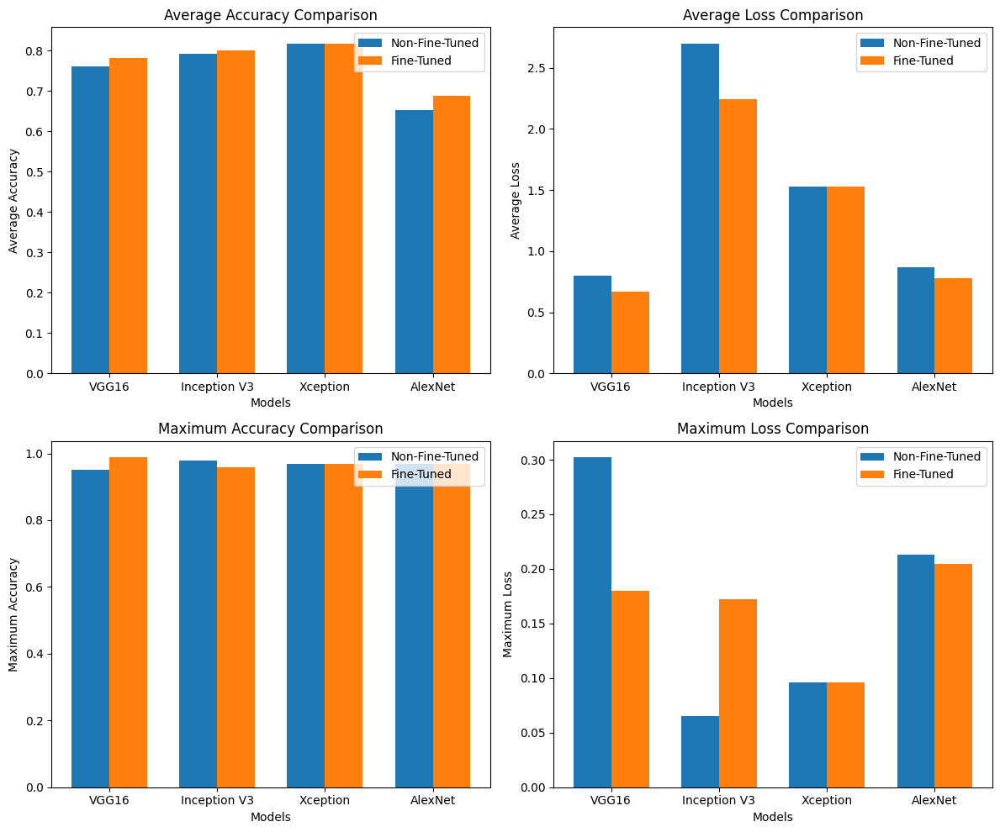

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Data for non-fine-tuned models
non_fine_tuned_models = ['VGG16', 'Inception V3', 'Xception', 'AlexNet']
non_fine_tuned_avg_acc = [0.761404, 0.791969, 0.817609, 0.65264]
non_fine_tuned_avg_loss = [0.798882, 2.6979, 1.530218, 0.8665455]
non_fine_tuned_max_acc = [0.951, 0.9783, 0.9694, 0.9688]
non_fine_tuned_max_loss = [0.302, 0.0654, 0.0957, 0.2132]

# Data for fine-tuned models
fine_tuned_avg_acc = [0.781953, 0.80061, 0.817609, 0.6874635]
fine_tuned_avg_loss = [0.670799, 2.243397, 1.530218, 0.7752815]
fine_tuned_max_acc = [0.9877, 0.9575, 0.9694, 0.9688]
fine_tuned_max_loss = [0.1798, 0.1722, 0.0957, 0.2044]

# Plotting bar graph for comparison
bar_width = 0.35
index = np.arange(len(non_fine_tuned_models))

fig, axs = plt.subplots(2, 2, figsize=(12, 10))

# Plot average accuracy
axs[0][0].bar(index, non_fine_tuned_avg_acc, bar_width, label='Non-Fine-Tuned')
axs[0][0].bar(index + bar_width, fine_tuned_avg_acc, bar_width, label='Fine-Tuned')
axs[0][0].set_xlabel('Models')
axs[0][0].set_ylabel('Average Accuracy')
axs[0][0].set_title('Average Accuracy Comparison')
axs[0][0].set_xticks(index + bar_width / 2)
axs[0][0].set_xticklabels(non_fine_tuned_models)
axs[0][0].legend()

# Plot average loss
axs[0][1].bar(index, non_fine_tuned_avg_loss, bar_width, label='Non-Fine-Tuned')
axs[0][1].bar(index + bar_width, fine_tuned_avg_loss, bar_width, label='Fine-Tuned')
axs[0][1].set_xlabel('Models')
axs[0][1].set_ylabel('Average Loss')
axs[0][1].set_title('Average Loss Comparison')
axs[0][1].set_xticks(index + bar_width / 2)
axs[0][1].set_xticklabels(non_fine_tuned_models)
axs[0][1].legend()

# Plot maximum accuracy
axs[1][0].bar(index, non_fine_tuned_max_acc, bar_width, label='Non-Fine-Tuned')
axs[1][0].bar(index + bar_width, fine_tuned_max_acc, bar_width, label='Fine-Tuned')
axs[1][0].set_xlabel('Models')
axs[1][0].set_ylabel('Maximum Accuracy')
axs[1][0].set_title('Maximum Accuracy Comparison')
axs[1][0].set_xticks(index + bar_width / 2)
axs[1][0].set_xticklabels(non_fine_tuned_models)
axs[1][0].legend()

# Plot maximum loss
axs[1][1].bar(index, non_fine_tuned_max_loss, bar_width, label='Non-Fine-Tuned')
axs[1][1].bar(index + bar_width, fine_tuned_max_loss, bar_width, label='Fine-Tuned')
axs[1][1].set_xlabel('Models')
axs[1][1].set_ylabel('Maximum Loss')
axs[1][1].set_title('Maximum Loss Comparison')
axs[1][1].set_xticks(index + bar_width / 2)
axs[1][1].set_xticklabels(non_fine_tuned_models)
axs[1][1].legend()

plt.tight_layout()
plt.show()


AlexNet

In [ ]:
# Import necessary libraries
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
import pandas as pd
import os
import random

# Define the base directory where all the categories are stored
base_path = '/content/drive/MyDrive/Images for Azure/Train/'

# Define the categories and their corresponding directories
categories = {
    'No Disease (0)': '0',
    'Resistant (R)': 'R',
    'Moderately Resistant (MR)': 'MR',
    'Moderately Resistant—Moderately Susceptible (MRMS)': 'MRMS',
    'Moderately Susceptible (MS)': 'MS',
    'Susceptible (S)': 'S'
}

# Initialize lists to hold image paths and labels
image_paths = []
labels = []

# Collect random 25 images per category
for category_name, directory_name in categories.items():
    category_path = os.path.join(base_path, directory_name)
    if os.path.exists(category_path):
        image_files = os.listdir(category_path)
        if len(image_files) >= 25:
            selected_images = random.sample(image_files, 25)  # Select random 25 images
        else:
            selected_images = image_files  # If less than 25 images, take all images

        for image_name in selected_images:
            image_paths.append(os.path.join(category_path, image_name))
            labels.append(category_name)
    else:
        print(f"Directory {category_path} does not exist.")

# Create a DataFrame from the collected data
df = pd.DataFrame({
    'Image Path': image_paths,
    'Label': labels
})

# Split the data into training and testing sets
train_df, test_df = train_test_split(df, test_size=0.2, stratify=df['Label'], random_state=42)

# Save the split data (optional)
train_df.to_csv('/content/drive/MyDrive/Images for Azure/train_split.csv', index=False)
test_df.to_csv('/content/drive/MyDrive/Images for Azure/test_split.csv', index=False)

# Image augmentation for training and testing
datagen_train = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

datagen_test = ImageDataGenerator(rescale=1./255)

# Load training and testing data
train_generator = datagen_train.flow_from_dataframe(
    dataframe=train_df,
    x_col='Image Path',
    y_col='Label',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

test_generator = datagen_test.flow_from_dataframe(
    dataframe=test_df,
    x_col='Image Path',
    y_col='Label',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

# Define the AlexNet model
def create_alexnet(input_shape, num_classes):
    model = models.Sequential()

    # 1st Convolutional Layer
    model.add(layers.Conv2D(filters=96, input_shape=input_shape, kernel_size=(11, 11), strides=(4, 4), padding='valid', activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding='valid'))

    # 2nd Convolutional Layer
    model.add(layers.Conv2D(filters=256, kernel_size=(5, 5), strides=(1, 1), padding='same', activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding='valid'))

    # 3rd, 4th, 5th Convolutional Layers
    model.add(layers.Conv2D(filters=384, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'))
    model.add(layers.Conv2D(filters=384, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'))
    model.add(layers.Conv2D(filters=256, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'))
    model.add(layers.MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding='valid'))

    # Flatten the layers
    model.add(layers.Flatten())

    # 1st Fully Connected Layer
    model.add(layers.Dense(4096, activation='relu'))
    model.add(layers.Dropout(0.5))

    # 2nd Fully Connected Layer
    model.add(layers.Dense(4096, activation='relu'))
    model.add(layers.Dropout(0.5))

    # Output Layer
    model.add(layers.Dense(num_classes, activation='softmax'))

    return model

# Input shape and number of categories
input_shape = (224, 224, 3)
num_classes = len(categories)

# Create the AlexNet model
alexnet_model = create_alexnet(input_shape, num_classes)

# Compile the model
alexnet_model.compile(optimizer=Adam(learning_rate=1e-4), loss='categorical_crossentropy', metrics=['accuracy'])

# Summary of the model
alexnet_model.summary()

# Train the AlexNet model
history = alexnet_model.fit(
    train_generator,
    validation_data=test_generator,
    epochs=200,  # Adjust the number of epochs as needed
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_steps=test_generator.samples // test_generator.batch_size
)

# Save the model (optional)
alexnet_model.save('/content/drive/MyDrive/Models/alexnet_model.h5')


Found 120 validated image filenames belonging to 6 classes.
Found 30 validated image filenames belonging to 6 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 54, 54, 96)          │          34,944 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 54, 54, 96)          │             384 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 26, 26, 96)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 26, 26, 256)         │         614,656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 26, 26, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 12, 12, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 12, 12, 384)         │         885,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 12, 12, 384)         │       1,327,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 12, 12, 256)         │         884,992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 5, 5, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 6400)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 4096)                │      26,218,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 4096)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 4096)                │      16,781,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 4096)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 6)                   │          24,582 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 46,772,998 (178.42 MB)

 Trainable params: 46,772,294 (178.42 MB)

 Non-trainable params: 704 (2.75 KB)

Epoch 1/200


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 64s 14s/step - accuracy: 0.0940 - loss: 2.6698 - val_accuracy: 0.1667 - val_loss: 1.7892
Epoch 2/200
1/3 ━━━━━━━━━━━━━━━━━━━━ 13s 7s/step - accuracy: 0.0938 - loss: 2.0522

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 686ms/step - accuracy: 0.0938 - loss: 2.0522 - val_accuracy: 0.2000 - val_loss: 1.7900
Epoch 3/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 22s 7s/step - accuracy: 0.2526 - loss: 2.0197 - val_accuracy: 0.2000 - val_loss: 1.7884
Epoch 4/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.2083 - loss: 1.8517 - val_accuracy: 0.1667 - val_loss: 1.7875
Epoch 5/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 8s/step - accuracy: 0.2764 - loss: 1.7757 - val_accuracy: 0.2000 - val_loss: 1.7861
Epoch 6/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.2812 - loss: 1.6220 - val_accuracy: 0.2667 - val_loss: 1.7859
Epoch 7/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 6s/step - accuracy: 0.2571 - loss: 1.7264 - val_accuracy: 0.2333 - val_loss: 1.7830
Epoch 8/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 645ms/step - accuracy: 0.2812 - loss: 1.6837 - val_accuracy: 0.3667 - val_loss: 1.7809
Epoch 9/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 22s 6s/step - accuracy: 0.3894 - loss: 1.4544 - val_accuracy: 0.3333 - val_loss: 1.7744
Epoch 10/2

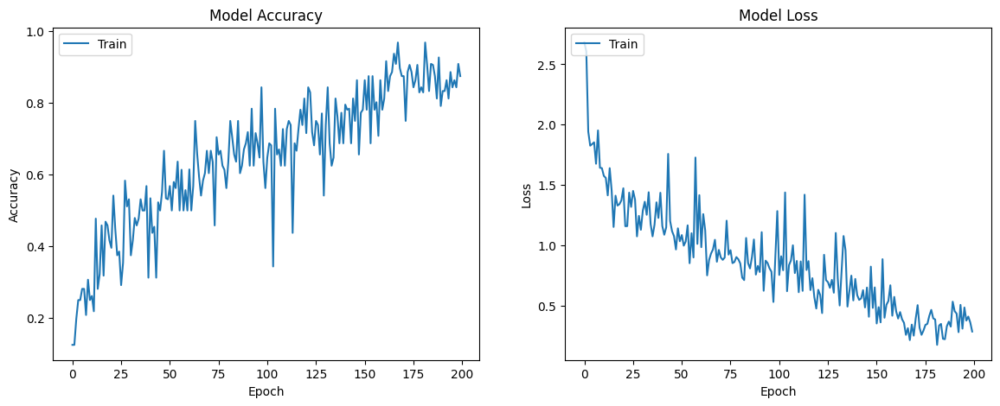

In [ ]:
# Plot training & validation accuracy values
import matplotlib.pyplot as plt
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])

plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])

plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train'], loc='upper left')

plt.show()


In [ ]:
import re

# The input string containing the epoch data
input_str = """Epoch 1/200
/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
3/3 ━━━━━━━━━━━━━━━━━━━━ 54s 12s/step - accuracy: 0.1172 - loss: 2.5980 - val_accuracy: 0.1667 - val_loss: 1.7908
Epoch 2/200
1/3 ━━━━━━━━━━━━━━━━━━━━ 8s 4s/step - accuracy: 0.1250 - loss: 2.6078/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 580ms/step - accuracy: 0.1250 - loss: 2.6078 - val_accuracy: 0.1667 - val_loss: 1.7906
Epoch 3/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 44s 6s/step - accuracy: 0.2044 - loss: 1.9449 - val_accuracy: 0.2667 - val_loss: 1.7896
Epoch 4/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 878ms/step - accuracy: 0.2500 - loss: 1.8254 - val_accuracy: 0.1333 - val_loss: 1.7886
Epoch 5/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 35s 6s/step - accuracy: 0.2545 - loss: 1.8382 - val_accuracy: 0.1667 - val_loss: 1.7860
Epoch 6/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 640ms/step - accuracy: 0.2812 - loss: 1.8533 - val_accuracy: 0.1667 - val_loss: 1.7862
Epoch 7/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 6s/step - accuracy: 0.3086 - loss: 1.6929 - val_accuracy: 0.2333 - val_loss: 1.7870
Epoch 8/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 556ms/step - accuracy: 0.2083 - loss: 1.9519 - val_accuracy: 0.2333 - val_loss: 1.7872
Epoch 9/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 5s/step - accuracy: 0.3058 - loss: 1.6422 - val_accuracy: 0.2000 - val_loss: 1.7841
Epoch 10/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 868ms/step - accuracy: 0.2500 - loss: 1.6391 - val_accuracy: 0.1667 - val_loss: 1.7830
Epoch 11/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 6s/step - accuracy: 0.3081 - loss: 1.5656 - val_accuracy: 0.1667 - val_loss: 1.7845
Epoch 12/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 551ms/step - accuracy: 0.2188 - loss: 1.5581 - val_accuracy: 0.1667 - val_loss: 1.7863
Epoch 13/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 36s 5s/step - accuracy: 0.5043 - loss: 1.3841 - val_accuracy: 0.1667 - val_loss: 1.7869
Epoch 14/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 542ms/step - accuracy: 0.2812 - loss: 1.6390 - val_accuracy: 0.1667 - val_loss: 1.7872
Epoch 15/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 5s/step - accuracy: 0.3880 - loss: 1.3848 - val_accuracy: 0.2333 - val_loss: 1.7906
Epoch 16/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.4583 - loss: 1.1512 - val_accuracy: 0.2667 - val_loss: 1.7901
Epoch 17/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 33s 5s/step - accuracy: 0.3298 - loss: 1.4155 - val_accuracy: 0.2000 - val_loss: 1.7895
Epoch 18/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 780ms/step - accuracy: 0.4688 - loss: 1.3287 - val_accuracy: 0.2333 - val_loss: 1.7903
Epoch 19/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 6s/step - accuracy: 0.4167 - loss: 1.3887 - val_accuracy: 0.2000 - val_loss: 1.7969
Epoch 20/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 561ms/step - accuracy: 0.4167 - loss: 1.3718 - val_accuracy: 0.1667 - val_loss: 1.7981
Epoch 21/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 35s 5s/step - accuracy: 0.3737 - loss: 1.4929 - val_accuracy: 0.1667 - val_loss: 1.7934
Epoch 22/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 541ms/step - accuracy: 0.5417 - loss: 1.1576 - val_accuracy: 0.1667 - val_loss: 1.7936
Epoch 23/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 6s/step - accuracy: 0.4388 - loss: 1.1450 - val_accuracy: 0.1667 - val_loss: 1.7931
Epoch 24/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 555ms/step - accuracy: 0.3750 - loss: 1.4360 - val_accuracy: 0.1667 - val_loss: 1.8004
Epoch 25/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 5s/step - accuracy: 0.3958 - loss: 1.3131 - val_accuracy: 0.1667 - val_loss: 1.8010
Epoch 26/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 555ms/step - accuracy: 0.2917 - loss: 1.4503 - val_accuracy: 0.1667 - val_loss: 1.7975
Epoch 27/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 35s 5s/step - accuracy: 0.3177 - loss: 1.4528 - val_accuracy: 0.1667 - val_loss: 1.7921
Epoch 28/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.5833 - loss: 1.0733 - val_accuracy: 0.1667 - val_loss: 1.7927
Epoch 29/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 33s 6s/step - accuracy: 0.4655 - loss: 1.2833 - val_accuracy: 0.1667 - val_loss: 1.8179
Epoch 30/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.5312 - loss: 1.1279 - val_accuracy: 0.1667 - val_loss: 1.8252
Epoch 31/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 35s 6s/step - accuracy: 0.3945 - loss: 1.2556 - val_accuracy: 0.1667 - val_loss: 1.8188
Epoch 32/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 756ms/step - accuracy: 0.4167 - loss: 1.3607 - val_accuracy: 0.1667 - val_loss: 1.8288
Epoch 33/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 36s 6s/step - accuracy: 0.4583 - loss: 1.2522 - val_accuracy: 0.1667 - val_loss: 1.8653
Epoch 34/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 618ms/step - accuracy: 0.4583 - loss: 1.4392 - val_accuracy: 0.1667 - val_loss: 1.8700
Epoch 35/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 5s/step - accuracy: 0.4886 - loss: 1.1726 - val_accuracy: 0.1667 - val_loss: 1.8344
Epoch 36/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 554ms/step - accuracy: 0.5312 - loss: 1.0735 - val_accuracy: 0.1667 - val_loss: 1.8338
Epoch 37/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 5s/step - accuracy: 0.5352 - loss: 1.1067 - val_accuracy: 0.1667 - val_loss: 1.8350
Epoch 38/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 551ms/step - accuracy: 0.5000 - loss: 1.3555 - val_accuracy: 0.1667 - val_loss: 1.8626
Epoch 39/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 36s 5s/step - accuracy: 0.5575 - loss: 1.2382 - val_accuracy: 0.1667 - val_loss: 1.9428
Epoch 40/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 544ms/step - accuracy: 0.3125 - loss: 1.4350 - val_accuracy: 0.1667 - val_loss: 1.9506
Epoch 41/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 5s/step - accuracy: 0.5427 - loss: 1.1388 - val_accuracy: 0.1667 - val_loss: 1.9922
Epoch 42/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 563ms/step - accuracy: 0.4375 - loss: 1.0866 - val_accuracy: 0.1667 - val_loss: 2.0055
Epoch 43/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 34s 5s/step - accuracy: 0.4490 - loss: 1.1755 - val_accuracy: 0.1667 - val_loss: 2.1933
Epoch 44/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 661ms/step - accuracy: 0.3125 - loss: 1.7571 - val_accuracy: 0.1667 - val_loss: 2.1408
Epoch 45/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 34s 6s/step - accuracy: 0.5322 - loss: 1.1977 - val_accuracy: 0.1667 - val_loss: 1.9839
Epoch 46/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.5000 - loss: 1.1163 - val_accuracy: 0.1667 - val_loss: 2.0061
Epoch 47/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 35s 6s/step - accuracy: 0.5378 - loss: 1.0974 - val_accuracy: 0.1667 - val_loss: 2.3100
Epoch 48/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 849ms/step - accuracy: 0.6667 - loss: 0.9648 - val_accuracy: 0.1667 - val_loss: 2.4815
Epoch 49/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 5s/step - accuracy: 0.5170 - loss: 1.1456 - val_accuracy: 0.1667 - val_loss: 2.4767
Epoch 50/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 563ms/step - accuracy: 0.5312 - loss: 1.0326 - val_accuracy: 0.1667 - val_loss: 2.4140
Epoch 51/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 36s 5s/step - accuracy: 0.5810 - loss: 1.0600 - val_accuracy: 0.1667 - val_loss: 2.4164
Epoch 52/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 543ms/step - accuracy: 0.5000 - loss: 0.9963 - val_accuracy: 0.1667 - val_loss: 2.4340
Epoch 53/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 6s/step - accuracy: 0.5725 - loss: 1.0203 - val_accuracy: 0.1667 - val_loss: 2.7545
Epoch 54/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 845ms/step - accuracy: 0.5625 - loss: 1.1648 - val_accuracy: 0.1667 - val_loss: 2.8418
Epoch 55/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 6s/step - accuracy: 0.6619 - loss: 0.8413 - val_accuracy: 0.1667 - val_loss: 3.1243
Epoch 56/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 563ms/step - accuracy: 0.5000 - loss: 1.0992 - val_accuracy: 0.1667 - val_loss: 3.2812
Epoch 57/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 5s/step - accuracy: 0.6193 - loss: 0.8164 - val_accuracy: 0.1667 - val_loss: 3.5831
Epoch 58/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.5000 - loss: 1.7270 - val_accuracy: 0.1667 - val_loss: 3.8845
Epoch 59/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 34s 5s/step - accuracy: 0.5574 - loss: 0.9911 - val_accuracy: 0.1667 - val_loss: 3.9346
Epoch 60/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 903ms/step - accuracy: 0.5000 - loss: 1.4149 - val_accuracy: 0.1667 - val_loss: 3.7598
Epoch 61/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 36s 6s/step - accuracy: 0.5768 - loss: 1.0429 - val_accuracy: 0.1667 - val_loss: 3.1071
Epoch 62/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 640ms/step - accuracy: 0.5000 - loss: 1.2578 - val_accuracy: 0.1667 - val_loss: 3.0278
Epoch 63/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 36s 5s/step - accuracy: 0.5653 - loss: 1.1181 - val_accuracy: 0.1667 - val_loss: 3.0213
Epoch 64/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 555ms/step - accuracy: 0.7500 - loss: 0.7500 - val_accuracy: 0.1667 - val_loss: 3.0648
Epoch 65/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 5s/step - accuracy: 0.6460 - loss: 0.8674 - val_accuracy: 0.1667 - val_loss: 3.3945
Epoch 66/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 566ms/step - accuracy: 0.5938 - loss: 0.9310 - val_accuracy: 0.1667 - val_loss: 3.6037
Epoch 67/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 6s/step - accuracy: 0.5326 - loss: 0.9567 - val_accuracy: 0.1667 - val_loss: 3.3638
Epoch 68/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 541ms/step - accuracy: 0.5833 - loss: 1.0447 - val_accuracy: 0.1667 - val_loss: 3.2573
Epoch 69/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 36s 6s/step - accuracy: 0.5911 - loss: 0.8718 - val_accuracy: 0.1667 - val_loss: 3.3143
Epoch 70/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 552ms/step - accuracy: 0.6667 - loss: 0.9611 - val_accuracy: 0.1667 - val_loss: 3.3925
Epoch 71/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 37s 6s/step - accuracy: 0.6068 - loss: 0.8951 - val_accuracy: 0.1667 - val_loss: 4.1130
Epoch 72/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 557ms/step - accuracy: 0.6667 - loss: 0.8785 - val_accuracy: 0.1667 - val_loss: 4.6178
Epoch 73/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 37s 6s/step - accuracy: 0.6302 - loss: 0.8917 - val_accuracy: 0.1667 - val_loss: 5.7884
Epoch 74/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 551ms/step - accuracy: 0.4583 - loss: 1.2032 - val_accuracy: 0.1667 - val_loss: 5.8857
Epoch 75/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 5s/step - accuracy: 0.6960 - loss: 0.9174 - val_accuracy: 0.1667 - val_loss: 5.5903
Epoch 76/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 559ms/step - accuracy: 0.6562 - loss: 0.9588 - val_accuracy: 0.1667 - val_loss: 5.6348
Epoch 77/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 6s/step - accuracy: 0.6458 - loss: 0.8928 - val_accuracy: 0.1667 - val_loss: 5.6736
Epoch 78/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 545ms/step - accuracy: 0.6250 - loss: 0.8609 - val_accuracy: 0.1667 - val_loss: 5.6765
Epoch 79/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 5s/step - accuracy: 0.5713 - loss: 0.9545 - val_accuracy: 0.1667 - val_loss: 4.3111
Epoch 80/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 557ms/step - accuracy: 0.5625 - loss: 0.8836 - val_accuracy: 0.1667 - val_loss: 3.7409
Epoch 81/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 33s 4s/step - accuracy: 0.6307 - loss: 0.8545 - val_accuracy: 0.1667 - val_loss: 3.8333
Epoch 82/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 542ms/step - accuracy: 0.7500 - loss: 0.7310 - val_accuracy: 0.1667 - val_loss: 4.1684
Epoch 83/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 5s/step - accuracy: 0.7234 - loss: 0.6894 - val_accuracy: 0.1667 - val_loss: 4.8568
Epoch 84/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 549ms/step - accuracy: 0.6562 - loss: 1.0599 - val_accuracy: 0.1667 - val_loss: 4.5597
Epoch 85/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 36s 5s/step - accuracy: 0.6385 - loss: 0.8875 - val_accuracy: 0.1667 - val_loss: 3.8273
Epoch 86/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 552ms/step - accuracy: 0.7500 - loss: 0.8075 - val_accuracy: 0.1667 - val_loss: 3.6999
Epoch 87/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 5s/step - accuracy: 0.5951 - loss: 0.9270 - val_accuracy: 0.1667 - val_loss: 3.7111
Epoch 88/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 686ms/step - accuracy: 0.6250 - loss: 1.0473 - val_accuracy: 0.1667 - val_loss: 3.6194
Epoch 89/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 34s 6s/step - accuracy: 0.6834 - loss: 0.7228 - val_accuracy: 0.1667 - val_loss: 4.0287
Epoch 90/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.6875 - loss: 0.8282 - val_accuracy: 0.1667 - val_loss: 4.1154
Epoch 91/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 6s/step - accuracy: 0.7148 - loss: 0.7729 - val_accuracy: 0.1667 - val_loss: 4.3947
Epoch 92/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 559ms/step - accuracy: 0.6250 - loss: 1.1081 - val_accuracy: 0.1667 - val_loss: 4.5739
Epoch 93/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 5s/step - accuracy: 0.7804 - loss: 0.6253 - val_accuracy: 0.1667 - val_loss: 5.2532
Epoch 94/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.6250 - loss: 0.8721 - val_accuracy: 0.1667 - val_loss: 5.1279
Epoch 95/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 5s/step - accuracy: 0.7212 - loss: 0.8728 - val_accuracy: 0.1667 - val_loss: 4.9032
Epoch 96/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 554ms/step - accuracy: 0.6875 - loss: 0.8086 - val_accuracy: 0.1667 - val_loss: 5.0208
Epoch 97/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 4s/step - accuracy: 0.6793 - loss: 0.7214 - val_accuracy: 0.1667 - val_loss: 7.0734
Epoch 98/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 846ms/step - accuracy: 0.8438 - loss: 0.5293 - val_accuracy: 0.1667 - val_loss: 7.8260
Epoch 99/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 33s 6s/step - accuracy: 0.6560 - loss: 0.8025 - val_accuracy: 0.1667 - val_loss: 8.1747
Epoch 100/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 769ms/step - accuracy: 0.5625 - loss: 1.2829 - val_accuracy: 0.1667 - val_loss: 7.6836
Epoch 101/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 5s/step - accuracy: 0.6442 - loss: 0.7687 - val_accuracy: 0.1667 - val_loss: 5.8916
Epoch 102/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 556ms/step - accuracy: 0.6875 - loss: 0.9081 - val_accuracy: 0.1667 - val_loss: 5.8179
Epoch 103/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 6s/step - accuracy: 0.6579 - loss: 0.8972 - val_accuracy: 0.1667 - val_loss: 6.9631
Epoch 104/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 819ms/step - accuracy: 0.3438 - loss: 1.4372 - val_accuracy: 0.1667 - val_loss: 7.1605
Epoch 105/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 6s/step - accuracy: 0.7611 - loss: 0.6537 - val_accuracy: 0.1667 - val_loss: 5.6720
Epoch 106/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 549ms/step - accuracy: 0.6562 - loss: 0.8346 - val_accuracy: 0.1667 - val_loss: 5.4422
Epoch 107/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 5s/step - accuracy: 0.6790 - loss: 0.8320 - val_accuracy: 0.1667 - val_loss: 5.5859
Epoch 108/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.6250 - loss: 0.9993 - val_accuracy: 0.1667 - val_loss: 5.0052
Epoch 109/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 34s 5s/step - accuracy: 0.7347 - loss: 0.7503 - val_accuracy: 0.1667 - val_loss: 3.9554
Epoch 110/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 794ms/step - accuracy: 0.6250 - loss: 0.8695 - val_accuracy: 0.1667 - val_loss: 3.4722
Epoch 111/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 35s 5s/step - accuracy: 0.7877 - loss: 0.5717 - val_accuracy: 0.1667 - val_loss: 3.2435
Epoch 112/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 595ms/step - accuracy: 0.7500 - loss: 0.8654 - val_accuracy: 0.2000 - val_loss: 3.2700
Epoch 113/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 5s/step - accuracy: 0.7276 - loss: 0.6387 - val_accuracy: 0.2000 - val_loss: 3.3938
Epoch 114/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 548ms/step - accuracy: 0.4375 - loss: 1.4186 - val_accuracy: 0.2000 - val_loss: 3.2353
Epoch 115/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 6s/step - accuracy: 0.6875 - loss: 0.7739 - val_accuracy: 0.2000 - val_loss: 3.5754
Epoch 116/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 553ms/step - accuracy: 0.6667 - loss: 0.8680 - val_accuracy: 0.2000 - val_loss: 3.7386
Epoch 117/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 5s/step - accuracy: 0.7089 - loss: 0.6584 - val_accuracy: 0.1667 - val_loss: 4.2071
Epoch 118/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 560ms/step - accuracy: 0.7812 - loss: 0.7265 - val_accuracy: 0.1667 - val_loss: 4.2268
Epoch 119/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 5s/step - accuracy: 0.7560 - loss: 0.5544 - val_accuracy: 0.1667 - val_loss: 5.3983
Epoch 120/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 540ms/step - accuracy: 0.8125 - loss: 0.4751 - val_accuracy: 0.1667 - val_loss: 5.8114
Epoch 121/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 36s 5s/step - accuracy: 0.7564 - loss: 0.5814 - val_accuracy: 0.1667 - val_loss: 6.1953
Epoch 122/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 607ms/step - accuracy: 0.8438 - loss: 0.5873 - val_accuracy: 0.1667 - val_loss: 5.3432
Epoch 123/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 36s 5s/step - accuracy: 0.8478 - loss: 0.3782 - val_accuracy: 0.2333 - val_loss: 4.5554
Epoch 124/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 679ms/step - accuracy: 0.7188 - loss: 0.9205 - val_accuracy: 0.2333 - val_loss: 4.4644
Epoch 125/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 35s 5s/step - accuracy: 0.7193 - loss: 0.6535 - val_accuracy: 0.2000 - val_loss: 3.7259
Epoch 126/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 587ms/step - accuracy: 0.7500 - loss: 0.6935 - val_accuracy: 0.2000 - val_loss: 4.0836
Epoch 127/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 35s 6s/step - accuracy: 0.7845 - loss: 0.6221 - val_accuracy: 0.2000 - val_loss: 5.0402
Epoch 128/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 641ms/step - accuracy: 0.6562 - loss: 0.7129 - val_accuracy: 0.2000 - val_loss: 4.9827
Epoch 129/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 36s 6s/step - accuracy: 0.7643 - loss: 0.5991 - val_accuracy: 0.1667 - val_loss: 5.6109
Epoch 130/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 581ms/step - accuracy: 0.5417 - loss: 1.1016 - val_accuracy: 0.1667 - val_loss: 6.6004
Epoch 131/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 35s 5s/step - accuracy: 0.7934 - loss: 0.6316 - val_accuracy: 0.2000 - val_loss: 6.4091
Epoch 132/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 577ms/step - accuracy: 0.8438 - loss: 0.5002 - val_accuracy: 0.2000 - val_loss: 5.3559
Epoch 133/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 37s 6s/step - accuracy: 0.7227 - loss: 0.6694 - val_accuracy: 0.2000 - val_loss: 4.5391
Epoch 134/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 801ms/step - accuracy: 0.6250 - loss: 1.0761 - val_accuracy: 0.2000 - val_loss: 4.9261
Epoch 135/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 35s 5s/step - accuracy: 0.6442 - loss: 0.9923 - val_accuracy: 0.2000 - val_loss: 5.1549
Epoch 136/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.8125 - loss: 0.4911 - val_accuracy: 0.2000 - val_loss: 5.3218
Epoch 137/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 34s 5s/step - accuracy: 0.7596 - loss: 0.6484 - val_accuracy: 0.2000 - val_loss: 5.0313
Epoch 138/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 575ms/step - accuracy: 0.6875 - loss: 0.7475 - val_accuracy: 0.2000 - val_loss: 4.6690
Epoch 139/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 36s 6s/step - accuracy: 0.8149 - loss: 0.4941 - val_accuracy: 0.2000 - val_loss: 4.0338
Epoch 140/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 537ms/step - accuracy: 0.6875 - loss: 0.7202 - val_accuracy: 0.2000 - val_loss: 3.8560
Epoch 141/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 5s/step - accuracy: 0.8157 - loss: 0.5441 - val_accuracy: 0.2333 - val_loss: 3.9755
Epoch 142/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 538ms/step - accuracy: 0.7812 - loss: 0.5463 - val_accuracy: 0.2333 - val_loss: 4.2932
Epoch 143/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 5s/step - accuracy: 0.8256 - loss: 0.4988 - val_accuracy: 0.2000 - val_loss: 4.9376
Epoch 144/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.6875 - loss: 0.6272 - val_accuracy: 0.2000 - val_loss: 4.9956
Epoch 145/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 6s/step - accuracy: 0.8203 - loss: 0.4658 - val_accuracy: 0.2000 - val_loss: 4.5359
Epoch 146/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 543ms/step - accuracy: 0.7500 - loss: 0.6488 - val_accuracy: 0.2000 - val_loss: 4.6236
Epoch 147/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 36s 5s/step - accuracy: 0.8928 - loss: 0.3587 - val_accuracy: 0.1667 - val_loss: 5.8582
Epoch 148/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 553ms/step - accuracy: 0.6562 - loss: 0.8224 - val_accuracy: 0.1667 - val_loss: 6.2087
Epoch 149/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 5s/step - accuracy: 0.7848 - loss: 0.4645 - val_accuracy: 0.1667 - val_loss: 7.1166
Epoch 150/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.7812 - loss: 0.6500 - val_accuracy: 0.1667 - val_loss: 7.2123
Epoch 151/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 6s/step - accuracy: 0.8693 - loss: 0.3565 - val_accuracy: 0.1667 - val_loss: 8.2195
Epoch 152/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 556ms/step - accuracy: 0.7812 - loss: 0.4861 - val_accuracy: 0.1667 - val_loss: 7.7759
Epoch 153/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 5s/step - accuracy: 0.8810 - loss: 0.3377 - val_accuracy: 0.2667 - val_loss: 4.7264
Epoch 154/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 892ms/step - accuracy: 0.6875 - loss: 0.8841 - val_accuracy: 0.2667 - val_loss: 4.7191
Epoch 155/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 34s 5s/step - accuracy: 0.8717 - loss: 0.4112 - val_accuracy: 0.2333 - val_loss: 5.4216
Epoch 156/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.7812 - loss: 0.5065 - val_accuracy: 0.2333 - val_loss: 5.4315
Epoch 157/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 35s 6s/step - accuracy: 0.8112 - loss: 0.5293 - val_accuracy: 0.2667 - val_loss: 4.3616
Epoch 158/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 700ms/step - accuracy: 0.7083 - loss: 0.6678 - val_accuracy: 0.2667 - val_loss: 4.1829
Epoch 159/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 35s 5s/step - accuracy: 0.8693 - loss: 0.3922 - val_accuracy: 0.3000 - val_loss: 5.4623
Epoch 160/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 641ms/step - accuracy: 0.7812 - loss: 0.5712 - val_accuracy: 0.3000 - val_loss: 6.7549
Epoch 161/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 19s 6s/step - accuracy: 0.8281 - loss: 0.4043 - val_accuracy: 0.2000 - val_loss: 8.1045
Epoch 162/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 568ms/step - accuracy: 0.9167 - loss: 0.3919 - val_accuracy: 0.2333 - val_loss: 7.5231
Epoch 163/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 6s/step - accuracy: 0.8854 - loss: 0.3435 - val_accuracy: 0.2667 - val_loss: 5.3145
Epoch 164/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 873ms/step - accuracy: 0.8750 - loss: 0.3863 - val_accuracy: 0.3000 - val_loss: 4.3343
Epoch 165/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 35s 6s/step - accuracy: 0.9045 - loss: 0.3404 - val_accuracy: 0.3667 - val_loss: 2.7253
Epoch 166/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 723ms/step - accuracy: 0.9375 - loss: 0.2565 - val_accuracy: 0.4000 - val_loss: 2.4074
Epoch 167/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 35s 5s/step - accuracy: 0.9211 - loss: 0.2817 - val_accuracy: 0.4000 - val_loss: 2.4068
Epoch 168/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 794ms/step - accuracy: 0.9688 - loss: 0.2132 - val_accuracy: 0.3333 - val_loss: 2.5093
Epoch 169/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 35s 5s/step - accuracy: 0.8825 - loss: 0.3569 - val_accuracy: 0.4333 - val_loss: 2.7978
Epoch 170/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 558ms/step - accuracy: 0.8750 - loss: 0.2501 - val_accuracy: 0.4333 - val_loss: 3.0982
Epoch 171/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 36s 5s/step - accuracy: 0.8555 - loss: 0.4202 - val_accuracy: 0.3333 - val_loss: 4.2646
Epoch 172/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 550ms/step - accuracy: 0.7500 - loss: 0.5030 - val_accuracy: 0.3333 - val_loss: 3.7736
Epoch 173/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 5s/step - accuracy: 0.8768 - loss: 0.3524 - val_accuracy: 0.2333 - val_loss: 3.2861
Epoch 174/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 555ms/step - accuracy: 0.9062 - loss: 0.2567 - val_accuracy: 0.2000 - val_loss: 3.5595
Epoch 175/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 5s/step - accuracy: 0.8974 - loss: 0.2840 - val_accuracy: 0.1667 - val_loss: 5.1418
Epoch 176/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 540ms/step - accuracy: 0.8438 - loss: 0.3394 - val_accuracy: 0.2000 - val_loss: 5.1918
Epoch 177/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 5s/step - accuracy: 0.8939 - loss: 0.3110 - val_accuracy: 0.4000 - val_loss: 3.4568
Epoch 178/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 576ms/step - accuracy: 0.9062 - loss: 0.4148 - val_accuracy: 0.4333 - val_loss: 3.6257
Epoch 179/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 33s 4s/step - accuracy: 0.8154 - loss: 0.4725 - val_accuracy: 0.2000 - val_loss: 5.7594
Epoch 180/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 676ms/step - accuracy: 0.8438 - loss: 0.3935 - val_accuracy: 0.2000 - val_loss: 6.6465
Epoch 181/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 34s 5s/step - accuracy: 0.8277 - loss: 0.3838 - val_accuracy: 0.2000 - val_loss: 9.1267
Epoch 182/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 824ms/step - accuracy: 0.9688 - loss: 0.1736 - val_accuracy: 0.2000 - val_loss: 8.6768
Epoch 183/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 36s 6s/step - accuracy: 0.9102 - loss: 0.3064 - val_accuracy: 0.2667 - val_loss: 5.6321
Epoch 184/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - accuracy: 0.8333 - loss: 0.3476 - val_accuracy: 0.2667 - val_loss: 5.8795
Epoch 185/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 34s 6s/step - accuracy: 0.8816 - loss: 0.2446 - val_accuracy: 0.2000 - val_loss: 5.7247
Epoch 186/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.9062 - loss: 0.2204 - val_accuracy: 0.2000 - val_loss: 5.6488
Epoch 187/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 34s 6s/step - accuracy: 0.8943 - loss: 0.2585 - val_accuracy: 0.2000 - val_loss: 4.6167
Epoch 188/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.8125 - loss: 0.3664 - val_accuracy: 0.2333 - val_loss: 4.3699
Epoch 189/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 35s 6s/step - accuracy: 0.9206 - loss: 0.3170 - val_accuracy: 0.3000 - val_loss: 4.4873
Epoch 190/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 568ms/step - accuracy: 0.7917 - loss: 0.5315 - val_accuracy: 0.3000 - val_loss: 4.2351
Epoch 191/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 5s/step - accuracy: 0.8581 - loss: 0.4244 - val_accuracy: 0.3000 - val_loss: 7.1959
Epoch 192/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 553ms/step - accuracy: 0.8333 - loss: 0.4330 - val_accuracy: 0.2667 - val_loss: 7.7092
Epoch 193/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 5s/step - accuracy: 0.8693 - loss: 0.2810 - val_accuracy: 0.3000 - val_loss: 6.8309
Epoch 194/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 566ms/step - accuracy: 0.8125 - loss: 0.5053 - val_accuracy: 0.2667 - val_loss: 5.8850
Epoch 195/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 35s 5s/step - accuracy: 0.9080 - loss: 0.2590 - val_accuracy: 0.2667 - val_loss: 3.9701
Epoch 196/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 544ms/step - accuracy: 0.8438 - loss: 0.4835 - val_accuracy: 0.3000 - val_loss: 4.0082
Epoch 197/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 35s 5s/step - accuracy: 0.8967 - loss: 0.3458 - val_accuracy: 0.3667 - val_loss: 4.3649
Epoch 198/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 546ms/step - accuracy: 0.8438 - loss: 0.4081 - val_accuracy: 0.3333 - val_loss: 4.6621
Epoch 199/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 4s/step - accuracy: 0.9121 - loss: 0.3359 - val_accuracy: 0.3000 - val_loss: 4.8716
Epoch 200/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 549ms/step - accuracy: 0.8750 - loss: 0.2842 - val_accuracy: 0.2667 - val_loss: 4.8647"""

# Regular expression pattern to match epoch, accuracy, and loss
pattern = r"Epoch (\d+)/200.*?accuracy: ([\d\.]+) - loss: ([\d\.]+)"

# Dictionary to store the results
results = {}

# Find all matches in the input string
matches = re.findall(pattern, input_str, re.DOTALL)

# Process each match and add to the results dictionary
for match in matches:
    epoch = int(match[0])
    accuracy = float(match[1])
    loss = float(match[2])
    results[epoch] = {'accuracy': accuracy, 'loss': loss}

# Print the resulting dictionary
print(results)

{1: {'accuracy': 0.1172, 'loss': 2.598}, 2: {'accuracy': 0.125, 'loss': 2.6078}, 3: {'accuracy': 0.2044, 'loss': 1.9449}, 4: {'accuracy': 0.25, 'loss': 1.8254}, 5: {'accuracy': 0.2545, 'loss': 1.8382}, 6: {'accuracy': 0.2812, 'loss': 1.8533}, 7: {'accuracy': 0.3086, 'loss': 1.6929}, 8: {'accuracy': 0.2083, 'loss': 1.9519}, 9: {'accuracy': 0.3058, 'loss': 1.6422}, 10: {'accuracy': 0.25, 'loss': 1.6391}, 11: {'accuracy': 0.3081, 'loss': 1.5656}, 12: {'accuracy': 0.2188, 'loss': 1.5581}, 13: {'accuracy': 0.5043, 'loss': 1.3841}, 14: {'accuracy': 0.2812, 'loss': 1.639}, 15: {'accuracy': 0.388, 'loss': 1.3848}, 16: {'accuracy': 0.4583, 'loss': 1.1512}, 17: {'accuracy': 0.3298, 'loss': 1.4155}, 18: {'accuracy': 0.4688, 'loss': 1.3287}, 19: {'accuracy': 0.4167, 'loss': 1.3887}, 20: {'accuracy': 0.4167, 'loss': 1.3718}, 21: {'accuracy': 0.3737, 'loss': 1.4929}, 22: {'accuracy': 0.5417, 'loss': 1.1576}, 23: {'accuracy': 0.4388, 'loss': 1.145}, 24: {'accuracy': 0.375, 'loss': 1.436}, 25: {'accur

Fine Tuning

In [ ]:
# Import necessary libraries
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from sklearn.model_selection import train_test_split
import pandas as pd
import os
import random

# Define the base directory where all the categories are stored
base_path = '/content/drive/MyDrive/Images for Azure/Train/'

# Define the categories and their corresponding directories
categories = {
    'No Disease (0)': '0',
    'Resistant (R)': 'R',
    'Moderately Resistant (MR)': 'MR',
    'Moderately Resistant—Moderately Susceptible (MRMS)': 'MRMS',
    'Moderately Susceptible (MS)': 'MS',
    'Susceptible (S)': 'S'
}

# Initialize lists to hold image paths and labels
image_paths = []
labels = []

# Collect random 25 images per category
for category_name, directory_name in categories.items():
    category_path = os.path.join(base_path, directory_name)
    if os.path.exists(category_path):
        image_files = os.listdir(category_path)
        if len(image_files) >= 25:
            selected_images = random.sample(image_files, 25)  # Select random 25 images
        else:
            selected_images = image_files  # If less than 25 images, take all images

        for image_name in selected_images:
            image_paths.append(os.path.join(category_path, image_name))
            labels.append(category_name)
    else:
        print(f"Directory {category_path} does not exist.")

# Create a DataFrame from the collected data
df = pd.DataFrame({
    'Image Path': image_paths,
    'Label': labels
})

# Split the data into training and testing sets
train_df, test_df = train_test_split(df, test_size=0.2, stratify=df['Label'], random_state=42)

# Save the split data (optional)
train_df.to_csv('/content/drive/MyDrive/Images for Azure/train_split.csv', index=False)
test_df.to_csv('/content/drive/MyDrive/Images for Azure/test_split.csv', index=False)

# Image augmentation for training and testing
datagen_train = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,
    width_shift_range=0.3,
    height_shift_range=0.3,
    shear_range=0.3,
    zoom_range=0.3,
    horizontal_flip=True,
    brightness_range=[0.8, 1.2],  # Brightness augmentation
    fill_mode='nearest'
)

datagen_test = ImageDataGenerator(rescale=1./255)

# Load training and testing data
train_generator = datagen_train.flow_from_dataframe(
    dataframe=train_df,
    x_col='Image Path',
    y_col='Label',
    target_size=(224, 224),
    batch_size=16,  # Reduced batch size for better generalization
    class_mode='categorical'
)

test_generator = datagen_test.flow_from_dataframe(
    dataframe=test_df,
    x_col='Image Path',
    y_col='Label',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical'
)

# Define the AlexNet model with fine-tuning
def create_alexnet(input_shape, num_classes):
    model = models.Sequential()

    # 1st Convolutional Layer
    model.add(layers.Conv2D(filters=96, input_shape=input_shape, kernel_size=(11, 11), strides=(4, 4), padding='valid', activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding='valid'))

    # 2nd Convolutional Layer
    model.add(layers.Conv2D(filters=256, kernel_size=(5, 5), strides=(1, 1), padding='same', activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding='valid'))

    # 3rd, 4th, 5th Convolutional Layers
    model.add(layers.Conv2D(filters=384, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'))
    model.add(layers.Conv2D(filters=384, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'))
    model.add(layers.Conv2D(filters=256, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'))
    model.add(layers.MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding='valid'))

    # Flatten the layers
    model.add(layers.Flatten())

    # 1st Fully Connected Layer
    model.add(layers.Dense(4096, activation='relu'))
    model.add(layers.Dropout(0.4))  # Reduced dropout

    # 2nd Fully Connected Layer
    model.add(layers.Dense(4096, activation='relu'))
    model.add(layers.Dropout(0.4))  # Reduced dropout

    # Output Layer
    model.add(layers.Dense(num_classes, activation='softmax'))

    return model

# Input shape and number of categories
input_shape = (224, 224, 3)
num_classes = len(categories)

# Create the AlexNet model
alexnet_model = create_alexnet(input_shape, num_classes)

# Compile the model with SGD optimizer and learning rate schedule
alexnet_model.compile(optimizer=SGD(learning_rate=1e-4, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])

# Callbacks for fine-tuning
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=1e-6)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the AlexNet model
history = alexnet_model.fit(
    train_generator,
    validation_data=test_generator,
    epochs=200,  # Adjust the number of epochs as needed
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_steps=test_generator.samples // test_generator.batch_size,
    callbacks=[reduce_lr, early_stopping]
)

# Save the model (optional)
alexnet_model.save('/content/drive/MyDrive/Models/alexnet_model_finetuned.h5')


Found 120 validated image filenames belonging to 6 classes.
Found 30 validated image filenames belonging to 6 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


7/7 ━━━━━━━━━━━━━━━━━━━━ 70s 5s/step - accuracy: 0.1397 - loss: 2.0686 - val_accuracy: 0.1875 - val_loss: 1.7882 - learning_rate: 1.0000e-04
Epoch 2/200
1/7 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.5000 - loss: 1.6421

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step - accuracy: 0.5000 - loss: 1.6421 - val_accuracy: 0.1429 - val_loss: 1.7924 - learning_rate: 1.0000e-04
Epoch 3/200
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.1680 - loss: 2.0350

AttributeError: 'NoneType' object has no attribute 'items'

In [ ]:
import re

# The input string containing the epoch data
input_str = """Epoch 1/200
/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
3/3 ━━━━━━━━━━━━━━━━━━━━ 64s 14s/step - accuracy: 0.0940 - loss: 2.6698 - val_accuracy: 0.1667 - val_loss: 1.7892
Epoch 2/200
1/3 ━━━━━━━━━━━━━━━━━━━━ 13s 7s/step - accuracy: 0.0938 - loss: 2.0522/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 686ms/step - accuracy: 0.0938 - loss: 2.0522 - val_accuracy: 0.2000 - val_loss: 1.7900
Epoch 3/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 22s 7s/step - accuracy: 0.2526 - loss: 2.0197 - val_accuracy: 0.2000 - val_loss: 1.7884
Epoch 4/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.2083 - loss: 1.8517 - val_accuracy: 0.1667 - val_loss: 1.7875
Epoch 5/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 8s/step - accuracy: 0.2764 - loss: 1.7757 - val_accuracy: 0.2000 - val_loss: 1.7861
Epoch 6/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.2812 - loss: 1.6220 - val_accuracy: 0.2667 - val_loss: 1.7859
Epoch 7/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 6s/step - accuracy: 0.2571 - loss: 1.7264 - val_accuracy: 0.2333 - val_loss: 1.7830
Epoch 8/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 645ms/step - accuracy: 0.2812 - loss: 1.6837 - val_accuracy: 0.3667 - val_loss: 1.7809
Epoch 9/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 22s 6s/step - accuracy: 0.3894 - loss: 1.4544 - val_accuracy: 0.3333 - val_loss: 1.7744
Epoch 10/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 686ms/step - accuracy: 0.3438 - loss: 1.5620 - val_accuracy: 0.3667 - val_loss: 1.7732
Epoch 11/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 32s 6s/step - accuracy: 0.4077 - loss: 1.4281 - val_accuracy: 0.2667 - val_loss: 1.7706
Epoch 12/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.3438 - loss: 1.3490 - val_accuracy: 0.1667 - val_loss: 1.7688
Epoch 13/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 30s 7s/step - accuracy: 0.3615 - loss: 1.4010 - val_accuracy: 0.3000 - val_loss: 1.7612
Epoch 14/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 673ms/step - accuracy: 0.2812 - loss: 1.4366 - val_accuracy: 0.3000 - val_loss: 1.7584
Epoch 15/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 22s 7s/step - accuracy: 0.3950 - loss: 1.3276 - val_accuracy: 0.3333 - val_loss: 1.7552
Epoch 16/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.3438 - loss: 1.4651 - val_accuracy: 0.2667 - val_loss: 1.7569
Epoch 17/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 6s/step - accuracy: 0.4141 - loss: 1.4066 - val_accuracy: 0.2333 - val_loss: 1.7627
Epoch 18/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 664ms/step - accuracy: 0.4375 - loss: 1.3970 - val_accuracy: 0.2000 - val_loss: 1.7626
Epoch 19/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 38s 7s/step - accuracy: 0.4987 - loss: 1.1593 - val_accuracy: 0.1667 - val_loss: 1.7577
Epoch 20/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 715ms/step - accuracy: 0.2917 - loss: 1.6096 - val_accuracy: 0.1667 - val_loss: 1.7674
Epoch 21/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 32s 6s/step - accuracy: 0.4213 - loss: 1.3113 - val_accuracy: 0.1667 - val_loss: 1.7815
Epoch 22/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 804ms/step - accuracy: 0.4062 - loss: 1.3106 - val_accuracy: 0.1333 - val_loss: 1.7806
Epoch 23/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 32s 6s/step - accuracy: 0.5101 - loss: 1.1635 - val_accuracy: 0.2000 - val_loss: 1.7711
Epoch 24/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 709ms/step - accuracy: 0.3125 - loss: 1.4915 - val_accuracy: 0.1667 - val_loss: 1.7737
Epoch 25/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 38s 8s/step - accuracy: 0.5378 - loss: 1.1370 - val_accuracy: 0.1667 - val_loss: 1.7995
Epoch 26/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 649ms/step - accuracy: 0.5417 - loss: 1.2563 - val_accuracy: 0.1667 - val_loss: 1.8008
Epoch 27/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 34s 6s/step - accuracy: 0.5439 - loss: 1.0463 - val_accuracy: 0.2000 - val_loss: 1.7929
Epoch 28/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 651ms/step - accuracy: 0.4688 - loss: 1.2660 - val_accuracy: 0.2333 - val_loss: 1.7905
Epoch 29/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 6s/step - accuracy: 0.3941 - loss: 1.2354 - val_accuracy: 0.2000 - val_loss: 1.7871
Epoch 30/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 840ms/step - accuracy: 0.4375 - loss: 1.5233 - val_accuracy: 0.2333 - val_loss: 1.7906
Epoch 31/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 32s 6s/step - accuracy: 0.5806 - loss: 1.0344 - val_accuracy: 0.2000 - val_loss: 1.8072
Epoch 32/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 664ms/step - accuracy: 0.4688 - loss: 1.5734 - val_accuracy: 0.1667 - val_loss: 1.8171
Epoch 33/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 35s 6s/step - accuracy: 0.4379 - loss: 1.2999 - val_accuracy: 0.2000 - val_loss: 1.8302
Epoch 34/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 693ms/step - accuracy: 0.5625 - loss: 1.0750 - val_accuracy: 0.2000 - val_loss: 1.8237
Epoch 35/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 5s/step - accuracy: 0.5614 - loss: 1.1286 - val_accuracy: 0.1667 - val_loss: 1.8423
Epoch 36/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 646ms/step - accuracy: 0.5625 - loss: 1.1291 - val_accuracy: 0.1667 - val_loss: 1.8774
Epoch 37/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 32s 6s/step - accuracy: 0.5482 - loss: 1.0708 - val_accuracy: 0.1667 - val_loss: 2.0837
Epoch 38/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.6250 - loss: 1.0554 - val_accuracy: 0.1667 - val_loss: 2.0565
Epoch 39/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 6s/step - accuracy: 0.6019 - loss: 0.9894 - val_accuracy: 0.2000 - val_loss: 1.9594
Epoch 40/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 643ms/step - accuracy: 0.5938 - loss: 1.0049 - val_accuracy: 0.1667 - val_loss: 1.9733
Epoch 41/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 35s 6s/step - accuracy: 0.6011 - loss: 1.1141 - val_accuracy: 0.1667 - val_loss: 2.1369
Epoch 42/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 667ms/step - accuracy: 0.6562 - loss: 0.9040 - val_accuracy: 0.1667 - val_loss: 2.2088
Epoch 43/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 6s/step - accuracy: 0.5423 - loss: 1.1348 - val_accuracy: 0.1667 - val_loss: 2.3433
Epoch 44/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.7188 - loss: 0.9946 - val_accuracy: 0.1667 - val_loss: 2.2770
Epoch 45/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 32s 7s/step - accuracy: 0.5859 - loss: 1.0129 - val_accuracy: 0.2333 - val_loss: 2.1288
Epoch 46/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 658ms/step - accuracy: 0.6250 - loss: 0.8547 - val_accuracy: 0.2000 - val_loss: 2.1315
Epoch 47/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 38s 7s/step - accuracy: 0.5911 - loss: 1.0076 - val_accuracy: 0.1667 - val_loss: 2.2358
Epoch 48/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 647ms/step - accuracy: 0.6250 - loss: 0.8242 - val_accuracy: 0.1667 - val_loss: 2.2751
Epoch 49/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 6s/step - accuracy: 0.6030 - loss: 0.9565 - val_accuracy: 0.1667 - val_loss: 2.3595
Epoch 50/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 892ms/step - accuracy: 0.5000 - loss: 1.1962 - val_accuracy: 0.1667 - val_loss: 2.3008
Epoch 51/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 33s 6s/step - accuracy: 0.6869 - loss: 0.8672 - val_accuracy: 0.1667 - val_loss: 2.2559
Epoch 52/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 687ms/step - accuracy: 0.5938 - loss: 0.9930 - val_accuracy: 0.1667 - val_loss: 2.3475
Epoch 53/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 6s/step - accuracy: 0.6193 - loss: 0.8434 - val_accuracy: 0.1667 - val_loss: 2.6906
Epoch 54/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 650ms/step - accuracy: 0.5312 - loss: 1.0284 - val_accuracy: 0.1667 - val_loss: 2.6555
Epoch 55/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 5s/step - accuracy: 0.7407 - loss: 0.7092 - val_accuracy: 0.1667 - val_loss: 2.7123
Epoch 56/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 738ms/step - accuracy: 0.6250 - loss: 1.0825 - val_accuracy: 0.1667 - val_loss: 2.5449
Epoch 57/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 33s 7s/step - accuracy: 0.6342 - loss: 0.9326 - val_accuracy: 0.1667 - val_loss: 2.5138
Epoch 58/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.5938 - loss: 0.9347 - val_accuracy: 0.1667 - val_loss: 2.7008
Epoch 59/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 33s 6s/step - accuracy: 0.5933 - loss: 0.7961 - val_accuracy: 0.1667 - val_loss: 3.1117
Epoch 60/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 665ms/step - accuracy: 0.5312 - loss: 1.1290 - val_accuracy: 0.1667 - val_loss: 2.9575
Epoch 61/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 35s 6s/step - accuracy: 0.6342 - loss: 0.9178 - val_accuracy: 0.1667 - val_loss: 2.6463
Epoch 62/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 678ms/step - accuracy: 0.7188 - loss: 0.7359 - val_accuracy: 0.2000 - val_loss: 2.5705
Epoch 63/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 33s 7s/step - accuracy: 0.6576 - loss: 0.8685 - val_accuracy: 0.1667 - val_loss: 2.5005
Epoch 64/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.5417 - loss: 0.9069 - val_accuracy: 0.1667 - val_loss: 2.5491
Epoch 65/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 36s 8s/step - accuracy: 0.6062 - loss: 0.8554 - val_accuracy: 0.2333 - val_loss: 2.7703
Epoch 66/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 643ms/step - accuracy: 0.6250 - loss: 0.8264 - val_accuracy: 0.2000 - val_loss: 2.8672
Epoch 67/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 34s 6s/step - accuracy: 0.7116 - loss: 0.7122 - val_accuracy: 0.1667 - val_loss: 3.1620
Epoch 68/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 637ms/step - accuracy: 0.6562 - loss: 0.8209 - val_accuracy: 0.2000 - val_loss: 3.0629
Epoch 69/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 34s 6s/step - accuracy: 0.6471 - loss: 0.7833 - val_accuracy: 0.2000 - val_loss: 3.1640
Epoch 70/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 796ms/step - accuracy: 0.6250 - loss: 1.0244 - val_accuracy: 0.2333 - val_loss: 3.3481
Epoch 71/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 32s 6s/step - accuracy: 0.6172 - loss: 0.8355 - val_accuracy: 0.1667 - val_loss: 3.7831
Epoch 72/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 653ms/step - accuracy: 0.6875 - loss: 0.7389 - val_accuracy: 0.1667 - val_loss: 3.9207
Epoch 73/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 22s 7s/step - accuracy: 0.5860 - loss: 0.9122 - val_accuracy: 0.2000 - val_loss: 3.7474
Epoch 74/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 769ms/step - accuracy: 0.6562 - loss: 0.8661 - val_accuracy: 0.2000 - val_loss: 3.7171
Epoch 75/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 23s 6s/step - accuracy: 0.6745 - loss: 0.8551 - val_accuracy: 0.1667 - val_loss: 4.5241
Epoch 76/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 664ms/step - accuracy: 0.5417 - loss: 0.8559 - val_accuracy: 0.1667 - val_loss: 4.5744
Epoch 77/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 7s/step - accuracy: 0.6510 - loss: 0.8375 - val_accuracy: 0.2000 - val_loss: 4.5000
Epoch 78/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.7083 - loss: 0.7114 - val_accuracy: 0.1667 - val_loss: 4.4083
Epoch 79/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 7s/step - accuracy: 0.5866 - loss: 0.8988 - val_accuracy: 0.2000 - val_loss: 3.4927
Epoch 80/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 671ms/step - accuracy: 0.7500 - loss: 0.7217 - val_accuracy: 0.1667 - val_loss: 3.4953
Epoch 81/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 6s/step - accuracy: 0.6960 - loss: 0.7244 - val_accuracy: 0.1667 - val_loss: 4.9629
Epoch 82/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 670ms/step - accuracy: 0.5625 - loss: 1.4965 - val_accuracy: 0.1667 - val_loss: 5.3866
Epoch 83/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 6s/step - accuracy: 0.7148 - loss: 0.7305 - val_accuracy: 0.1667 - val_loss: 4.5949
Epoch 84/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.5417 - loss: 1.0756 - val_accuracy: 0.2000 - val_loss: 4.1405
Epoch 85/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 33s 6s/step - accuracy: 0.7770 - loss: 0.6363 - val_accuracy: 0.2000 - val_loss: 3.4647
Epoch 86/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 652ms/step - accuracy: 0.6875 - loss: 0.9101 - val_accuracy: 0.2000 - val_loss: 3.3643
Epoch 87/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 35s 6s/step - accuracy: 0.6549 - loss: 0.7059 - val_accuracy: 0.1667 - val_loss: 3.5104
Epoch 88/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 669ms/step - accuracy: 0.6875 - loss: 0.6579 - val_accuracy: 0.1667 - val_loss: 3.6818
Epoch 89/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 6s/step - accuracy: 0.6520 - loss: 0.6833 - val_accuracy: 0.1667 - val_loss: 3.9927
Epoch 90/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 995ms/step - accuracy: 0.6562 - loss: 0.8740 - val_accuracy: 0.1667 - val_loss: 4.0399
Epoch 91/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 6s/step - accuracy: 0.8619 - loss: 0.4898 - val_accuracy: 0.1667 - val_loss: 4.7726
Epoch 92/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 664ms/step - accuracy: 0.7500 - loss: 0.6161 - val_accuracy: 0.1667 - val_loss: 5.0899
Epoch 93/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 23s 7s/step - accuracy: 0.7682 - loss: 0.6455 - val_accuracy: 0.1667 - val_loss: 5.2489
Epoch 94/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 657ms/step - accuracy: 0.6667 - loss: 0.8170 - val_accuracy: 0.1667 - val_loss: 5.3243
Epoch 95/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 23s 6s/step - accuracy: 0.7331 - loss: 0.5564 - val_accuracy: 0.1667 - val_loss: 5.8789
Epoch 96/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 644ms/step - accuracy: 0.7500 - loss: 0.8637 - val_accuracy: 0.1667 - val_loss: 5.8333
Epoch 97/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 6s/step - accuracy: 0.6743 - loss: 0.7945 - val_accuracy: 0.1667 - val_loss: 4.6188
Epoch 98/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.7188 - loss: 0.7566 - val_accuracy: 0.1667 - val_loss: 4.8246
Epoch 99/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 6s/step - accuracy: 0.7766 - loss: 0.6525 - val_accuracy: 0.1667 - val_loss: 5.3653
Epoch 100/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 657ms/step - accuracy: 0.6562 - loss: 0.8359 - val_accuracy: 0.1667 - val_loss: 5.1357
Epoch 101/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 37s 7s/step - accuracy: 0.7044 - loss: 0.6471 - val_accuracy: 0.1667 - val_loss: 4.2395
Epoch 102/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - accuracy: 0.5417 - loss: 0.9005 - val_accuracy: 0.2000 - val_loss: 4.0299
Epoch 103/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 23s 6s/step - accuracy: 0.8529 - loss: 0.4442 - val_accuracy: 0.1667 - val_loss: 4.1381
Epoch 104/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 690ms/step - accuracy: 0.7917 - loss: 0.7116 - val_accuracy: 0.1667 - val_loss: 4.5535
Epoch 105/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 7s/step - accuracy: 0.6993 - loss: 0.7385 - val_accuracy: 0.1667 - val_loss: 5.8916
Epoch 106/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.7188 - loss: 0.6914 - val_accuracy: 0.1667 - val_loss: 6.0986
Epoch 107/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 33s 6s/step - accuracy: 0.8867 - loss: 0.4513 - val_accuracy: 0.1667 - val_loss: 6.0089
Epoch 108/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 660ms/step - accuracy: 0.7188 - loss: 0.7514 - val_accuracy: 0.1667 - val_loss: 5.4638
Epoch 109/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 6s/step - accuracy: 0.7592 - loss: 0.5526 - val_accuracy: 0.2000 - val_loss: 5.0339
Epoch 110/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 728ms/step - accuracy: 0.6250 - loss: 0.9360 - val_accuracy: 0.2000 - val_loss: 5.4487
Epoch 111/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 6s/step - accuracy: 0.7396 - loss: 0.6391 - val_accuracy: 0.1667 - val_loss: 6.2773
Epoch 112/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.7917 - loss: 0.5900 - val_accuracy: 0.2000 - val_loss: 6.1253
Epoch 113/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 33s 7s/step - accuracy: 0.7396 - loss: 0.4931 - val_accuracy: 0.2000 - val_loss: 5.5058
Epoch 114/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 675ms/step - accuracy: 0.8750 - loss: 0.5491 - val_accuracy: 0.2000 - val_loss: 5.6972
Epoch 115/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 6s/step - accuracy: 0.7752 - loss: 0.5684 - val_accuracy: 0.1667 - val_loss: 7.8300
Epoch 116/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 671ms/step - accuracy: 0.7812 - loss: 0.4871 - val_accuracy: 0.1667 - val_loss: 8.4348
Epoch 117/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 32s 6s/step - accuracy: 0.8079 - loss: 0.4718 - val_accuracy: 0.1667 - val_loss: 8.5841
Epoch 118/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.8125 - loss: 0.3695 - val_accuracy: 0.1667 - val_loss: 8.1363
Epoch 119/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 7s/step - accuracy: 0.8260 - loss: 0.4287 - val_accuracy: 0.2000 - val_loss: 7.5033
Epoch 120/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 664ms/step - accuracy: 0.7188 - loss: 0.5970 - val_accuracy: 0.2000 - val_loss: 7.8694
Epoch 121/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 35s 6s/step - accuracy: 0.8559 - loss: 0.3691 - val_accuracy: 0.2000 - val_loss: 9.9228
Epoch 122/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 645ms/step - accuracy: 0.7188 - loss: 0.7496 - val_accuracy: 0.2000 - val_loss: 10.4114
Epoch 123/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 6s/step - accuracy: 0.8724 - loss: 0.4515 - val_accuracy: 0.2000 - val_loss: 9.7710
Epoch 124/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.8750 - loss: 0.4017 - val_accuracy: 0.2000 - val_loss: 8.5916
Epoch 125/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 34s 7s/step - accuracy: 0.7591 - loss: 0.6004 - val_accuracy: 0.1667 - val_loss: 5.3934
Epoch 126/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - accuracy: 0.7917 - loss: 0.8416 - val_accuracy: 0.1667 - val_loss: 5.0471
Epoch 127/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 36s 7s/step - accuracy: 0.8359 - loss: 0.5269 - val_accuracy: 0.2333 - val_loss: 4.6256
Epoch 128/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 647ms/step - accuracy: 0.6250 - loss: 0.9295 - val_accuracy: 0.1667 - val_loss: 4.7466
Epoch 129/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 6s/step - accuracy: 0.8842 - loss: 0.4107 - val_accuracy: 0.2000 - val_loss: 5.3393
Epoch 130/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.7500 - loss: 0.4511 - val_accuracy: 0.2000 - val_loss: 5.3630
Epoch 131/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 33s 6s/step - accuracy: 0.8623 - loss: 0.4177 - val_accuracy: 0.2000 - val_loss: 5.9722
Epoch 132/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.7188 - loss: 0.6342 - val_accuracy: 0.2000 - val_loss: 5.7888
Epoch 133/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 34s 6s/step - accuracy: 0.7479 - loss: 0.5824 - val_accuracy: 0.2333 - val_loss: 5.7696
Epoch 134/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 673ms/step - accuracy: 0.6562 - loss: 0.6871 - val_accuracy: 0.2000 - val_loss: 5.9948
Epoch 135/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 32s 6s/step - accuracy: 0.8162 - loss: 0.4706 - val_accuracy: 0.2000 - val_loss: 6.6419
Epoch 136/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.8125 - loss: 0.6518 - val_accuracy: 0.2000 - val_loss: 6.4724
Epoch 137/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 33s 7s/step - accuracy: 0.8542 - loss: 0.4239 - val_accuracy: 0.2333 - val_loss: 6.0562
Epoch 138/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - accuracy: 0.5833 - loss: 1.1132 - val_accuracy: 0.2000 - val_loss: 6.6376
Epoch 139/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 7s/step - accuracy: 0.7074 - loss: 0.5567 - val_accuracy: 0.1667 - val_loss: 7.2802
Epoch 140/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.7812 - loss: 0.4804 - val_accuracy: 0.1667 - val_loss: 7.0544
Epoch 141/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 23s 7s/step - accuracy: 0.8659 - loss: 0.3884 - val_accuracy: 0.2000 - val_loss: 5.9357
Epoch 142/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 651ms/step - accuracy: 0.7500 - loss: 0.5547 - val_accuracy: 0.2000 - val_loss: 5.8990
Epoch 143/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 33s 7s/step - accuracy: 0.8374 - loss: 0.3690 - val_accuracy: 0.2000 - val_loss: 6.6495
Epoch 144/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.6875 - loss: 0.7296 - val_accuracy: 0.1667 - val_loss: 7.2138
Epoch 145/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 32s 7s/step - accuracy: 0.8287 - loss: 0.4886 - val_accuracy: 0.1667 - val_loss: 8.2165
Epoch 146/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 691ms/step - accuracy: 0.8125 - loss: 0.5031 - val_accuracy: 0.2000 - val_loss: 8.0704
Epoch 147/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 36s 7s/step - accuracy: 0.9196 - loss: 0.2663 - val_accuracy: 0.2000 - val_loss: 7.1602
Epoch 148/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 677ms/step - accuracy: 0.7812 - loss: 0.5487 - val_accuracy: 0.2000 - val_loss: 6.6434
Epoch 149/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 33s 5s/step - accuracy: 0.7493 - loss: 0.4967 - val_accuracy: 0.2000 - val_loss: 6.3160
Epoch 150/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 663ms/step - accuracy: 0.9688 - loss: 0.2044 - val_accuracy: 0.2000 - val_loss: 6.5493
Epoch 151/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 32s 6s/step - accuracy: 0.8636 - loss: 0.3703 - val_accuracy: 0.2000 - val_loss: 7.0319
Epoch 152/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 738ms/step - accuracy: 0.7188 - loss: 0.7875 - val_accuracy: 0.2000 - val_loss: 7.1065
Epoch 153/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 6s/step - accuracy: 0.8114 - loss: 0.4884 - val_accuracy: 0.2000 - val_loss: 8.3390
Epoch 154/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 674ms/step - accuracy: 0.7188 - loss: 0.6395 - val_accuracy: 0.2000 - val_loss: 8.2619
Epoch 155/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 6s/step - accuracy: 0.8285 - loss: 0.5119 - val_accuracy: 0.2000 - val_loss: 7.6017
Epoch 156/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 657ms/step - accuracy: 0.8750 - loss: 0.3227 - val_accuracy: 0.2000 - val_loss: 7.3959
Epoch 157/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 7s/step - accuracy: 0.8305 - loss: 0.4517 - val_accuracy: 0.2000 - val_loss: 5.9586
Epoch 158/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.9062 - loss: 0.2612 - val_accuracy: 0.2000 - val_loss: 5.5816
Epoch 159/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 34s 7s/step - accuracy: 0.8010 - loss: 0.4950 - val_accuracy: 0.2000 - val_loss: 5.2617
Epoch 160/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 649ms/step - accuracy: 0.8125 - loss: 0.4516 - val_accuracy: 0.2333 - val_loss: 5.2817
Epoch 161/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 37s 7s/step - accuracy: 0.9518 - loss: 0.2527 - val_accuracy: 0.2333 - val_loss: 5.6323
Epoch 162/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 653ms/step - accuracy: 0.9167 - loss: 0.3473 - val_accuracy: 0.2000 - val_loss: 6.0590
Epoch 163/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 5s/step - accuracy: 0.8885 - loss: 0.2673 - val_accuracy: 0.2333 - val_loss: 6.0588
Epoch 164/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 774ms/step - accuracy: 0.8438 - loss: 0.5339 - val_accuracy: 0.2333 - val_loss: 5.3928
Epoch 165/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 32s 6s/step - accuracy: 0.8366 - loss: 0.3482 - val_accuracy: 0.2000 - val_loss: 4.1270
Epoch 166/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 641ms/step - accuracy: 0.8125 - loss: 0.4537 - val_accuracy: 0.2333 - val_loss: 4.3161
Epoch 167/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 22s 6s/step - accuracy: 0.8918 - loss: 0.3536 - val_accuracy: 0.2000 - val_loss: 7.0998
Epoch 168/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 669ms/step - accuracy: 0.8438 - loss: 0.2518 - val_accuracy: 0.2000 - val_loss: 8.0339
Epoch 169/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 33s 5s/step - accuracy: 0.8661 - loss: 0.5333 - val_accuracy: 0.2000 - val_loss: 7.7748
Epoch 170/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 735ms/step - accuracy: 0.7812 - loss: 0.4902 - val_accuracy: 0.2000 - val_loss: 7.9256
Epoch 171/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 32s 6s/step - accuracy: 0.8729 - loss: 0.3027 - val_accuracy: 0.2000 - val_loss: 9.0838
Epoch 172/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.8750 - loss: 0.3096 - val_accuracy: 0.2000 - val_loss: 8.9861
Epoch 173/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 35s 7s/step - accuracy: 0.9265 - loss: 0.3106 - val_accuracy: 0.2333 - val_loss: 6.7069
Epoch 174/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 654ms/step - accuracy: 0.9062 - loss: 0.2460 - val_accuracy: 0.2667 - val_loss: 5.5432
Epoch 175/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 24s 7s/step - accuracy: 0.8672 - loss: 0.4059 - val_accuracy: 0.3000 - val_loss: 4.7630
Epoch 176/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 663ms/step - accuracy: 0.7500 - loss: 0.4629 - val_accuracy: 0.2333 - val_loss: 5.5083
Epoch 177/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 6s/step - accuracy: 0.9036 - loss: 0.2578 - val_accuracy: 0.1667 - val_loss: 6.9527
Epoch 178/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 838ms/step - accuracy: 0.7500 - loss: 0.4259 - val_accuracy: 0.1667 - val_loss: 6.9870
Epoch 179/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 34s 7s/step - accuracy: 0.8099 - loss: 0.5608 - val_accuracy: 0.1667 - val_loss: 5.9889
Epoch 180/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - accuracy: 0.9583 - loss: 0.1970 - val_accuracy: 0.1667 - val_loss: 5.7495
Epoch 181/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 34s 6s/step - accuracy: 0.9097 - loss: 0.3278 - val_accuracy: 0.1667 - val_loss: 6.9275
Epoch 182/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 653ms/step - accuracy: 0.7812 - loss: 0.4952 - val_accuracy: 0.2333 - val_loss: 7.2463
Epoch 183/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 23s 6s/step - accuracy: 0.8672 - loss: 0.3991 - val_accuracy: 0.2333 - val_loss: 7.5602
Epoch 184/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 690ms/step - accuracy: 0.9583 - loss: 0.1807 - val_accuracy: 0.2333 - val_loss: 7.4654
Epoch 185/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 22s 7s/step - accuracy: 0.9206 - loss: 0.2386 - val_accuracy: 0.2333 - val_loss: 6.0958
Epoch 186/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.8750 - loss: 0.4418 - val_accuracy: 0.2333 - val_loss: 5.3343
Epoch 187/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 33s 7s/step - accuracy: 0.9532 - loss: 0.1972 - val_accuracy: 0.2000 - val_loss: 4.2786
Epoch 188/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 669ms/step - accuracy: 0.8125 - loss: 0.5086 - val_accuracy: 0.1667 - val_loss: 4.2745
Epoch 189/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 6s/step - accuracy: 0.9381 - loss: 0.2195 - val_accuracy: 0.2000 - val_loss: 4.8473
Epoch 190/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 654ms/step - accuracy: 0.9688 - loss: 0.1574 - val_accuracy: 0.2333 - val_loss: 5.1377
Epoch 191/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 6s/step - accuracy: 0.8640 - loss: 0.2894 - val_accuracy: 0.2000 - val_loss: 5.5841
Epoch 192/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.8438 - loss: 0.3843 - val_accuracy: 0.2000 - val_loss: 5.7360
Epoch 193/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 7s/step - accuracy: 0.9035 - loss: 0.2218 - val_accuracy: 0.2000 - val_loss: 5.7502
Epoch 194/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 655ms/step - accuracy: 0.8438 - loss: 0.5773 - val_accuracy: 0.2333 - val_loss: 5.9266
Epoch 195/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 37s 7s/step - accuracy: 0.9219 - loss: 0.2568 - val_accuracy: 0.2667 - val_loss: 6.4428
Epoch 196/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 653ms/step - accuracy: 0.8750 - loss: 0.3574 - val_accuracy: 0.2667 - val_loss: 6.4294
Epoch 197/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 34s 6s/step - accuracy: 0.9031 - loss: 0.1847 - val_accuracy: 0.2667 - val_loss: 6.0052
Epoch 198/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 640ms/step - accuracy: 0.9062 - loss: 0.3427 - val_accuracy: 0.3333 - val_loss: 5.5649
Epoch 199/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 7s/step - accuracy: 0.8428 - loss: 0.4345 - val_accuracy: 0.4333 - val_loss: 4.6563
Epoch 200/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.8750 - loss: 0.4099 - val_accuracy: 0.3667 - val_loss: 5.2028"""

# Regular expression pattern to match epoch, accuracy, and loss
pattern = r"Epoch (\d+)/200.*?accuracy: ([\d\.]+) - loss: ([\d\.]+)"

# Dictionary to store the results
results = {}

# Find all matches in the input string
matches = re.findall(pattern, input_str, re.DOTALL)

# Process each match and add to the results dictionary
for match in matches:
    epoch = int(match[0])
    accuracy = float(match[1])
    loss = float(match[2])
    results[epoch] = {'accuracy': accuracy, 'loss': loss}

# Print the resulting dictionary
print(results)

{1: {'accuracy': 0.094, 'loss': 2.6698}, 2: {'accuracy': 0.0938, 'loss': 2.0522}, 3: {'accuracy': 0.2526, 'loss': 2.0197}, 4: {'accuracy': 0.2083, 'loss': 1.8517}, 5: {'accuracy': 0.2764, 'loss': 1.7757}, 6: {'accuracy': 0.2812, 'loss': 1.622}, 7: {'accuracy': 0.2571, 'loss': 1.7264}, 8: {'accuracy': 0.2812, 'loss': 1.6837}, 9: {'accuracy': 0.3894, 'loss': 1.4544}, 10: {'accuracy': 0.3438, 'loss': 1.562}, 11: {'accuracy': 0.4077, 'loss': 1.4281}, 12: {'accuracy': 0.3438, 'loss': 1.349}, 13: {'accuracy': 0.3615, 'loss': 1.401}, 14: {'accuracy': 0.2812, 'loss': 1.4366}, 15: {'accuracy': 0.395, 'loss': 1.3276}, 16: {'accuracy': 0.3438, 'loss': 1.4651}, 17: {'accuracy': 0.4141, 'loss': 1.4066}, 18: {'accuracy': 0.4375, 'loss': 1.397}, 19: {'accuracy': 0.4987, 'loss': 1.1593}, 20: {'accuracy': 0.2917, 'loss': 1.6096}, 21: {'accuracy': 0.4213, 'loss': 1.3113}, 22: {'accuracy': 0.4062, 'loss': 1.3106}, 23: {'accuracy': 0.5101, 'loss': 1.1635}, 24: {'accuracy': 0.3125, 'loss': 1.4915}, 25: {'a

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


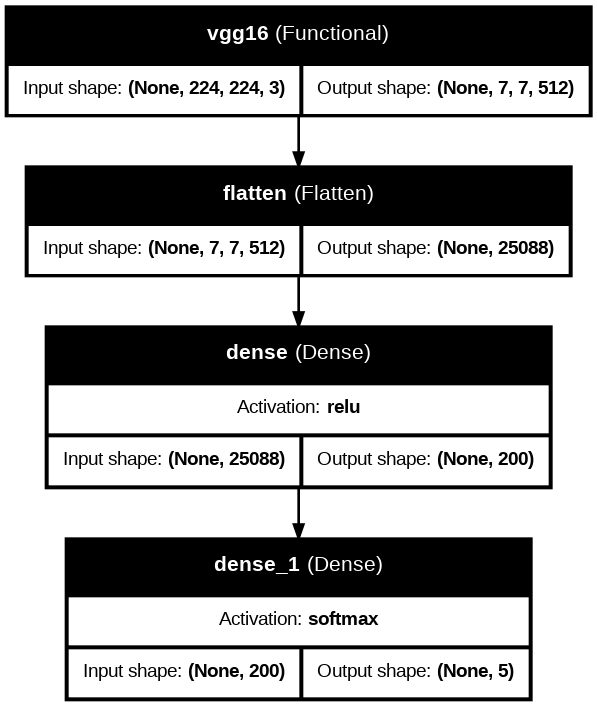

In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras import utils

# VGG16 Base model (without top fully connected layers)
vgg_base = VGG16(
    include_top=False,
    weights='imagenet',
    input_shape=(224, 224, 3)  # Input shape for 3-channel (RGB) images, change as needed
)

# Un-freezing the last block of convolution layers
vgg_base.trainable = True
set_trainable = False

# Loop through VGG16 layers and unfreeze from block5_conv1 onwards
for layer in vgg_base.layers:
    if layer.name == 'block5_conv1':  # Start unfreezing from this layer
        set_trainable = True

    if set_trainable:
        layer.trainable = True
    else:
        layer.trainable = False

# Build the full model with fully connected layers
vgg_model = Sequential()

# Add the VGG16 base model (with frozen layers)
vgg_model.add(vgg_base)

# Flatten the output from convolution layers
vgg_model.add(Flatten())

# Add dense layers
vgg_model.add(Dense(200, activation='relu'))  # First dense layer
vgg_model.add(Dense(5, activation='softmax'))  # Output layer for 5 classes

# Compile the model
vgg_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Plot the model architecture
utils.plot_model(
    vgg_model,
    show_shapes=True,
    show_dtype=False,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=False,
    dpi=96,
    layer_range=None,
    show_layer_activations=True
)


87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


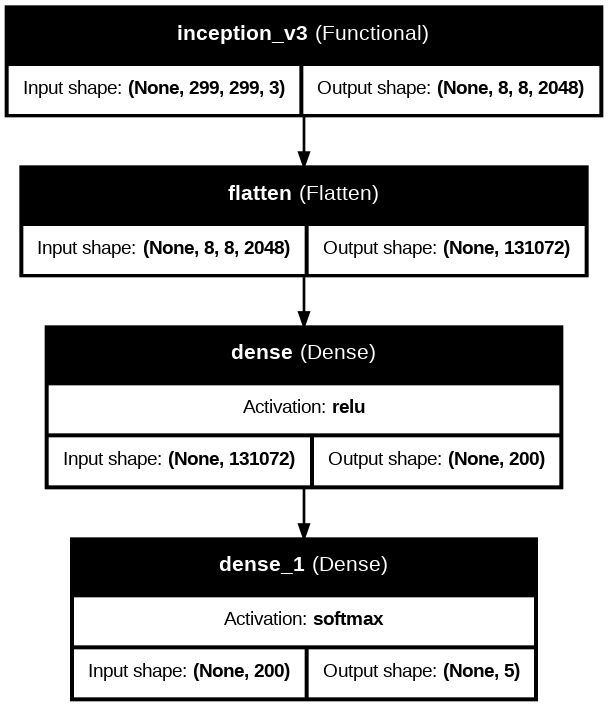

In [ ]:
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras import utils

# InceptionV3 Base model (without top fully connected layers)
inception_base = InceptionV3(
    include_top=False,
    weights='imagenet',
    input_shape=(299, 299, 3)  # Input shape for InceptionV3 (must be at least 75x75, typically 299x299)
)

# Un-freezing the last block of convolution layers
inception_base.trainable = True
set_trainable = False

# Loop through InceptionV3 layers and unfreeze from 'mixed7' onwards
for layer in inception_base.layers:
    if layer.name == 'mixed7':  # Start unfreezing from this layer
        set_trainable = True

    if set_trainable:
        layer.trainable = True
    else:
        layer.trainable = False

# Build the full model with fully connected layers
inception_model = Sequential()

# Add the InceptionV3 base model (with frozen layers)
inception_model.add(inception_base)

# Flatten the output from convolution layers
inception_model.add(Flatten())

# Add dense layers
inception_model.add(Dense(200, activation='relu'))  # First dense layer
inception_model.add(Dense(5, activation='softmax'))  # Output layer for 5 classes

# Compile the model
inception_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Plot the model architecture
utils.plot_model(
    inception_model,
    show_shapes=True,
    show_dtype=False,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=False,
    dpi=96,
    layer_range=None,
    show_layer_activations=True
)


83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


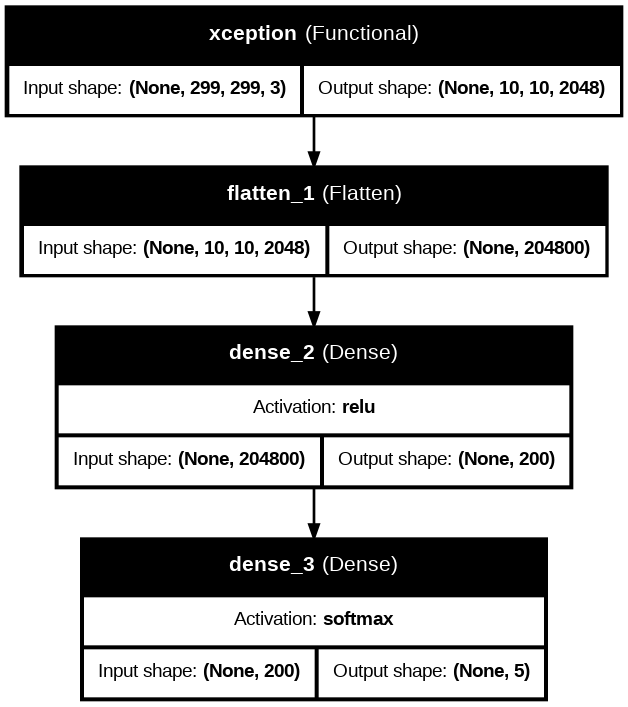

In [ ]:
from tensorflow.keras.applications import Xception
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras import utils

# Xception Base model (without top fully connected layers)
xception_base = Xception(
    include_top=False,
    weights='imagenet',
    input_shape=(299, 299, 3)  # Input shape for Xception (must be at least 71x71, typically 299x299)
)

# Un-freezing the last block of convolution layers
xception_base.trainable = True
set_trainable = False

# Loop through Xception layers and unfreeze from 'block14_sepconv1' onwards
for layer in xception_base.layers:
    if layer.name == 'block14_sepconv1':  # Start unfreezing from this layer
        set_trainable = True

    if set_trainable:
        layer.trainable = True
    else:
        layer.trainable = False

# Build the full model with fully connected layers
xception_model = Sequential()

# Add the Xception base model (with frozen layers)
xception_model.add(xception_base)

# Flatten the output from convolution layers
xception_model.add(Flatten())

# Add dense layers
xception_model.add(Dense(200, activation='relu'))  # First dense layer
xception_model.add(Dense(5, activation='softmax'))  # Output layer for 5 classes

# Compile the model
xception_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Plot the model architecture
utils.plot_model(
    xception_model,
    show_shapes=True,
    show_dtype=False,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=False,
    dpi=96,
    layer_range=None,
    show_layer_activations=True
)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


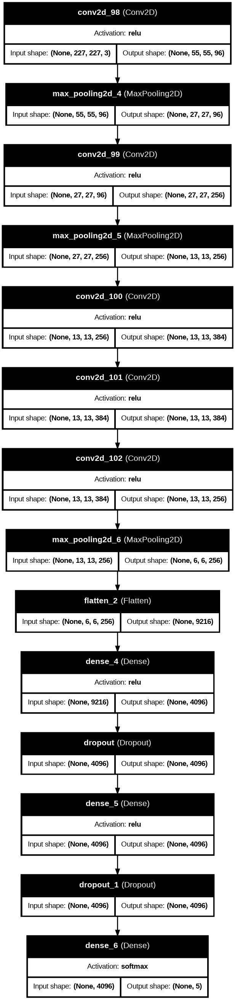

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras import utils

# Build the AlexNet-like model
alexnet_model = Sequential()

# Layer 1: Conv + MaxPooling
alexnet_model.add(Conv2D(filters=96, kernel_size=(11, 11), strides=(4, 4), activation='relu', input_shape=(227, 227, 3)))
alexnet_model.add(MaxPooling2D(pool_size=(3, 3), strides=(2, 2)))

# Layer 2: Conv + MaxPooling
alexnet_model.add(Conv2D(filters=256, kernel_size=(5, 5), padding='same', activation='relu'))
alexnet_model.add(MaxPooling2D(pool_size=(3, 3), strides=(2, 2)))

# Layer 3: Conv
alexnet_model.add(Conv2D(filters=384, kernel_size=(3, 3), padding='same', activation='relu'))

# Layer 4: Conv
alexnet_model.add(Conv2D(filters=384, kernel_size=(3, 3), padding='same', activation='relu'))

# Layer 5: Conv + MaxPooling
alexnet_model.add(Conv2D(filters=256, kernel_size=(3, 3), padding='same', activation='relu'))
alexnet_model.add(MaxPooling2D(pool_size=(3, 3), strides=(2, 2)))

# Flatten
alexnet_model.add(Flatten())

# Dense layers
alexnet_model.add(Dense(4096, activation='relu'))
alexnet_model.add(Dropout(0.5))
alexnet_model.add(Dense(4096, activation='relu'))
alexnet_model.add(Dropout(0.5))

# Output layer (adjust number of classes here)
alexnet_model.add(Dense(5, activation='softmax'))  # Output layer for 5 classes

# Compile the model
alexnet_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Plot the model architecture
utils.plot_model(
    alexnet_model,
    show_shapes=True,
    show_dtype=False,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=False,
    dpi=96,
    layer_range=None,
    show_layer_activations=True
)

